# Data Overview

## Project Proposal

**Title:** Anyone can be a Somm

**Project:** I enjoy wine and grew up with a family that spent whole vacations learning about and, of course, tasting new and different wines. I am still no wine connoisseur and need to look to the experts for help deciding which wines I might and should like. For this project I will use data from Wine Enthusiast Magazine (over 150K wines at least) to create a wine recommendation system for the average wine drinker. I plan to create groupings of wines/wine-drinkers based on the descriptions and reviews provided by sommeliers.  

## Data Description

### Context

After watching Somm (a documentary on master sommeliers) I wondered how I could create a predictive model to identify wines through blind tasting like a master sommelier would. The first step in this journey was gathering some data to train a model. I plan to use deep learning to predict the wine variety using words in the description/review. The model still won't be able to taste the wine, but theoretically it could identify the wine based on a description that a sommelier could give. If anyone has any ideas on how to accomplish this, please post them!

### Content

The data consists of 10 fields:

- **Points:** the number of points WineEnthusiast rated the wine on a scale of 1-100 (though they say they only post reviews for wines that score >=80)
- **Variety:** the type of grapes used to make the wine (ie Pinot Noir)
- **Description:** a few sentences from a sommelier describing the wine's taste, smell, look, feel, etc.
- **Country:** the country that the wine is from
- **Province:** the province or state that the wine is from
- **Region 1:** the wine growing area in a province or state (ie Napa)
- **Region 2:** sometimes there are more specific regions specified within a wine growing area (ie Rutherford inside the Napa Valley), but this value can sometimes be blank
- **Winery:** the winery that made the wine
- **Designation:** the vineyard within the winery where the grapes that made the wine are from
- **Price:** the cost for a bottle of the wine

### Acknowledgements

The data was scraped from WineEnthusiast during the week of June 15th, 2017. The code for the scraper can be found here if you have any more specific questions about data collection that I didn't address.

### Inspiration

I think that this dataset offers some great opportunities for sentiment analysis and other text related predictive models. My overall goal is to create a model that can identify the variety, winery, and location of a wine based on a description. If anyone has any ideas, breakthroughs, or other interesting insights/models please post them.

## Relevant Files

In [1]:
# winemag-data_first150k.csv

## Helpful Links

* http://www.winemag.com/
    * http://www.winemag.com/gallery/wine-tasting-terms-and-what-they-really-mean/#gallery-grid
* https://www.mastersommeliers.org/resources
* https://www.kaggle.com/zynicide/wine-reviews
* 

# Imports

In [2]:
# Basics
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import re
import string
import csv
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS

# MongoDB
from pymongo import MongoClient

# natural language processing
import nltk
from textblob import TextBlob

# sklearn
from sklearn.feature_extraction import text 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import scale
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD

from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score

# gensim
from gensim import corpora, models, similarities, matutils

# Other
import warnings
warnings.filterwarnings('ignore')


# Pull Data from MongoDB

In [4]:
# ssh -NL 12345:localhost:27017 myaws

In [3]:
# Access the port set by the SSH tunnel
client = MongoClient(port=12345) 

In [4]:
# Port Info
address = client.address
db_names = client.database_names()
host = client.HOST
port = client.PORT

print('address: ', address, '\n',
      'databases: ', db_names, '\n',
      'host: ', host, '\n', 
      'port: ', port)

address:  ('localhost', 12345) 
 databases:  ['admin', 'dog', 'fletcher', 'local', 'new_cool_db'] 
 host:  localhost 
 port:  27017


In [5]:
# call to fletcher database
db = client.fletcher

# collections within fletcher db
db.collection_names()

['wine', 'testData']

In [6]:
# extract wine data and create pandas dataframe
wine_data = db.wine
df = pd.DataFrame(list(wine_data.find()))
df.head()

,_id,country,description,designation,points,price,province,region_1,region_2,variety,winery
0,59f797779c2cf2588968d9df,US,This tremendous 100% varietal wine hails from ...,Martha's Vineyard,96,235.0,California,Napa Valley,Napa,Cabernet Sauvignon,Heitz
1,59f797c59c2cf2588968d9e0,Spain,"Ripe aromas of fig, blackberry and cassis are ...",Carodorum Selección Especial Reserva,96,110.0,Northern Spain,Toro,NaN,Tinta de Toro,Bodega Carmen Rodríguez
2,59f797c59c2cf2588968d9e1,US,Mac Watson honors the memory of a wine once ma...,Special Selected Late Harvest,96,90.0,California,Knights Valley,Sonoma,Sauvignon Blanc,Macauley
3,59f797c59c2cf2588968d9e2,US,"This spent 20 months in 30% new French oak, an...",Reserve,96,65.0,Oregon,Willamette Valley,Willamette Valley,Pinot Noir,Ponzi
4,59f797c59c2cf2588968d9e3,France,"This is the top wine from La Bégude, named aft...",La Brûlade,95,66.0,Provence,Bandol,NaN,Provence red blend,Domaine de la Bégude


# Basic Text Processing

## Functions

In [7]:
def docs_to_string(collection):
    text = ''
    for doc in collection:
        text += doc
    return text

In [8]:
def apply_regex(collection):
    alphanumeric = lambda x: re.sub(r"""\w*\d\w*""", ' ', x) # replace numbers with spaces
    punc_lower = lambda x: re.sub('[%s]' % re.escape(string.punctuation), '', x.lower()) # replace punc with nothing
    
    return collection.map(alphanumeric).map(punc_lower)

In [9]:
def docs_to_vec(collection, 
                vec_type, stopwords=None, binary=True, 
                ngrams=(1,1), accents='ascii',
               max_df=1.0, min_df=1):
    
    '''Takes a vectorizer type and fit-transforms it to a pandas 
        series or some other type of iterable
        
        collection: iterable to vectorize
        vec_type: CountVectorizer or TfidfVectorizer
        rest: various inputs for vectorizer
        
        '''
    
    vectorizer = vec_type(stop_words=stopwords, binary=binary, 
                          ngram_range=ngrams, strip_accents=accents,
                         max_df=max_df, min_df=min_df,
                         token_pattern="[a-z][a-z]+\w")
    
    dtm = vectorizer.fit_transform(collection)
    
    df = pd.DataFrame(dtm.toarray(), columns=vectorizer.get_feature_names()).head()
    
    return vectorizer, dtm, df


In [10]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

## Regex to remove numbers and punctuation and capitalization

In [11]:
# Create sub-set of original dataframe 
# include: description, variety, country, price
wine_df = pd.DataFrame()
wine_df['description'] = df.description
wine_df['variety'] = df.variety
wine_df['country'] = df.country
wine_df['price'] = df.price

In [12]:
# Remove non-alphabetic characters
# Remove capital letters and punctuation
alphanumeric = lambda x: re.sub(r"""\w*\d\w*""", ' ', x) # replace numbers with spaces
punc_lower = lambda x: re.sub('[%s]' % re.escape(string.punctuation), ' ', x.lower()) # replace punc with nothing


wine_df['description'] = apply_regex(wine_df.description)
wine_df['variety'] = wine_df.variety.map(alphanumeric).map(punc_lower)
wine_df['country'] = wine_df.country.fillna('unknown').map(punc_lower)

In [13]:
# Create final dataframe without duplicates
wine = wine_df.drop_duplicates(subset=['description'])

In [14]:
# no duplicates vs. duplicates length
wine.shape, wine_df.shape

((97817, 4), (150931, 4))

In [15]:
wine.reset_index(inplace=True)

In [16]:
wine.index

RangeIndex(start=0, stop=97817, step=1)

## Consolidate Varieties

In [108]:
# (wine.variety.value_counts()) # 632 different varieties

# need a dictionary to translate names into same language and to group wines by similar wines
# to consolidate smaller batches

In [17]:
wine_dict = pd.read_csv('wine_dict.csv', delimiter='\n', header=None)
wine_dict.columns = ['varieties']

In [18]:
wine_dict.head()

,varieties
0,agiorgitiko
1,aglianico
2,aidani
3,airen
4,"albariño, alvarinho, alvarinho chardonnay"


In [19]:
var_list = []
for i in range(len(wine_dict.varieties)):
    var_list.append(list((wine_dict.varieties[i]).split(',')))

wine_dict['varieties'] = var_list

In [20]:
new_var_list = []
for var_list in wine_dict.varieties:
    new_var_list.append([x.strip(' ') for x in var_list])
    
wine_dict['varieties'] = new_var_list

In [21]:
first_var = []
for var in wine_dict.varieties:
    first_var.append(var[0])
    
wine_dict['first_var'] = first_var

In [22]:
# row = wine_dict[wine_dict.varieties.map(lambda x: wine.variety[100] in x)]
# row['first_var'].to_string(index=False)

In [23]:
main_varieties = []
for variety in wine.variety:
    row = wine_dict[wine_dict.varieties.map(lambda x: variety in x)]
    main_variety = row['first_var'].to_string(index=False)
    main_varieties.append(main_variety)

In [24]:
main_varieties

['cabernet sauvignon',
 'tempranillo',
 'sauvignon',
 'pinot noir',
 'provence red blend',
 'tempranillo',
 'tempranillo',
 'tempranillo',
 'pinot noir',
 'pinot noir',
 'tokaji',
 'pinot noir',
 'pinot noir',
 'tannat',
 'pinot noir',
 'chardonnay',
 'cabernet sauvignon',
 'tempranillo',
 'malbec',
 'pinot noir',
 'rosé',
 'tempranillo',
 'tempranillo',
 'chardonnay',
 'pinot noir',
 'chardonnay',
 'pinot noir',
 'pinot noir',
 'pinot noir',
 'syrah',
 'mavroudi',
 'chardonnay',
 'sangiovese',
 'sparkling blend',
 'chardonnay',
 'sangiovese',
 'rhône style white blend',
 'sangiovese',
 'sangiovese',
 'red blend',
 'mencía',
 'palomino',
 'petite sirah',
 'red blend',
 'syrah',
 'red blend',
 'sangiovese',
 'cabernet sauvignon',
 'sangiovese',
 'cabernet sauvignon',
 'sangiovese',
 'chardonnay',
 'sauvignon',
 'pinot noir',
 'chardonnay',
 'cabernet sauvignon',
 'sauvignon',
 'riesling',
 'cabernet sauvignon',
 'red blend',
 'malbec',
 'pinot noir',
 'malbec',
 'chardonnay',
 'portugue

In [25]:
wine['main_var'] = main_varieties
wine.head()

,index,description,variety,country,price,main_var
0,0,this tremendous varietal wine hails from oak...,cabernet sauvignon,us,235.0,cabernet sauvignon
1,1,ripe aromas of fig blackberry and cassis are s...,tinta de toro,spain,110.0,tempranillo
2,2,mac watson honors the memory of a wine once ma...,sauvignon blanc,us,90.0,sauvignon
3,3,this spent months in new french oak and in...,pinot noir,us,65.0,pinot noir
4,4,this is the top wine from la bégude named afte...,provence red blend,france,66.0,provence red blend


## Stemming

In [135]:
# from nltk.stem import *
# SnowballStemmer = nltk.stem.snowball.SnowballStemmer("english")
PorterStemmer =  nltk.stem.snowball.PorterStemmer()

In [96]:
wine_df['reviews_stem'] = wine_df.reviews

In [119]:
revs_stm = wine_df.reviews.tolist()

In [122]:
type(revs_stm)

list

In [136]:
PorterStemmer.stem('mint'), PorterStemmer.stem('minty'), PorterStemmer.stem('mints')

('mint', 'minti', 'mint')

In [138]:
new_revs_stm = []
for rev in revs_stm:
    new_rev = ''
    for word in rev.split():
        new_rev += (SnowballStemmer.stem(word)) + ' '
    new_revs_stm.append(new_rev)

In [139]:
wine_df['reviews_stem'] = new_revs_stm

In [140]:
wine_df.reviews_stem.head(10)

0    this tremend variet wine hail from oakvill and...
1    ripe aroma of fig blackberri and cassi are sof...
2    mac watson honor the memori of a wine onc made...
3    this spent month in new french oak and incorpo...
4    this is the top wine from la bégude name after...
5    deep dens and pure from the open bell this tor...
6    slight gritti blackfruit aroma includ a sweet ...
7    lush cedari blackfruit aroma are lux and offer...
8    this renam vineyard was former bottl as delanc...
9    the produc sourc from two block of the vineyar...
Name: reviews_stem, dtype: object

## My Stop Words

In [26]:
# most common words after LSA 1: 
# wine, aromas, palate, tannins, notes, berry, cherry, fruit, flavors, acidity, drink
# remove most common words
common_words = ['wine','wines','aroma','aromas','palate','note','notes',
                'flavor','flavors','finish','acidity','drink','drinks',
               'year', 'years', 'fruit', 'fruits','pinot', 'noir']
my_stop_words = text.ENGLISH_STOP_WORDS.union(common_words)

# Topic Modeling

## TFIDF

In [27]:
# Unigrams, indicators, my stop words
tfidf, dtm_tfidf, df_tfidf = docs_to_vec(wine.description, 
                                        TfidfVectorizer, stopwords=my_stop_words)
df_tfidf

,aah,aalto,aand,aaron,abacela,abacelas,abadal,abadia,abandon,abandoned,...,zotovich,zotzenbergs,zuccardi,zucchini,zumayas,zuri,zweigelt,zweigeltfeatures,zweigelts,zwiegelt
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## LSA: 2 Topics

In [28]:
# wine_tfidf1 tfidf1
model = TruncatedSVD(2, algorithm = 'randomized')
lsa = model.fit_transform(dtm_tfidf)

In [29]:
lsa

array([[ 0.10879069, -0.01519231],
       [ 0.13885261, -0.05797817],
       [ 0.07088605,  0.05011918],
       ..., 
       [ 0.06549035, -0.00383554],
       [ 0.10465389,  0.09674463],
       [ 0.06857685,  0.07298387]])

In [30]:
# topic - term
(model.components_).shape

(2, 42177)

In [31]:
# doc - topic
(lsa).shape

(97817, 2)

In [32]:
lsa[:,0]

array([ 0.10879069,  0.13885261,  0.07088605, ...,  0.06549035,
        0.10465389,  0.06857685])

In [95]:
# topic_term_doc = np.dot(lsa, model.components_)

In [94]:
display_topics(model, tfidf.get_feature_names(), 50)


Topic  0
tannins, cherry, ripe, black, dry, rich, spice, soft, sweet, red, oak, blackberry, berry, fresh, good, shows, plum, crisp, texture, dark, blend, chocolate, vanilla, nose, fruity, firm, cabernet, structure, offers, character, juicy, light, bright, smooth, raspberry, pepper, balanced, touch, mouth, white, citrus, green, currant, apple, spicy, wood, tannic, fine, sauvignon, theres

Topic  1
crisp, apple, citrus, fresh, peach, white, pear, lemon, clean, green, light, pineapple, chardonnay, lime, melon, bright, grapefruit, creamy, honey, apricot, tropical, orange, fruity, mineral, blanc, touch, refreshing, yellow, stone, simple, lively, vanilla, zesty, zest, riesling, almond, nose, minerality, floral, texture, sweet, attractive, apples, character, tangy, toast, easy, buttered, style, honeysuckle


In [ ]:
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

In [33]:
prob_terms_doc = np.dot(lsa[1][0],(model.components_[0]))
x = (', '.join([tfidf.get_feature_names()[i] for i in prob_terms_doc.argsort()[:-20-1:-1]]))

In [34]:
sorted_topic0 = [b[0] for b in sorted(enumerate(lsa[:,0]),key=lambda i:i[1])]
sorted_topic1 = [b[0] for b in sorted(enumerate(lsa[:,1]),key=lambda i:i[1])]

In [35]:
from collections import defaultdict
# TOPIC 0 AXIS:
# top 30 wines
top0 = sorted_topic0[-30:]
top0_terms = defaultdict(int)
for win in top0:
    prob_terms_doc = np.dot(lsa[win][0],(model.components_[0]))
    terms = (([tfidf.get_feature_names()[i] for i in prob_terms_doc.argsort()[:-20-1:-1]]))
    for t in terms:
        top0_terms[t] += 1


In [36]:
top0_terms.keys()

dict_keys(['tannins', 'cherry', 'ripe', 'black', 'dry', 'rich', 'spice', 'soft', 'sweet', 'red', 'oak', 'blackberry', 'berry', 'fresh', 'good', 'shows', 'plum', 'crisp', 'texture', 'dark'])

In [978]:
# bottom 30 wines
bottom0 = sorted_topic0[:31]
bottom0_terms = defaultdict(int)
for win in bottom0:
    prob_terms_doc = np.dot(lsa[win][0],(model.components_[0]))
    terms = (([tfidf.get_feature_names()[i] for i in prob_terms_doc.argsort()[:-20-1:-1]]))
    for t in terms:
        bottom0_terms[t] += 1


In [987]:
bottom0_terms.keys()

dict_keys(['flom', 'judi', 'sorensen', 'outnot', 'odiferous', 'publics', 'katrina', 'victims', 'sympathy', 'promotional', 'cynical', 'hurricane', 'dillflavored', 'strawberrybanana', 'mawkish', 'glueysweet', 'raytheon', 'ceo', 'wilkinson', 'services', 'tannins', 'cherry', 'ripe', 'black', 'dry', 'rich', 'spice', 'soft', 'sweet', 'red', 'oak', 'blackberry', 'berry', 'fresh', 'good', 'shows', 'plum', 'crisp', 'texture', 'dark'])

In [980]:
# TOPIC 1 AXIS:
# top 30 wines
top1 = sorted_topic1[-30:]
top1_terms = defaultdict(int)
for win in top1:
    prob_terms_doc = np.dot(lsa[win][1],(model.components_[1]))
    terms = (([tfidf.get_feature_names()[i] for i in prob_terms_doc.argsort()[:-20-1:-1]]))
    for t in terms:
        top1_terms[t] += 1


In [988]:
top1_terms.keys()

dict_keys(['crisp', 'apple', 'citrus', 'fresh', 'peach', 'white', 'pear', 'lemon', 'green', 'clean', 'light', 'pineapple', 'chardonnay', 'lime', 'melon', 'bright', 'grapefruit', 'creamy', 'honey', 'apricot'])

In [984]:
# bottom 30 wines
bottom1 = sorted_topic1[:31]
bottom1_terms = defaultdict(int)
for win in bottom1:
    prob_terms_doc = np.dot(lsa[win][1],(model.components_[1]))
    terms = (([tfidf.get_feature_names()[i] for i in prob_terms_doc.argsort()[:-20-1:-1]]))
    for t in terms:
        bottom1_terms[t] += 1

In [989]:
bottom1_terms.keys()

dict_keys(['tannins', 'black', 'cherry', 'blackberry', 'dark', 'cabernet', 'chocolate', 'firm', 'plum', 'currant', 'tannic', 'merlot', 'licorice', 'berry', 'dense', 'tobacco', 'cassis', 'leather', 'red', 'syrah'])

In [37]:
wine['topic1'] = lsa[:,0]
wine['topic2'] = lsa[:,1]

In [97]:
wine.to_csv('wine_2_topics.csv')

In [99]:
country_colors = plt.cm.Set3(np.linspace(0, 1, 53))
country_colors_dict = {}
for i, country in enumerate(set(wine.country)):
    country_colors_dict[country] = country_colors[i]

In [34]:
country_colors_dict2 = {}
for key,value in country_colors_dict.items():
    if key not in country_colors_dict2.keys():
        try:
            math.isnan(float(key))
            pass
        except:
            country_colors_dict2[key] = value

In [374]:
wine["country_colors"] = wine["country"].map(country_colors_dict)
# wine.country_colors.fillna('k', inplace=True)

In [38]:
colors = []
for row in lsa:
    if row[0] > row[1]:
        colors.append('r')
    else:
        colors.append('b')
        
# color by which topic is bigger for each document

In [39]:
# The 18 Noble Grapes:
# 9 Noble Reds and Whites Light to Dark:
noble_reds = ['pinot noir', 'grenache', 'merlot', 'sangiovese', 
              'nebbiolo', 'tempranillo', 'cabernet sauvignon', 
              'syrah', 'malbec']
noble_whites = ['pinot grigio', 'riesling', 'sauvignon', 
                'chenin blanc', 'moscato', 'gewürztraminer', 
                'sémillon', 'viognier', 'chardonnay'] # 'gewurztraminer',

In [998]:
wine.head()

,index,description,country,price,variety,main_var
0,0,this tremendous varietal wine hails from oakville and was aged over three years in oak juicy redcherry fruit and a compelling hint of caramel greet the palate framed by elegant fine tannins and a subtle minty tone in the background balanced and rewarding from start to finish it has years ahead of it to develop further nuance enjoy –,us,235.0,cabernet sauvignon,cabernet sauvignon
1,1,ripe aromas of fig blackberry and cassis are softened and sweetened by a slathering of oaky chocolate and vanilla this is full layered intense and cushioned on the palate with rich flavors of chocolaty black fruits and baking spices a toasty everlasting finish is heady but ideally balanced drink through,spain,110.0,tinta de toro,tempranillo
2,2,mac watson honors the memory of a wine once made by his mother in this tremendously delicious balanced and complex botrytised white dark gold in color it layers toasted hazelnut pear compote and orange peel flavors reveling in the succulence of its gl of residual sugar,us,90.0,sauvignon blanc,sauvignon
3,3,this spent months in new french oak and incorporates fruit from ponzis aurora abetina and madrona vineyards among others aromatic dense and toasty it deftly blends aromas and flavors of toast cigar box blackberry black cherry coffee and graphite tannins are polished to a fine sheen and frame a finish loaded with dark chocolate and espresso drink now through,us,65.0,pinot noir,pinot noir
4,4,this is the top wine from la bégude named after the highest point in the vineyard at feet it has structure density and considerable acidity that is still calming down with months in wood the wine has developing an extra richness and concentration produced by the tari family formerly of château giscours in margaux it is a wine made for aging drink from,france,66.0,provence red blend,provence red blend


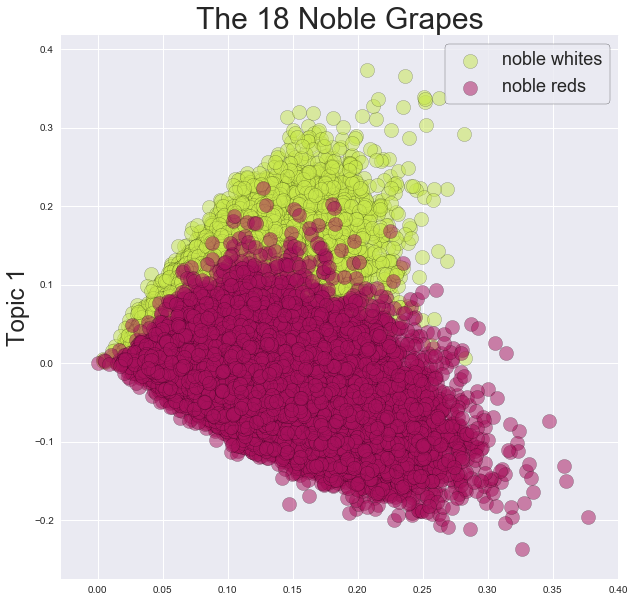

In [40]:
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(lsa[wine.main_var.isin(noble_whites),0], 
            lsa[wine.main_var.isin(noble_whites),1],
            alpha=alpha, c='#C8E84B', s=200, edgecolor='k');
plt.scatter(lsa[wine.main_var.isin(noble_reds),0], 
            lsa[wine.main_var.isin(noble_reds),1],
            alpha=alpha, c='#A8115C', s=200,edgecolor='k');

plt.legend(['noble whites', 'noble reds'], 
           fontsize=18, frameon=True, edgecolor='k');
# plt.xlabel('Topic 0', fontsize=24);
plt.ylabel('Topic 1', fontsize=24);
plt.title('The 18 Noble Grapes', fontsize=30);


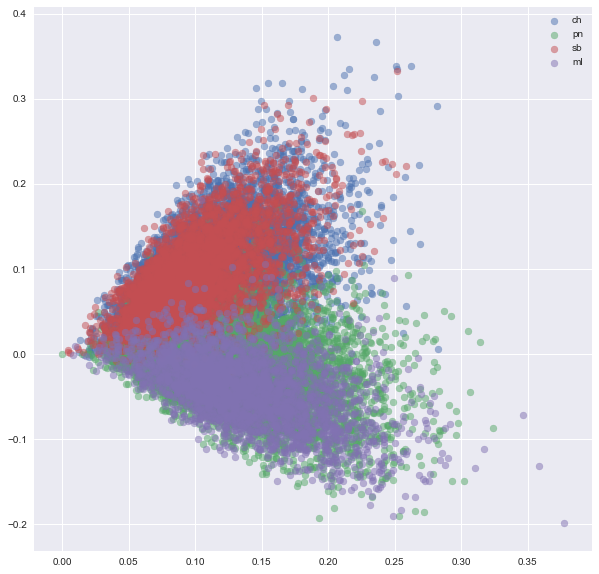

In [38]:
wine_df.variety.value_counts()
# chardonnay = wine_df[wine_df.variety=='chardonnay']
# chardonnay
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(lsa[wine.variety=='chardonnay',0], lsa[wine.variety=='chardonnay',1],alpha=alpha)
plt.scatter(lsa[wine.variety=='pinot noir',0], lsa[wine.variety=='pinot noir',1],alpha=alpha)
plt.scatter(lsa[wine.variety=='sauvignon blanc',0], lsa[wine.variety=='sauvignon blanc',1],alpha=alpha)
plt.scatter(lsa[wine.variety=='merlot',0], lsa[wine.variety=='merlot',1],alpha=alpha)
plt.legend(['ch','pn','sb','ml'])

In [109]:
for i, x in enumerate(wine.variety):
    y = metrics.pairwise.cosine_similarity(lsa[i], Y=lsa[0], dense_output=True)
    if y > 0.9:
        print(x, y)

cabernet sauvignon [[ 1.]]
tinta de toro [[ 0.96482335]]
provence red blend [[ 0.99465834]]
tinta de toro [[ 0.93902604]]
tinta de toro [[ 0.99321995]]
tinta de toro [[ 0.94622827]]
pinot noir [[ 0.97166316]]
pinot noir [[ 0.99485516]]
pinot noir [[ 0.99974534]]
tannat [[ 0.99554612]]
pinot noir [[ 0.99679822]]
cabernet sauvignon [[ 0.9769498]]
tempranillo [[ 0.97387855]]
malbec [[ 0.9724098]]
tempranillo blend [[ 0.96290476]]
tinta de toro [[ 0.9373529]]
pinot noir [[ 0.99554533]]
pinot noir [[ 0.98898947]]
pinot noir [[ 0.94476397]]
pinot noir [[ 0.9967813]]
mavrud [[ 0.94664227]]
sangiovese [[ 0.92677607]]
sangiovese [[ 0.99302682]]
red blend [[ 0.97827836]]
mencía [[ 0.99921325]]
petite sirah [[ 0.99991681]]
red blend [[ 0.98622811]]
syrah [[ 0.90428286]]
red blend [[ 0.90579672]]
sangiovese [[ 0.95536933]]
sangiovese [[ 0.96087655]]
cabernet sauvignon [[ 0.96775525]]
sangiovese [[ 0.91174509]]
chardonnay [[ 0.96634701]]
pinot noir [[ 0.95031139]]
cabernet sauvignon [[ 0.96624763]]

alicante bouschet [[ 0.99630802]]
malbec [[ 0.99020514]]
portuguese red [[ 0.96911954]]
malbec [[ 0.99989442]]
cabernet sauvignon [[ 0.9725646]]
rosé [[ 0.9643754]]
portuguese red [[ 0.99990112]]
portuguese red [[ 0.95156008]]
pinot noir [[ 0.98077083]]
pinot noir [[ 0.98074228]]
gamay [[ 0.90195007]]
portuguese red [[ 0.91495755]]
portuguese red [[ 0.9673993]]
portuguese red [[ 0.93198106]]
pinot noir [[ 0.94866961]]
syrah [[ 0.92067069]]
portuguese red [[ 0.95605593]]
portuguese red [[ 0.99663217]]
portuguese red [[ 0.99960348]]
bordeaux style red blend [[ 0.99885445]]
gamay [[ 0.96271197]]
red blend [[ 0.95719047]]
red blend [[ 0.91922005]]
pinot noir [[ 0.95134369]]
petit verdot [[ 0.99490637]]
red blend [[ 0.91990655]]
portuguese red [[ 0.9983631]]
pinot noir [[ 0.96576398]]
petite verdot [[ 0.97727757]]
touriga nacional [[ 0.98802383]]
portuguese red [[ 0.99123267]]
pinot noir [[ 0.98831595]]
nebbiolo [[ 0.98898473]]
pinot noir [[ 0.99946591]]
merlot [[ 0.95716712]]
cabernet fran

pinot noir [[ 0.99237584]]
portuguese red [[ 0.96319941]]
zinfandel [[ 0.9895845]]
merlot [[ 0.99947681]]
merlot [[ 0.93813759]]
petite sirah [[ 0.9626545]]
pinot noir [[ 0.99645645]]
pinot noir [[ 0.96361663]]
nebbiolo [[ 0.95896006]]
tempranillo [[ 0.96532512]]
tempranillo blend [[ 0.99905881]]
red blend [[ 0.99303581]]
tempranillo blend [[ 0.98738397]]
tempranillo blend [[ 0.99829365]]
rosé [[ 0.99399324]]
carmenère [[ 0.91281965]]
pinot noir [[ 0.93236823]]
zinfandel [[ 0.98731602]]
cabernet franc [[ 0.97585744]]
zinfandel [[ 0.96847435]]
pinot noir [[ 0.99587416]]
zinfandel [[ 0.99999525]]
rhône style red blend [[ 0.98786082]]
syrah [[ 0.96868217]]
pinot noir [[ 0.99652201]]
grenache [[ 0.99235266]]
pinot noir [[ 0.99179947]]
syrah [[ 0.94040105]]
cabernet franc [[ 0.9520171]]
pinot noir [[ 0.96207833]]
sangiovese [[ 0.93693271]]
zinfandel [[ 0.94422333]]
red blend [[ 0.93916608]]
syrah [[ 0.98907982]]
syrah [[ 0.90125709]]
pinot noir [[ 0.94951013]]
sangiovese [[ 0.924417]]
syrah

bordeaux style red blend [[ 0.94301645]]
pinot noir [[ 0.99306529]]
bordeaux style red blend [[ 0.95572692]]
sangiovese [[ 0.91824348]]
sangiovese [[ 0.99849117]]
sangiovese [[ 0.99952585]]
carignan [[ 0.94397462]]
pinot noir [[ 0.9946687]]
pinot noir [[ 0.98081658]]
cabernet shiraz [[ 0.96886311]]
bordeaux style white blend [[ 0.96831396]]
bordeaux style red blend [[ 0.99539263]]
bordeaux style red blend [[ 0.9989078]]
bordeaux style red blend [[ 0.96998379]]
red blend [[ 0.98607954]]
zinfandel [[ 0.9612228]]
cabernet franc [[ 0.99899437]]
cabernet sauvignon [[ 0.99953529]]
red blend [[ 0.99299792]]
cabernet sauvignon [[ 0.92203617]]
sangiovese [[ 0.9995853]]
bordeaux style red blend [[ 0.93077449]]
cabernet sauvignon [[ 0.93489878]]
syrah [[ 0.99697847]]
malbec [[ 0.95095298]]
sherry [[ 0.93196935]]
cabernet sauvignon merlot [[ 0.99137564]]
red blend [[ 0.97416791]]
bordeaux style red blend [[ 0.96706426]]
bordeaux style red blend [[ 0.92907613]]
pinot noir [[ 0.90250134]]
portuguese

bordeaux style red blend [[ 0.94270636]]
pinot noir [[ 0.96942758]]
cabernet sauvignon [[ 0.99998208]]
red blend [[ 0.99860874]]
cannonau [[ 0.9722453]]
zinfandel [[ 0.98372764]]
nero d avola [[ 0.94245718]]
cabernet sauvignon [[ 0.98986075]]
zinfandel [[ 0.99447974]]
tempranillo [[ 0.98298556]]
garnacha [[ 0.96039976]]
barbera [[ 0.97012236]]
pinot noir [[ 0.93476722]]
sangiovese [[ 0.94929158]]
pinot noir [[ 0.99923715]]
pinot noir [[ 0.99621541]]
pinot noir [[ 0.99965869]]
carignan [[ 0.99930191]]
pinot noir [[ 0.96801465]]
sangiovese [[ 0.99259768]]
pinot noir [[ 0.92688927]]
pinot noir [[ 0.91409377]]
red blend [[ 0.90960053]]
pinot gris [[ 0.90967411]]
pinot noir [[ 0.98883083]]
tempranillo blend [[ 0.96228524]]
bordeaux style red blend [[ 0.94628345]]
bordeaux style red blend [[ 0.96965131]]
bordeaux style red blend [[ 0.99058017]]
cabernet sauvignon [[ 0.92313424]]
cabernet franc [[ 0.94317722]]
red blend [[ 0.97269025]]
red blend [[ 0.99773782]]
monastrell [[ 0.99524423]]
sang

sangiovese [[ 0.90791349]]
tempranillo [[ 0.97807029]]
mencía [[ 0.98026655]]
red blend [[ 0.9412298]]
merlot [[ 0.98016121]]
sangiovese [[ 0.95973156]]
cabernet sauvignon [[ 0.97673098]]
pinot noir [[ 0.99912389]]
red blend [[ 0.97273723]]
red blend [[ 0.97074152]]
rhône style red blend [[ 0.92491414]]
barbera [[ 0.96895753]]
portuguese red [[ 0.99438061]]
red blend [[ 0.99316381]]
red blend [[ 0.97742414]]
merlot [[ 0.96550981]]
nebbiolo [[ 0.9456379]]
nebbiolo [[ 0.93994934]]
nebbiolo [[ 0.99543514]]
lemberger [[ 0.99852241]]
mencía [[ 0.97796628]]
syrah [[ 0.95008201]]
blaufränkisch [[ 0.98811301]]
grüner veltliner [[ 0.91196633]]
pinot noir [[ 0.96042485]]
rosé [[ 0.93338655]]
syrah [[ 0.99987771]]
zweigelt [[ 0.99691806]]
pinot noir [[ 0.98196718]]
malbec [[ 0.93145414]]
syrah [[ 0.97066677]]
tinta de toro [[ 0.97211561]]
cabernet franc [[ 0.91548689]]
tempranillo blend [[ 0.98078392]]
cabernet sauvignon [[ 0.93883987]]
cabernet sauvignon [[ 0.98473763]]
cabernet sauvignon [[ 0.9

pinot noir [[ 0.99836526]]
pinot noir [[ 0.99629314]]
merlot [[ 0.97586432]]
merlot [[ 0.99857867]]
red blend [[ 0.99713319]]
tempranillo [[ 0.98602909]]
pinot noir [[ 0.99951279]]
agiorgitiko [[ 0.97162517]]
red blend [[ 0.9141956]]
pinot noir [[ 0.96794386]]
cabernet sauvignon [[ 0.94024192]]
pinot noir [[ 0.99966639]]
pinot noir [[ 0.99721892]]
pinot noir [[ 0.99571146]]
bordeaux style red blend [[ 0.99967514]]
red blend [[ 0.92748482]]
bordeaux style red blend [[ 0.99367675]]
red blend [[ 0.97778311]]
sangiovese [[ 0.99793389]]
malbec [[ 0.99526454]]
tempranillo [[ 0.99883664]]
bordeaux style red blend [[ 0.94798395]]
rosé [[ 0.97316956]]
red blend [[ 0.99980641]]
petit verdot [[ 0.92047834]]
tempranillo [[ 0.98472586]]
cabernet sauvignon [[ 0.99153201]]
bordeaux style red blend [[ 0.97988568]]
red blend [[ 0.99195341]]
monastrell [[ 0.99516303]]
tempranillo [[ 0.99440035]]
bordeaux style red blend [[ 0.98872732]]
tannat [[ 0.94837662]]
cabernet sauvignon [[ 0.98797499]]
cabernet s

merlot syrah [[ 0.98451092]]
barbera [[ 0.9778151]]
pinot noir [[ 0.99010363]]
pinot noir [[ 0.98791404]]
malbec [[ 0.91046043]]
malbec merlot [[ 0.99815657]]
pinot noir [[ 0.9520365]]
portuguese red [[ 0.92316917]]
baga [[ 0.99997456]]
moscatel [[ 0.98453371]]
chardonnay [[ 0.94276337]]
cabernet blend [[ 0.94378546]]
shiraz [[ 0.97561476]]
sangiovese [[ 0.99818955]]
cabernet sauvignon [[ 0.99944599]]
bordeaux style red blend [[ 0.97972467]]
bordeaux style red blend [[ 0.94110747]]
bordeaux style red blend [[ 0.95037343]]
bordeaux style white blend [[ 0.937949]]
bordeaux style red blend [[ 0.97662327]]
pinot noir [[ 0.98393657]]
bordeaux style red blend [[ 0.95925108]]
bordeaux style red blend [[ 0.91965957]]
pinot noir [[ 0.99653009]]
pinot noir [[ 0.96606185]]
pinot noir [[ 0.99973641]]
pinot noir [[ 0.94148757]]
pinot noir [[ 0.99999908]]
cabernet sauvignon [[ 0.99934236]]
sangiovese [[ 0.98909243]]
pinot noir [[ 0.99663468]]
pinot noir [[ 0.99380752]]
bordeaux style red blend [[ 0.

barbera [[ 0.95841141]]
chardonnay [[ 0.92136033]]
syrah [[ 0.96143454]]
merlot [[ 0.91084746]]
syrah [[ 0.93632482]]
tempranillo [[ 0.96617861]]
merlot [[ 0.95367447]]
chardonnay [[ 0.9597347]]
cabernet sauvignon [[ 0.9866134]]
red blend [[ 0.99760635]]
pinot noir [[ 0.99179078]]
red blend [[ 0.95874376]]
tempranillo blend [[ 0.95466132]]
pinot noir [[ 0.92169024]]
portuguese red [[ 0.92547871]]
bordeaux style red blend [[ 0.99943243]]
carmenère [[ 0.99132823]]
monastrell [[ 0.94882869]]
rhône style red blend [[ 0.99958694]]
agiorgitiko [[ 0.99471097]]
pinot noir [[ 0.98942393]]
pinot noir [[ 0.94407613]]
red blend [[ 0.95772624]]
pinot noir [[ 0.97836459]]
gewürztraminer [[ 0.91565359]]
red blend [[ 0.9465169]]
red blend [[ 0.99894712]]
zinfandel [[ 0.99408275]]
port [[ 0.95619724]]
red blend [[ 0.98142848]]
cabernet sauvignon [[ 0.9520339]]
portuguese red [[ 0.96431663]]
malbec [[ 0.99047893]]
g s m [[ 0.98005748]]
pinot noir [[ 0.99722656]]
red blend [[ 0.97359761]]
pinot noir [[ 0

garnacha [[ 0.92586028]]
rhône style red blend [[ 0.99064523]]
merlot [[ 0.97497342]]
red blend [[ 0.99237467]]
malbec [[ 0.99999364]]
pinot noir [[ 0.98304361]]
pinot noir [[ 0.97136049]]
cabernet sauvignon [[ 0.94095964]]
tempranillo [[ 0.95199529]]
cabernet sauvignon [[ 0.99023003]]
red blend [[ 0.99782438]]
bordeaux style red blend [[ 0.94111728]]
sparkling blend [[ 0.9469573]]
pinot noir [[ 0.99781685]]
tempranillo [[ 0.9833272]]
pinot noir [[ 0.98834333]]
pinot noir [[ 0.99346708]]
shiraz [[ 0.99121027]]
pinot noir [[ 0.99671671]]
red blend [[ 0.97826476]]
mourvèdre [[ 0.99769899]]
zinfandel [[ 0.95813187]]
grenache [[ 0.99885788]]
pinot noir [[ 0.9979034]]
rhône style red blend [[ 0.93237884]]
pinot noir [[ 0.99326675]]
grenache [[ 0.99988209]]
pinot noir [[ 0.95851441]]
sangiovese [[ 0.96617255]]
pinot noir [[ 0.9935584]]
cabernet sauvignon [[ 0.99388428]]
pinot noir [[ 0.96996343]]
pinot noir [[ 0.99042532]]
chardonnay [[ 0.94332011]]
pinot noir [[ 0.94942654]]
chardonnay [[ 0

cabernet sauvignon [[ 0.97552472]]
cabernet sauvignon [[ 0.96812745]]
pinot noir [[ 0.91824731]]
garnacha [[ 0.97185189]]
tempranillo blanco [[ 0.94143447]]
sauvignon blanc [[ 0.91438229]]
cabernet sauvignon [[ 0.99584265]]
cabernet sauvignon [[ 0.99755835]]
tempranillo [[ 0.99027996]]
carmenère [[ 0.97883996]]
sauvignon blanc [[ 0.9996288]]
pinot noir [[ 0.99972643]]
chardonnay [[ 0.90348053]]
pinot noir [[ 0.95617397]]
merlot [[ 0.90481585]]
riesling [[ 0.91645961]]
red blend [[ 0.99998884]]
pinot noir [[ 0.91305094]]
pinot noir [[ 0.996357]]
cabernet sauvignon [[ 0.97265899]]
pinot noir [[ 0.97437493]]
tempranillo [[ 0.980837]]
red blend [[ 0.99996774]]
pinot noir [[ 0.9992018]]
tempranillo [[ 0.94533835]]
aglianico [[ 0.97369817]]
syrah [[ 0.99043438]]
syrah [[ 0.91529875]]
cabernet sauvignon [[ 0.9753534]]
pinot noir [[ 0.99981472]]
pinot noir [[ 0.9899388]]
pinot noir [[ 0.95225224]]
pinot noir [[ 0.94652291]]
cabernet sauvignon [[ 0.92267659]]
primitivo [[ 0.99914116]]
merlot [[

nero d avola [[ 0.99993924]]
gamay [[ 0.99812215]]
mourvèdre [[ 0.99999741]]
zinfandel [[ 0.91516213]]
pinot noir [[ 0.90261397]]
gamay [[ 0.98870329]]
cabernet sauvignon [[ 0.9714268]]
nero d avola [[ 0.97780696]]
merlot [[ 0.93718288]]
merlot [[ 0.99626547]]
pinot noir [[ 0.96335266]]
tannat [[ 0.99859722]]
nebbiolo [[ 0.99986879]]
bordeaux style red blend [[ 0.97074596]]
zinfandel [[ 0.96631719]]
cannonau [[ 0.99990015]]
chenin blanc [[ 0.96398609]]
pinot noir [[ 0.99983215]]
portuguese red [[ 0.9793137]]
petite sirah [[ 0.99167447]]
pinot noir [[ 0.9709905]]
tinto fino [[ 0.99496953]]
malbec [[ 0.9654348]]
chardonnay [[ 0.956319]]
pinot noir [[ 0.96622061]]
portuguese red [[ 0.92545645]]
red blend [[ 0.9999938]]
tempranillo [[ 0.99821203]]
red blend [[ 0.98498364]]
tempranillo [[ 0.92172419]]
pinot noir [[ 0.92141669]]
red blend [[ 0.99773313]]
syrah [[ 0.92232095]]
red blend [[ 0.96847089]]
port [[ 0.91517967]]
pinot gris [[ 0.9821651]]
touriga nacional [[ 0.93669471]]
pinot noir 

garnacha tempranillo [[ 0.99769708]]
pinot noir [[ 0.95622654]]
zinfandel [[ 0.98599085]]
bobal [[ 0.99825539]]
cabernet sauvignon [[ 0.99836863]]
zinfandel [[ 0.9995211]]
zinfandel [[ 0.99990925]]
pinot grigio sauvignon blanc [[ 0.9698221]]
petite sirah [[ 0.94033728]]
monastrell [[ 0.99311975]]
rhône style red blend [[ 0.91802437]]
zinfandel [[ 0.99958433]]
rosé [[ 0.98985577]]
tempranillo [[ 0.99583382]]
cabernet sauvignon [[ 0.99925487]]
chardonnay [[ 0.90377725]]
rosé [[ 0.99994424]]
red blend [[ 0.99999461]]
pinot noir [[ 0.97710229]]
syrah [[ 0.90098422]]
red blend [[ 0.97156089]]
rhône style red blend [[ 0.9496038]]
pinot nero [[ 0.99201763]]
rosé [[ 0.99759614]]
syrah [[ 0.9542634]]
syrah [[ 0.96731413]]
sangiovese [[ 0.99089623]]
malbec [[ 0.99765679]]
red blend [[ 0.96368077]]
cabernet sauvignon [[ 0.94313575]]
syrah grenache [[ 0.96740785]]
tempranillo [[ 0.96218361]]
chardonnay [[ 0.9185257]]
nero d avola [[ 0.90778935]]
carignan [[ 0.98553355]]
aglianico [[ 0.92694329]]
m

syrah [[ 0.96553381]]
blaufränkisch [[ 0.96697221]]
red blend [[ 0.90525177]]
meritage [[ 0.99185982]]
st  laurent [[ 0.91471231]]
tempranillo [[ 0.97417126]]
grüner veltliner [[ 0.98112273]]
bordeaux style red blend [[ 0.98361676]]
syrah [[ 0.96598366]]
rhône style red blend [[ 0.99811289]]
cabernet sauvignon [[ 0.98440911]]
grüner veltliner [[ 0.92379367]]
merlot [[ 0.96738313]]
rhône style red blend [[ 0.99689167]]
tempranillo blend [[ 0.97361235]]
pinot nero [[ 0.91269896]]
zinfandel [[ 0.96623543]]
bordeaux style red blend [[ 0.9995163]]
riesling [[ 0.95486956]]
cabernet sauvignon merlot [[ 0.99407682]]
syrah [[ 0.99230354]]
cabernet sauvignon [[ 0.99358967]]
tempranillo [[ 0.915632]]
cabernet franc [[ 0.94156836]]
red blend [[ 0.9092358]]
carmenère [[ 0.99797678]]
cabernet franc [[ 0.99953856]]
pinot noir [[ 0.98045525]]
carmenère [[ 0.98677538]]
pinot noir [[ 0.96592986]]
cabernet sauvignon [[ 0.98258968]]
sangiovese [[ 0.95128756]]
chardonnay [[ 0.92040905]]
malbec [[ 0.9733897

pinot noir [[ 0.9909784]]
merlot [[ 0.96376545]]
malbec [[ 0.98581584]]
pinot noir [[ 0.97010235]]
zinfandel [[ 0.97737268]]
garnacha [[ 0.99063327]]
cabernet sauvignon [[ 0.97085017]]
cabernet sauvignon [[ 0.91829224]]
garnacha [[ 0.99867886]]
petite sirah [[ 0.95426551]]
merlot [[ 0.99627964]]
tempranillo [[ 0.99311727]]
sangiovese [[ 0.9881372]]
portuguese red [[ 0.99830661]]
pinot noir [[ 0.99946531]]
red blend [[ 0.9986821]]
red blend [[ 0.95755297]]
corvina  rondinella  molinara [[ 0.99964634]]
bordeaux style red blend [[ 0.99529348]]
corvina  rondinella  molinara [[ 0.98991984]]
corvina  rondinella  molinara [[ 0.95216526]]
red blend [[ 0.94971639]]
pinot noir [[ 0.93814453]]
pinot noir [[ 0.98931269]]
corvina  rondinella  molinara [[ 0.98745819]]
corvina  rondinella  molinara [[ 0.98780645]]
red blend [[ 0.97092138]]
corvina  rondinella  molinara [[ 0.98785667]]
corvina  rondinella  molinara [[ 0.9994416]]
pinot noir [[ 0.96711051]]
pinot noir [[ 0.98293599]]
tinta de toro [[ 0

chardonnay [[ 0.91599234]]
cabernet sauvignon [[ 0.99940869]]
portuguese red [[ 0.98731593]]
tempranillo shiraz [[ 0.97945956]]
red blend [[ 0.99598083]]
malbec [[ 0.98328049]]
red blend [[ 0.99235005]]
gewürztraminer [[ 0.91242225]]
merlot [[ 0.96423403]]
pinot noir [[ 0.99191807]]
corvina  rondinella  molinara [[ 0.96349412]]
corvina  rondinella  molinara [[ 0.99387405]]
pinot noir [[ 0.97639561]]
pinotage [[ 0.99329401]]
red blend [[ 0.99616487]]
corvina  rondinella  molinara [[ 0.98832738]]
corvina  rondinella  molinara [[ 0.97600181]]
cabernet sauvignon [[ 0.99999714]]
red blend [[ 0.91493402]]
red blend [[ 0.96191845]]
monastrell [[ 0.9964451]]
tempranillo [[ 0.92157689]]
pinot noir [[ 0.99977617]]
corvina  rondinella  molinara [[ 0.93806971]]
merlot [[ 0.91923384]]
grüner veltliner [[ 0.9859511]]
bordeaux style red blend [[ 0.96107779]]
rosé [[ 0.98792017]]
bordeaux style red blend [[ 0.98958493]]
rosé [[ 0.95031276]]
tinta de toro [[ 0.99694943]]
cabernet sauvignon merlot [[ 0.

syrah [[ 0.98798366]]
chardonnay [[ 0.93312327]]
rhône style red blend [[ 0.99569741]]
sangiovese [[ 0.9163224]]
bonarda [[ 0.99973582]]
red blend [[ 0.9924876]]
viognier [[ 0.92401971]]
pinot noir [[ 0.96024493]]
pinot noir [[ 0.91251429]]
shiraz [[ 0.99842732]]
red blend [[ 0.9544799]]
zinfandel [[ 0.99998573]]
cabernet sauvignon [[ 0.98052782]]
merlot [[ 0.97465514]]
rhône style red blend [[ 0.99906727]]
merlot [[ 0.95666191]]
dolcetto [[ 0.94096524]]
merlot [[ 0.93950715]]
red blend [[ 0.99876524]]
chardonnay [[ 0.96695246]]
riesling [[ 0.94511494]]
bordeaux style red blend [[ 0.95920919]]
cabernet blend [[ 0.97290501]]
cabernet sauvignon [[ 0.99168463]]
sparkling blend [[ 0.9426742]]
cabernet sauvignon [[ 0.98245043]]
nebbiolo [[ 0.99990748]]
cortese [[ 0.94401878]]
barbera [[ 0.98743306]]
sparkling blend [[ 0.99538966]]
barbera [[ 0.9971775]]
syrah [[ 0.99999079]]
dolcetto [[ 0.90261255]]
zinfandel [[ 0.94367372]]
pinot noir [[ 0.90950267]]
syrah [[ 0.99199061]]
cabernet sauvigno

cabernet sauvignon [[ 0.94145699]]
sauvignon blanc [[ 0.9285515]]
cabernet sauvignon [[ 0.99579061]]
sangiovese [[ 0.99305521]]
rhône style red blend [[ 0.95996805]]
sangiovese [[ 0.99854534]]
sangiovese [[ 0.99874503]]
zinfandel [[ 0.93048276]]
sangiovese [[ 0.90164842]]
sangiovese [[ 0.99861859]]
barbera [[ 0.9312676]]
bordeaux style white blend [[ 0.95174926]]
zinfandel [[ 0.98592709]]
pinot noir [[ 0.99983787]]
rhône style red blend [[ 0.98180982]]
zinfandel [[ 0.99081462]]
red blend [[ 0.98532435]]
petite sirah [[ 0.99615918]]
bordeaux style red blend [[ 0.9626564]]
sangiovese [[ 0.99995459]]
malbec [[ 0.9634461]]
cabernet sauvignon [[ 0.99667163]]
cabernet sauvignon [[ 0.99412936]]
dolcetto [[ 0.99893284]]
sparkling blend [[ 0.92680604]]
malbec [[ 0.93977292]]
petite sirah [[ 0.94933605]]
tempranillo [[ 0.92793989]]
rosé [[ 0.92617941]]
rosé [[ 0.98505612]]
cabernet [[ 0.9978489]]
cabernet franc [[ 0.90386781]]
rhône style red blend [[ 0.94175617]]
red blend [[ 0.99262277]]
syrah

cabernet sauvignon [[ 0.97647401]]
cabernet sauvignon [[ 0.92682059]]
merlot [[ 0.94416242]]
pinot noir [[ 0.95944773]]
malbec [[ 0.92966179]]
cabernet sauvignon [[ 0.94250303]]
cabernet sauvignon [[ 0.96426416]]
petit verdot [[ 0.93784453]]
pinot noir [[ 0.94846497]]
syrah [[ 0.94586127]]
pinot blanc [[ 0.90531045]]
merlot [[ 0.99253979]]
cabernet sauvignon [[ 0.99969514]]
corvina  rondinella  molinara [[ 0.99999296]]
pinot noir [[ 0.99999344]]
cabernet sauvignon syrah [[ 0.96314869]]
rosé [[ 0.93614251]]
pinot noir [[ 0.99808452]]
bordeaux style red blend [[ 0.99012492]]
syrah [[ 0.99789104]]
red blend [[ 0.98836201]]
cabernet sauvignon [[ 0.95286852]]
rhône style red blend [[ 0.99798338]]
bordeaux style red blend [[ 0.98146361]]
pinot noir [[ 0.97973689]]
pinot noir [[ 0.99278961]]
primitivo [[ 0.96150768]]
portuguese white [[ 0.96952513]]
pinot noir [[ 0.97086652]]
portuguese red [[ 0.90497037]]
portuguese red [[ 0.91958056]]
bordeaux style red blend [[ 0.97287137]]
bordeaux style 

cabernet franc [[ 0.97046722]]
corvina  rondinella  molinara [[ 0.99934514]]
grenache [[ 0.99122461]]
corvina  rondinella  molinara [[ 0.99926161]]
pinot noir [[ 0.999203]]
corvina  rondinella  molinara [[ 0.99983184]]
syrah [[ 0.9978196]]
cabernet franc [[ 0.99963626]]
pinot noir [[ 0.98858526]]
syrah [[ 0.94546635]]
malbec [[ 0.97631084]]
syrah [[ 0.99890774]]
pinot noir [[ 0.99990955]]
corvina  rondinella  molinara [[ 0.98374573]]
corvina  rondinella  molinara [[ 0.99388518]]
cabernet sauvignon [[ 0.97444866]]
carmenère [[ 0.99268075]]
portuguese sparkling [[ 0.96145046]]
bordeaux style white blend [[ 0.97988668]]
pinot noir [[ 0.9977452]]
meritage [[ 0.99979518]]
cabernet sauvignon [[ 0.94524569]]
portuguese red [[ 0.98797784]]
pinot noir [[ 0.99252464]]
tannat cabernet [[ 0.99882745]]
carmenère [[ 0.9918843]]
pinot noir [[ 0.97722174]]
montepulciano [[ 0.99994076]]
petite sirah [[ 0.93626371]]
pinot noir [[ 0.98785929]]
pinot noir [[ 0.96728573]]
pinot noir [[ 0.98255821]]
montepu

cabernet sauvignon [[ 0.99938186]]
syrah [[ 0.99770517]]
merlot [[ 0.99106689]]
cabernet sauvignon [[ 0.93394984]]
zinfandel [[ 0.99238936]]
pinot noir [[ 0.90824458]]
pinot noir [[ 0.90072383]]
pinot noir [[ 0.9945071]]
carmenère [[ 0.96983544]]
merlot [[ 0.95235437]]
red blend [[ 0.99937344]]
rosé [[ 0.98127163]]
bordeaux style red blend [[ 0.9879695]]
bordeaux style red blend [[ 0.92328667]]
bordeaux style red blend [[ 0.97562634]]
bordeaux style red blend [[ 0.97832001]]
bordeaux style white blend [[ 0.90129644]]
syrah [[ 0.98979969]]
rhône style red blend [[ 0.9062309]]
zinfandel [[ 0.98908121]]
pinot noir [[ 0.99678575]]
corvina  rondinella  molinara [[ 0.99932361]]
bordeaux style red blend [[ 0.96707323]]
portuguese red [[ 0.99247981]]
cabernet sauvignon [[ 0.95905227]]
red blend [[ 0.94991149]]
corvina  rondinella  molinara [[ 0.9663357]]
corvina  rondinella  molinara [[ 0.95790331]]
cabernet sauvignon [[ 0.98859624]]
corvina  rondinella  molinara [[ 0.98325225]]
tempranillo [[

sangiovese grosso [[ 0.99466929]]
syrah [[ 0.90359187]]
sangiovese grosso [[ 0.91684213]]
pinot noir [[ 0.98825807]]
sangiovese grosso [[ 0.99433428]]
pinot noir [[ 0.99717895]]
sangiovese grosso [[ 0.9988131]]
garnacha [[ 0.9904837]]
sangiovese grosso [[ 0.994801]]
sangiovese grosso [[ 0.90847401]]
petite sirah [[ 0.99442855]]
syrah [[ 0.9012334]]
pinot noir [[ 0.99985629]]
portuguese red [[ 0.99603676]]
corvina  rondinella  molinara [[ 0.9157613]]
red blend [[ 0.92816653]]
syrah [[ 0.97556435]]
pinot noir [[ 0.9987768]]
rhône style red blend [[ 0.99638782]]
cabernet sauvignon [[ 0.98762085]]
rhône style red blend [[ 0.99258223]]
shiraz [[ 0.99734912]]
tempranillo [[ 0.99862277]]
red blend [[ 0.99194888]]
pinot noir [[ 0.96941906]]
corvina  rondinella  molinara [[ 0.99572125]]
merlot [[ 0.99814148]]
red blend [[ 0.95850687]]
tempranillo blend [[ 0.93630179]]
sangiovese grosso [[ 0.99946786]]
sangiovese grosso [[ 0.97851282]]
sangiovese grosso [[ 0.9989774]]
sangiovese grosso [[ 0.9878

pinot noir [[ 0.98563951]]
red blend [[ 0.99990378]]
syrah [[ 0.95418436]]
syrah [[ 0.97660137]]
sangiovese grosso [[ 0.99187686]]
red blend [[ 0.97623981]]
red blend [[ 0.94289598]]
cabernet sauvignon [[ 0.96528178]]
shiraz [[ 0.94732125]]
sangiovese grosso [[ 0.95041214]]
cabernet sauvignon [[ 0.9486239]]
sangiovese grosso [[ 0.99823358]]
merlot [[ 0.99709907]]
chardonnay [[ 0.94583575]]
pinot noir [[ 0.93031358]]
bordeaux style red blend [[ 0.98007554]]
pinot noir [[ 0.97326444]]
cabernet sauvignon [[ 0.95618591]]
syrah [[ 0.91398125]]
pinot noir [[ 0.99931195]]
pinot noir [[ 0.98841315]]
merlot [[ 0.98524106]]
cabernet sauvignon [[ 0.97317075]]
pinot noir [[ 0.98337226]]
cabernet sauvignon [[ 0.90821957]]
syrah [[ 0.93737892]]
syrah [[ 0.94934835]]
pinot noir [[ 0.98349753]]
cabernet sauvignon [[ 0.97771637]]
zinfandel [[ 0.99143382]]
syrah [[ 0.99419287]]
moscato [[ 0.99020558]]
malbec [[ 0.9609233]]
sangiovese grosso [[ 0.95942755]]
sangiovese grosso [[ 0.97445941]]
syrah [[ 0.99

tempranillo garnacha [[ 0.90928168]]
malbec [[ 0.99938855]]
graciano [[ 0.99938667]]
malbec [[ 0.99899118]]
cabernet sauvignon [[ 0.99996462]]
cabernet sauvignon [[ 0.97731742]]
red blend [[ 0.97866439]]
zinfandel [[ 0.99689305]]
merlot [[ 0.99420694]]
red blend [[ 0.97453084]]
cabernet sauvignon [[ 0.99004173]]
malbec [[ 0.9446506]]
zinfandel [[ 0.95509859]]
cabernet sauvignon [[ 0.98512327]]
bordeaux style red blend [[ 0.99851167]]
red blend [[ 0.95101065]]
bordeaux style red blend [[ 0.97030023]]
tempranillo [[ 0.9997333]]
pinot noir [[ 0.9640191]]
malbec [[ 0.9701329]]
corvina  rondinella  molinara [[ 0.99693]]
gamay [[ 0.98760012]]
bordeaux style red blend [[ 0.98073778]]
bordeaux style red blend [[ 0.94176591]]
red blend [[ 0.96310887]]
chardonnay [[ 0.91008416]]
port [[ 0.984526]]
cabernet sauvignon [[ 0.96376478]]
syrah [[ 0.97383261]]
merlot [[ 0.99557189]]
cabernet sauvignon [[ 0.93603683]]
syrah [[ 0.98498602]]
zinfandel [[ 0.9999739]]
cabernet sauvignon [[ 0.91822665]]
bord

pinot noir [[ 0.99897133]]
red blend [[ 0.95484016]]
syrah [[ 0.97741884]]
petite sirah [[ 0.90583585]]
barbera [[ 0.9993701]]
cabernet sauvignon [[ 0.93609482]]
tempranillo [[ 0.99671537]]
pinot noir [[ 0.99882494]]
tempranillo [[ 0.96087942]]
grenache [[ 0.9989588]]
port [[ 0.99678206]]
bordeaux style red blend [[ 0.94553807]]
tempranillo [[ 0.9932606]]
merlot [[ 0.99779721]]
tempranillo [[ 0.99955604]]
petite sirah [[ 0.94360842]]
cabernet sauvignon [[ 0.90608027]]
gamay [[ 0.92946725]]
pinot noir [[ 0.99287168]]
bordeaux style red blend [[ 0.99724673]]
red blend [[ 0.97902155]]
cabernet sauvignon [[ 0.93682288]]
pinot noir [[ 0.99665743]]
pinot noir [[ 0.9978903]]
merlot [[ 0.96506638]]
red blend [[ 0.99944926]]
red blend [[ 0.9886894]]
merlot [[ 0.96587967]]
cabernet franc [[ 0.9746131]]
red blend [[ 0.99695936]]
tannat [[ 0.98996399]]
malbec [[ 0.99851782]]
bordeaux style red blend [[ 0.94008482]]
bordeaux style red blend [[ 0.98213255]]
pinot noir [[ 0.99885645]]
syrah [[ 0.9995

syrah [[ 0.93347934]]
petite sirah [[ 0.98059605]]
tempranillo [[ 0.9427252]]
tempranillo blend [[ 0.9761114]]
nero d avola [[ 0.99862061]]
pinot noir [[ 0.97436906]]
meritage [[ 0.98628471]]
red blend [[ 0.98062524]]
zinfandel [[ 0.97007859]]
syrah [[ 0.97003948]]
tempranillo blend [[ 0.96679289]]
pinot noir [[ 0.99996856]]
malbec [[ 0.99327856]]
merlot [[ 0.98192788]]
tempranillo [[ 0.94798005]]
chardonnay [[ 0.90789228]]
portuguese red [[ 0.99924771]]
merlot [[ 0.98518011]]
pinot noir [[ 0.97737284]]
cabernet sauvignon [[ 0.94651021]]
merlot [[ 0.99649128]]
syrah [[ 0.97850496]]
cabernet franc [[ 0.95479665]]
rhône style red blend [[ 0.98224816]]
red blend [[ 0.99452274]]
red blend [[ 0.99999755]]
nero d avola [[ 0.94015951]]
red blend [[ 0.98134049]]
dolcetto [[ 0.96029067]]
tempranillo [[ 0.95380753]]
arinto [[ 0.92792242]]
grillo [[ 0.97186751]]
gamay [[ 0.99596736]]
nero d avola [[ 0.94763398]]
pinot noir [[ 0.9966801]]
red blend [[ 0.98315084]]
tempranillo garnacha [[ 0.9963282

cabernet sauvignon [[ 0.97329785]]
nebbiolo [[ 0.98720164]]
nebbiolo [[ 0.92174184]]
nebbiolo [[ 0.96677559]]
nebbiolo [[ 0.98928172]]
austrian red blend [[ 0.92158247]]
cabernet sauvignon [[ 0.95958052]]
nebbiolo [[ 0.99603415]]
bordeaux style red blend [[ 0.90164199]]
champagne blend [[ 0.94783146]]
nebbiolo [[ 0.99977594]]
nebbiolo [[ 0.97073691]]
nebbiolo [[ 0.99840022]]
nebbiolo [[ 0.9815043]]
nebbiolo [[ 0.99686987]]
bordeaux style red blend [[ 0.99104141]]
nebbiolo [[ 0.99901905]]
nebbiolo [[ 0.99909219]]
nebbiolo [[ 0.97189275]]
nebbiolo [[ 0.97106715]]
nebbiolo [[ 0.94119126]]
nebbiolo [[ 0.98954263]]
sauvignon blanc [[ 0.90000446]]
nebbiolo [[ 0.98555244]]
cabernet sauvignon [[ 0.98646296]]
nebbiolo [[ 0.99981226]]
nebbiolo [[ 0.95633437]]
nebbiolo [[ 0.98486678]]
nebbiolo [[ 0.99538332]]
nebbiolo [[ 0.99823593]]
nebbiolo [[ 0.97215493]]
nebbiolo [[ 0.99402597]]
nebbiolo [[ 0.96623648]]
syrah [[ 0.92913254]]
nebbiolo [[ 0.97858151]]
sémillon [[ 0.92505228]]
nebbiolo [[ 0.9551

cabernet sauvignon [[ 0.98599812]]
tempranillo blend [[ 0.99917088]]
pinot noir [[ 0.99937444]]
tempranillo blend [[ 0.99241543]]
malbec [[ 0.99542904]]
mencía [[ 0.99763852]]
chardonnay [[ 0.98850213]]
cabernet franc [[ 0.96312039]]
malbec [[ 0.99130342]]
pinot noir [[ 0.95342745]]
red blend [[ 0.91483121]]
chardonnay [[ 0.99311428]]
tempranillo [[ 0.98529762]]
red blend [[ 0.94779183]]
red blend [[ 0.94667175]]
red blend [[ 0.9405011]]
pinot noir [[ 0.97677589]]
tempranillo blend [[ 0.99820944]]
red blend [[ 0.93387588]]
red blend [[ 0.9934693]]
red blend [[ 0.91479743]]
syrah [[ 0.95271249]]
syrah [[ 0.98305878]]
sangiovese [[ 0.94201163]]
bordeaux style red blend [[ 0.95050913]]
red blend [[ 0.913471]]
red blend [[ 0.93989822]]
schiava [[ 0.96706738]]
pinot nero [[ 0.99665686]]
portuguese red [[ 0.92573488]]
pinot noir [[ 0.99949547]]
malbec [[ 0.99146727]]
pinot noir [[ 0.98724374]]
red blend [[ 0.98247218]]
pinot noir [[ 0.96544151]]
syrah [[ 0.95426351]]
pinot nero [[ 0.96468009

cabernet sauvignon [[ 0.99506992]]
pinot noir [[ 0.98844883]]
pinot noir [[ 0.94146743]]
bordeaux style red blend [[ 0.96344171]]
meritage [[ 0.94432879]]
syrah [[ 0.94526378]]
bordeaux style red blend [[ 0.94635424]]
cabernet franc [[ 0.99711643]]
pinot noir [[ 0.99720992]]
red blend [[ 0.97501043]]
bordeaux style red blend [[ 0.99583015]]
red blend [[ 0.99780187]]
syrah [[ 0.98526797]]
pinot noir [[ 0.94327836]]
red blend [[ 0.98304477]]
pinot noir [[ 0.99948836]]
cabernet sauvignon [[ 0.96915643]]
pinot meunier [[ 0.92084927]]
cabernet franc [[ 0.95882144]]
cabernet sauvignon [[ 0.96467903]]
gamay [[ 0.98033177]]
red blend [[ 0.96779727]]
merlot [[ 0.98413706]]
pinot noir [[ 0.99632092]]
red blend [[ 0.99240805]]
pinot noir [[ 0.981182]]
syrah [[ 0.99419965]]
red blend [[ 0.93337197]]
cabernet sauvignon [[ 0.9795227]]
red blend [[ 0.96258502]]
carmenère [[ 0.96212744]]
uva di troia [[ 0.93310563]]
cabernet sauvignon [[ 0.96018444]]
primitivo [[ 0.91508544]]
pinot noir [[ 0.99987929]

cabernet sauvignon [[ 0.99536422]]
cabernet franc [[ 0.98866093]]
portuguese red [[ 0.93971472]]
pinot noir [[ 0.99768722]]
cabernet sauvignon [[ 0.9798152]]
cabernet sauvignon [[ 0.9816972]]
pinot noir [[ 0.91838715]]
pinot noir [[ 0.99334507]]
pinot noir [[ 0.91268395]]
syrah [[ 0.99999087]]
zinfandel [[ 0.92631728]]
red blend [[ 0.95820294]]
cabernet sauvignon [[ 0.9705392]]
pinot noir [[ 0.99905619]]
bordeaux style red blend [[ 0.97968218]]
bordeaux style red blend [[ 0.93209043]]
bordeaux style red blend [[ 0.90971922]]
red blend [[ 0.93419051]]
pinot noir [[ 0.93274185]]
portuguese red [[ 0.98330512]]
zinfandel [[ 0.98401515]]
pinot noir [[ 0.95816491]]
bordeaux style red blend [[ 0.96399]]
pinot noir [[ 0.99420014]]
cabernet sauvignon [[ 0.98012865]]
cabernet sauvignon [[ 0.91180212]]
cabernet sauvignon [[ 0.97623705]]
monastrell [[ 0.97418968]]
nebbiolo [[ 0.97164572]]
monastrell [[ 0.95933686]]
bordeaux style red blend [[ 0.97373038]]
nebbiolo [[ 0.94409048]]
chardonnay [[ 0.9

barbera [[ 0.99583492]]
bordeaux style red blend [[ 0.91530173]]
red blend [[ 0.93954544]]
lemberger [[ 0.98153877]]
rhône style red blend [[ 0.90076459]]
nebbiolo [[ 0.96143593]]
syrah [[ 0.93908154]]
cabernet sauvignon [[ 0.99724687]]
dolcetto [[ 0.91942763]]
monastrell [[ 0.99480042]]
red blend [[ 0.9385335]]
syrah [[ 0.97740372]]
tempranillo blend [[ 0.99523756]]
rosé [[ 0.9594795]]
chardonnay [[ 0.9211026]]
viognier roussanne [[ 0.92572747]]
pinot noir [[ 0.92252963]]
pinot noir [[ 0.99659324]]
merlot [[ 0.94086241]]
sangiovese [[ 0.99765898]]
riesling [[ 0.90493988]]
sangiovese [[ 0.94210341]]
red blend [[ 0.93723271]]
bordeaux style red blend [[ 0.91344406]]
bordeaux style red blend [[ 0.90158157]]
pinot noir [[ 1.]]
red blend [[ 0.94199104]]
syrah petite sirah [[ 0.95929121]]
red blend [[ 0.98497373]]
red blend [[ 0.90082182]]
bordeaux style red blend [[ 0.97426156]]
sangiovese [[ 0.97905165]]
grüner veltliner [[ 0.92590717]]
grüner veltliner [[ 0.90357073]]
bordeaux style red 

pinot noir [[ 0.99351248]]
cabernet sauvignon [[ 0.99146851]]
petite sirah [[ 0.99695272]]
cabernet sauvignon [[ 0.93828717]]
pinot noir [[ 0.99978053]]
red blend [[ 0.99593753]]
meritage [[ 0.99688216]]
pinot noir [[ 0.99755525]]
cabernet franc [[ 0.99558332]]
pinot noir [[ 0.99284214]]
rhône style red blend [[ 0.94512857]]
red blend [[ 0.94027617]]
pinot noir [[ 0.99931582]]
red blend [[ 0.94149759]]
red blend [[ 0.97839585]]
cabernet sauvignon [[ 0.96645284]]
red blend [[ 0.9115678]]
red blend [[ 0.98420062]]
red blend [[ 0.92479911]]
malbec [[ 0.94741832]]
pinot noir [[ 0.97184054]]
chardonnay [[ 0.91950181]]
pinot noir [[ 0.9655977]]
plavac mali [[ 0.99954698]]
pinot noir [[ 0.99881782]]
pinot noir [[ 0.93449287]]
pinot noir [[ 0.98918062]]
chardonnay [[ 0.92088328]]
bordeaux style red blend [[ 0.95781763]]
syrah [[ 0.90878869]]
red blend [[ 0.95964121]]
carignan [[ 0.95460932]]
pinot noir [[ 0.98254822]]
red blend [[ 0.9999799]]
sangiovese [[ 0.99968317]]
pinot noir [[ 0.98381108

cabernet sauvignon [[ 0.90441831]]
tempranillo [[ 0.99491984]]
tempranillo [[ 0.96724257]]
gamay [[ 0.95915329]]
red blend [[ 0.92010976]]
zweigelt [[ 0.99319338]]
cabernet sauvignon [[ 0.94817832]]
teran [[ 0.98612949]]
pinot noir [[ 0.99692853]]
tinta de toro [[ 0.99920003]]
pinot gris [[ 0.9499537]]
cabernet sauvignon [[ 0.94798833]]
cabernet sauvignon [[ 0.94783131]]
pinot gris [[ 0.99673375]]
pinot blanc [[ 0.95829261]]
pinot gris [[ 0.99300634]]
pinot noir [[ 0.99407978]]
cabernet sauvignon [[ 0.92561242]]
sangiovese [[ 0.99989974]]
tempranillo [[ 0.93884444]]
zinfandel [[ 0.97949069]]
tempranillo [[ 0.95807668]]
tempranillo [[ 0.94326704]]
syrah [[ 0.96840699]]
zinfandel [[ 0.91757985]]
bordeaux style red blend [[ 0.9999934]]
moscato [[ 0.90875034]]
pinot noir [[ 0.95871368]]
merlot [[ 0.98776463]]
merlot [[ 0.96689973]]
riesling [[ 0.97121822]]
bordeaux style red blend [[ 0.98662386]]
chardonnay [[ 0.94673423]]
tempranillo [[ 0.97798619]]
barbera [[ 0.99968176]]
pinot noir [[ 0

red blend [[ 0.93213198]]
red blend [[ 0.93648226]]
red blend [[ 0.99973305]]
red blend [[ 0.99275265]]
syrah [[ 0.94349583]]
rhône style red blend [[ 0.94124776]]
nebbiolo [[ 0.9761099]]
malbec [[ 0.97100923]]
red blend [[ 0.98168518]]
red blend [[ 0.9966908]]
cabernet sauvignon [[ 0.91428006]]
cabernet sauvignon [[ 0.97186645]]
red blend [[ 0.97563058]]
pinot noir [[ 0.9921587]]
red blend [[ 0.99115066]]
zinfandel [[ 0.9997371]]
sangiovese [[ 0.96339088]]
sangiovese [[ 0.99885671]]
merlot [[ 0.94065276]]
pinot noir [[ 0.93127198]]
sangiovese [[ 0.98907402]]
sangiovese [[ 0.97630105]]
sangiovese [[ 0.9552229]]
pinot noir [[ 0.90235235]]
pinot noir [[ 0.98149979]]
pinot noir [[ 0.99986558]]
cabernet sauvignon [[ 0.99272251]]
red blend [[ 0.98825995]]
red blend [[ 0.96637572]]
cabernet sauvignon [[ 0.9751011]]
montepulciano [[ 0.97271426]]
carmenère [[ 0.9812548]]
cabernet sauvignon [[ 0.94828101]]
bordeaux style red blend [[ 0.97454241]]
meritage [[ 0.93407756]]
cabernet sauvignon [[ 0

syrah [[ 0.93961916]]
aligoté [[ 0.90613074]]
pinot noir [[ 0.99552604]]
pinot noir [[ 0.99755916]]
dolcetto [[ 0.99611695]]
sangiovese grosso [[ 0.94093702]]
sangiovese grosso [[ 0.99704569]]
tempranillo [[ 0.99866672]]
red blend [[ 0.99967467]]
red blend [[ 0.93980624]]
bordeaux style red blend [[ 0.94326169]]
tempranillo blend [[ 0.98796666]]
sangiovese [[ 0.99541028]]
red blend [[ 0.9529235]]
syrah [[ 0.96904191]]
zinfandel [[ 0.99999841]]
bordeaux style red blend [[ 0.99842591]]
bordeaux style red blend [[ 0.99411029]]
red blend [[ 0.93714325]]
red blend [[ 0.99260762]]
syrah [[ 0.96823417]]
red blend [[ 0.99986009]]
portuguese red [[ 0.93119515]]
portuguese red [[ 0.97129336]]
red blend [[ 0.97225473]]
portuguese red [[ 0.90041674]]
red blend [[ 0.98633185]]
sangiovese [[ 0.90885168]]
rhône style red blend [[ 0.97083824]]
cabernet sauvignon [[ 0.97141814]]
portuguese red [[ 0.9594014]]
bordeaux style red blend [[ 0.91449993]]
bordeaux style red blend [[ 0.97018022]]
mourvèdre [[ 

pinot noir [[ 0.99510469]]
red blend [[ 0.92766548]]
bordeaux style red blend [[ 0.97726923]]
pinot noir [[ 0.99960147]]
sangiovese grosso [[ 0.99549403]]
sangiovese grosso [[ 0.90530169]]
pinot noir [[ 0.99973094]]
bordeaux style red blend [[ 0.91163563]]
sangiovese [[ 0.9895968]]
pinot noir [[ 0.99554432]]
sangiovese grosso [[ 0.99175055]]
sangiovese grosso [[ 0.97725185]]
tempranillo [[ 0.92331295]]
tempranillo [[ 0.99962053]]
sangiovese grosso [[ 0.98472391]]
bordeaux style red blend [[ 0.96595627]]
bordeaux style red blend [[ 0.9162795]]
bordeaux style red blend [[ 0.9969136]]
bordeaux style red blend [[ 0.92596349]]
bordeaux style red blend [[ 0.97729232]]
bordeaux style red blend [[ 0.96459004]]
tempranillo [[ 0.99010925]]
sangiovese grosso [[ 0.99114309]]
syrah [[ 0.97168937]]
pinot noir [[ 0.95467727]]
sangiovese grosso [[ 0.96307558]]
cabernet sauvignon [[ 0.9437782]]
sangiovese grosso [[ 0.9598022]]
portuguese red [[ 0.98418361]]
riesling [[ 0.93323006]]
red blend [[ 0.93332

cabernet sauvignon [[ 0.91491798]]
sangiovese grosso [[ 0.98543874]]
sangiovese grosso [[ 0.99728761]]
sangiovese [[ 0.99641116]]
bordeaux style red blend [[ 0.94613577]]
bordeaux style red blend [[ 0.93756855]]
bordeaux style red blend [[ 0.9216428]]
cabernet sauvignon [[ 0.90759603]]
red blend [[ 0.94657061]]
portuguese red [[ 0.99098269]]
syrah [[ 0.98413709]]
rhône style red blend [[ 0.99753382]]
cabernet sauvignon [[ 0.95607662]]
syrah [[ 0.94897144]]
pinot noir [[ 0.97352522]]
red blend [[ 0.93892462]]
zinfandel [[ 0.95984022]]
cabernet sauvignon [[ 0.99955065]]
pinot noir [[ 0.96930765]]
syrah [[ 0.94419244]]
cabernet sauvignon [[ 0.90170509]]
chardonnay [[ 0.93573782]]
corvina  rondinella  molinara [[ 0.984491]]
cabernet sauvignon [[ 0.98169998]]
syrah [[ 0.94175824]]
pinot noir [[ 0.98434837]]
riesling [[ 0.90399275]]
pinot noir [[ 0.96697435]]
meritage [[ 0.97845463]]
corvina  rondinella  molinara [[ 0.99992988]]
corvina  rondinella  molinara [[ 0.99947207]]
cabernet sauvigno

bordeaux style red blend [[ 0.99688298]]
bordeaux style red blend [[ 0.96457389]]
bordeaux style red blend [[ 0.99675828]]
rhône style red blend [[ 0.9994803]]
shiraz [[ 0.99414775]]
pinot noir [[ 0.98536808]]
cabernet sauvignon [[ 0.90099251]]
bordeaux style red blend [[ 0.9937025]]
portuguese red [[ 0.93598894]]
tempranillo [[ 0.99934653]]
portuguese red [[ 0.97986585]]
pinot noir [[ 0.98919285]]
pinot noir [[ 0.99999799]]
pinot noir [[ 0.96031497]]
chardonnay [[ 0.91608378]]
cabernet sauvignon [[ 0.95406942]]
pinot noir [[ 0.98277832]]
pinot noir [[ 0.91690679]]
syrah cabernet [[ 0.96940043]]
tempranillo [[ 0.99976062]]
zinfandel [[ 0.96968232]]
red blend [[ 0.99890393]]
bordeaux style red blend [[ 0.95140955]]
zinfandel [[ 0.93704493]]
pinot noir [[ 0.99979443]]
tempranillo [[ 0.99854795]]
zinfandel [[ 0.97890685]]
cabernet sauvignon [[ 0.96157855]]
bordeaux style red blend [[ 0.97657473]]
bordeaux style red blend [[ 0.9915625]]
bordeaux style red blend [[ 0.97063682]]
bordeaux sty

cabernet sauvignon [[ 0.91502125]]
zinfandel [[ 0.93632308]]
cabernet sauvignon [[ 0.97114568]]
sangiovese grosso [[ 0.99897476]]
pinot noir [[ 0.96856717]]
sangiovese grosso [[ 0.9821896]]
syrah [[ 0.96205178]]
prugnolo gentile [[ 0.97961973]]
sangiovese [[ 0.97539323]]
sangiovese grosso [[ 0.98646464]]
sangiovese grosso [[ 0.92915754]]
zinfandel [[ 0.93608612]]
sangiovese [[ 0.96227146]]
sangiovese grosso [[ 0.98870018]]
sangiovese grosso [[ 0.98645245]]
pinot noir [[ 0.99999929]]
bordeaux style red blend [[ 0.97046503]]
bordeaux style red blend [[ 0.98713121]]
pinot noir [[ 0.99667412]]
pinot noir [[ 0.92523526]]
portuguese red [[ 0.9999998]]
pinot noir [[ 0.99995163]]
pinot noir [[ 0.95064386]]
pinot noir [[ 0.9952335]]
zinfandel [[ 0.99998368]]
pinot noir [[ 0.98770351]]
pinot noir [[ 0.97430936]]
portuguese red [[ 0.96992535]]
zinfandel [[ 0.99846979]]
zinfandel [[ 0.99944317]]
pinot noir [[ 0.97918087]]
pinot noir [[ 0.99980457]]
pinot noir [[ 0.93179543]]
red blend [[ 0.9911454

malbec [[ 0.91388286]]
cabernet franc merlot [[ 0.99033744]]
gamay [[ 0.99998989]]
malbec [[ 0.96579875]]
syrah [[ 0.99391278]]
port [[ 0.98160648]]
pinot noir [[ 0.95800737]]
nero d avola [[ 0.9958793]]
cabernet sauvignon [[ 0.95291664]]
zinfandel [[ 0.91099048]]
red blend [[ 0.98529079]]
cabernet sauvignon cabernet franc [[ 0.99642247]]
syrah [[ 0.94853753]]
merlot [[ 0.96729337]]
bordeaux style red blend [[ 0.93619352]]
cabernet sauvignon [[ 0.99701509]]
cabernet sauvignon [[ 0.97331431]]
cabernet sauvignon [[ 0.99364637]]
bordeaux style red blend [[ 0.99723717]]
bordeaux style red blend [[ 0.9881805]]
bordeaux style red blend [[ 0.94060089]]
pinot noir [[ 0.95494571]]
zinfandel [[ 0.98662367]]
shiraz [[ 0.91932243]]
syrah [[ 0.9896957]]
cabernet sauvignon [[ 0.90279398]]
pinot noir [[ 0.98275677]]
red blend [[ 0.97501834]]
zinfandel [[ 0.9216919]]
pinot noir [[ 0.98107306]]
rhône style red blend [[ 0.95693466]]
pinot noir [[ 0.99925747]]
pinot noir [[ 0.97370031]]
red blend [[ 0.93

bordeaux style red blend [[ 0.92122816]]
bordeaux style red blend [[ 0.99392761]]
petite sirah [[ 0.94754735]]
tempranillo [[ 0.98577526]]
pinot noir [[ 0.94479897]]
cabernet sauvignon [[ 0.99985216]]
mazuelo [[ 0.99425149]]
portuguese red [[ 0.9960303]]
merlot [[ 0.99894194]]
zinfandel [[ 0.94658649]]
cabernet franc [[ 0.97805377]]
g s m [[ 0.96862604]]
cabernet sauvignon [[ 0.95067655]]
pinot noir [[ 0.99165852]]
pinot noir [[ 0.93418997]]
pinot noir [[ 0.98756252]]
pinot noir [[ 0.98170213]]
red blend [[ 0.93143385]]
pinot noir [[ 0.99302867]]
pinot noir [[ 0.98256114]]
pinot noir [[ 0.95811479]]
pinot noir [[ 0.95768343]]
pinot noir [[ 0.99236289]]
pinot noir [[ 0.98217955]]
corvina  rondinella  molinara [[ 0.9927446]]
cabernet sauvignon [[ 0.99999925]]
mencía [[ 0.92538286]]
pinot noir [[ 0.93361792]]
cabernet franc [[ 0.94780472]]
cabernet blend [[ 0.95152458]]
rosé [[ 0.99611332]]
barbera [[ 0.98912411]]
merlot [[ 0.95225802]]
barbera [[ 0.99713333]]
malbec [[ 0.97804102]]
grena

sangiovese [[ 0.93014108]]
sangiovese [[ 0.96852629]]
cabernet sauvignon [[ 0.99065101]]
cabernet sauvignon [[ 0.98797307]]
sangiovese [[ 0.97718756]]
cabernet sauvignon [[ 0.98717926]]
sangiovese [[ 0.9474824]]
red blend [[ 0.9912445]]
sangiovese [[ 0.97336614]]
sangiovese [[ 0.92126392]]
zinfandel [[ 0.99703489]]
sangiovese [[ 0.99298573]]
pinot noir [[ 0.97054214]]
sangiovese [[ 0.98854808]]
tempranillo [[ 0.99156462]]
bordeaux style red blend [[ 0.98688809]]
sangiovese [[ 0.98866767]]
sangiovese [[ 0.98110383]]
pinot noir [[ 0.94287914]]
zinfandel [[ 0.9846548]]
red blend [[ 0.95081019]]
gamay [[ 0.91944206]]
pinot noir [[ 0.97726097]]
casavecchia [[ 0.97219961]]
nero d avola [[ 0.92769237]]
gamay [[ 0.94040895]]
pinot noir [[ 0.93965252]]
malbec merlot [[ 0.94805336]]
bordeaux style red blend [[ 0.9628083]]
bordeaux style red blend [[ 0.96384873]]
syrah [[ 0.93358355]]
red blend [[ 0.98296849]]
pinot noir [[ 0.91738839]]
pinot noir [[ 0.95625443]]
gamay [[ 0.94492846]]
nerello mas

sangiovese [[ 0.93427009]]
cabernet sauvignon [[ 0.97410048]]
syrah [[ 0.9941991]]
bordeaux style red blend [[ 0.97306825]]
petite sirah [[ 0.99133018]]
cabernet sauvignon [[ 0.96430937]]
pinot noir [[ 0.9999722]]
bordeaux style red blend [[ 0.99218054]]
merlot [[ 0.95945117]]
cabernet sauvignon [[ 0.99571078]]
rosé [[ 0.9999986]]
red blend [[ 0.99923682]]
pinot noir [[ 0.99197494]]
rhône style red blend [[ 0.9871346]]
cabernet sauvignon merlot [[ 0.98821195]]
zinfandel [[ 0.99977189]]
mourvèdre [[ 0.98171523]]
red blend [[ 0.98858283]]
zinfandel [[ 0.99821437]]
tempranillo [[ 0.99288481]]
cabernet sauvignon [[ 0.99839146]]
merlot [[ 0.95019818]]
barbera [[ 0.99772674]]
barbera [[ 0.98954034]]
dolcetto [[ 0.9344954]]
pinot noir [[ 0.99556653]]
shiraz [[ 0.99610194]]
dolcetto [[ 0.99821988]]
barbera [[ 0.9762623]]
barbera [[ 0.97267284]]
rosé [[ 0.94096227]]
rosé [[ 0.90892708]]
red blend [[ 0.99082768]]
barbera [[ 0.94078004]]
barbera [[ 0.99417404]]
barbera [[ 0.98303065]]
barbera [[ 

syrah [[ 0.99915522]]
sangiovese [[ 0.97046984]]
merlot [[ 0.98122889]]
petite sirah [[ 0.95734903]]
merlot [[ 0.95299158]]
sangiovese [[ 0.96294959]]
sangiovese [[ 0.99690898]]
sangiovese [[ 0.97159786]]
sangiovese [[ 0.92577714]]
cabernet franc [[ 0.99967406]]
petite sirah [[ 0.95932228]]
port [[ 0.97416471]]
port [[ 0.94752423]]
sangiovese [[ 0.98229551]]
bordeaux style red blend [[ 0.99587105]]
meritage [[ 0.94521277]]
tempranillo [[ 0.96314111]]
cabernet franc [[ 0.94381466]]
cabernet franc [[ 0.98266827]]
merlot [[ 0.97632605]]
pinot noir [[ 0.99846804]]
pinot noir [[ 0.99659333]]
zinfandel [[ 0.96750446]]
pinot noir [[ 0.97854829]]
sangiovese [[ 0.99587748]]
sangiovese [[ 0.99129608]]
sangiovese [[ 0.92198735]]
tempranillo [[ 0.92943317]]
cabernet sauvignon [[ 0.9815194]]
pinot noir [[ 0.98135279]]
pinot noir [[ 0.98851623]]
cabernet sauvignon [[ 0.93469279]]
pinot noir [[ 0.99453933]]
nero d avola [[ 0.97633812]]
pinot noir [[ 0.99907568]]
pinot noir [[ 0.99641353]]
nero d avol

pinot noir [[ 0.96268068]]
syrah [[ 0.96948924]]
red blend [[ 0.96730972]]
pinot noir [[ 0.97798372]]
pinot noir [[ 0.91751545]]
pinot noir [[ 0.9995779]]
pinot noir [[ 0.96194485]]
rhône style red blend [[ 0.93978243]]
shiraz [[ 0.99073516]]
pinot noir [[ 0.98990124]]
pinot noir [[ 0.99625494]]
corvina  rondinella  molinara [[ 0.96372179]]
corvina  rondinella  molinara [[ 0.99998594]]
corvina  rondinella  molinara [[ 0.99463006]]
corvina  rondinella  molinara [[ 0.9988628]]
red blend [[ 0.95952281]]
corvina  rondinella  molinara [[ 0.98593687]]
corvina  rondinella  molinara [[ 0.9261753]]
corvina  rondinella  molinara [[ 0.94628828]]
pinot noir [[ 0.99187136]]
pinot noir [[ 0.98986068]]
red blend [[ 0.99576084]]
pinot noir [[ 0.99763649]]
pinot noir [[ 0.93522922]]
grenache syrah [[ 0.94784148]]
corvina  rondinella  molinara [[ 0.99925674]]
tempranillo [[ 0.93245992]]
rosé [[ 0.99411135]]
corvina  rondinella  molinara [[ 0.9999673]]
corvina  rondinella  molinara [[ 0.95561627]]
cabern

carmenère [[ 0.99469632]]
syrah [[ 0.95069575]]
pinot noir [[ 0.97117049]]
shiraz [[ 0.93431023]]
sangiovese [[ 0.98615876]]
syrah [[ 0.93038806]]
zinfandel [[ 0.95508713]]
red blend [[ 0.98126424]]
cabernet franc [[ 0.99364922]]
chardonnay [[ 0.97582721]]
port [[ 0.98105495]]
rosé [[ 0.97543031]]
malbec [[ 0.99791019]]
bordeaux style red blend [[ 0.99300839]]
pinot noir [[ 0.99929781]]
pinot noir [[ 0.99414288]]
cabernet sauvignon [[ 0.95619395]]
port [[ 0.95467094]]
rhône style red blend [[ 0.96824605]]
port [[ 0.99515545]]
pinot noir [[ 0.99479128]]
corvina  rondinella  molinara [[ 0.94934641]]
syrah [[ 0.95066657]]
corvina  rondinella  molinara [[ 0.9859785]]
corvina  rondinella  molinara [[ 0.9901367]]
nebbiolo [[ 0.99803541]]
corvina  rondinella  molinara [[ 0.98240753]]
pinot noir [[ 0.99643267]]
cabernet franc [[ 0.96391535]]
syrah [[ 0.9145685]]
cabernet sauvignon [[ 0.90957383]]
corvina  rondinella  molinara [[ 0.95811175]]
corvina  rondinella  molinara [[ 0.99965958]]
corvin

garnacha [[ 0.99980902]]
corvina  rondinella  molinara [[ 0.99988746]]
zinfandel [[ 0.99176248]]
pinot noir [[ 0.99745182]]
cabernet sauvignon [[ 0.99999873]]
corvina  rondinella  molinara [[ 0.93083474]]
tempranillo blend [[ 0.97056795]]
merlot [[ 0.9997011]]
corvina  rondinella  molinara [[ 0.94429983]]
corvina  rondinella  molinara [[ 0.95251433]]
cabernet sauvignon [[ 0.9775653]]
pinot noir [[ 0.99998848]]
pinotage [[ 0.99985358]]
pinot noir [[ 0.97459256]]
barbera [[ 0.99962867]]
red blend [[ 0.96795517]]
zinfandel [[ 0.9283144]]
red blend [[ 0.99151049]]
zinfandel [[ 0.99968684]]
pinot noir [[ 0.93942897]]
red blend [[ 0.94261032]]
merlot [[ 0.91289371]]
pinot noir [[ 0.97197237]]
merlot [[ 0.97358537]]
cabernet sauvignon shiraz [[ 0.9840229]]
pinot noir [[ 0.99875544]]
syrah [[ 0.9353314]]
cabernet sauvignon [[ 0.95311586]]
pinot noir [[ 0.93455701]]
cabernet sauvignon [[ 0.94143513]]
pinot noir [[ 0.9503106]]
chardonnay [[ 0.96703148]]
syrah [[ 0.97157926]]
cabernet sauvignon [

merlot [[ 0.99910102]]
zinfandel [[ 0.98309253]]
cabernet sauvignon [[ 0.97956736]]
rosé [[ 0.99602903]]
rosé [[ 0.9920166]]
cabernet sauvignon merlot [[ 0.9797904]]
cabernet sauvignon [[ 0.95401112]]
petite sirah [[ 0.99608885]]
sauvignon blanc [[ 0.91009929]]
bordeaux style red blend [[ 0.9851316]]
bordeaux style white blend [[ 0.98052121]]
bordeaux style red blend [[ 0.97908061]]
bordeaux style white blend [[ 0.99348573]]
bordeaux style red blend [[ 0.95766314]]
bordeaux style red blend [[ 0.99999536]]
bordeaux style red blend [[ 0.99996992]]
bordeaux style red blend [[ 0.97279997]]
bordeaux style red blend [[ 0.93314968]]
bordeaux style white blend [[ 0.9926263]]
bordeaux style red blend [[ 0.99095899]]
bordeaux style white blend [[ 0.99932017]]
bordeaux style white blend [[ 0.98255937]]
bordeaux style red blend [[ 0.99928858]]
bordeaux style white blend [[ 0.91182783]]
cabernet sauvignon [[ 0.9649419]]
red blend [[ 0.97773606]]
malbec [[ 0.9962623]]
red blend [[ 0.93220953]]
chard

merlot [[ 0.99587206]]
cabernet sauvignon [[ 0.99400915]]
cabernet sauvignon [[ 0.99999602]]
pinot noir [[ 0.9923441]]
red blend [[ 0.99848551]]
merlot [[ 0.99993983]]
g s m [[ 0.98555436]]
cabernet sauvignon [[ 0.96506249]]
bordeaux style white blend [[ 0.94864319]]
bordeaux style red blend [[ 0.98259611]]
bordeaux style red blend [[ 0.94256341]]
bordeaux style red blend [[ 0.99975517]]
bordeaux style red blend [[ 0.9533483]]
bordeaux style red blend [[ 0.99093129]]
bordeaux style red blend [[ 0.98182507]]
bordeaux style red blend [[ 0.98832204]]
bordeaux style red blend [[ 0.95317242]]
bordeaux style red blend [[ 0.99756082]]
bordeaux style red blend [[ 0.98170831]]
bordeaux style red blend [[ 0.99805296]]
bordeaux style red blend [[ 0.99928945]]
bordeaux style red blend [[ 0.99988585]]
bordeaux style red blend [[ 0.93480574]]
bordeaux style white blend [[ 0.99943482]]
bordeaux style red blend [[ 0.95304407]]
bordeaux style red blend [[ 0.90295699]]
bordeaux style red blend [[ 0.9976

cabernet sauvignon [[ 0.99615342]]
cabernet sauvignon [[ 0.98122898]]
syrah [[ 0.97796035]]
syrah [[ 0.96452971]]
syrah [[ 0.98476021]]
red blend [[ 0.96939166]]
sangiovese [[ 0.97697478]]
red blend [[ 0.98956521]]
sangiovese grosso [[ 0.98798566]]
sangiovese grosso [[ 0.99999685]]
pinot noir [[ 0.99676964]]
red blend [[ 0.96348877]]
syrah [[ 0.98759083]]
sangiovese [[ 0.96560645]]
lagrein [[ 0.98718805]]
malbec [[ 0.99316269]]
sangiovese grosso [[ 0.98480365]]
sangiovese grosso [[ 0.99985718]]
riesling [[ 0.94586544]]
cabernet sauvignon syrah [[ 0.99963494]]
sangiovese [[ 0.93437418]]
malbec [[ 0.99358933]]
g s m [[ 0.92753452]]
bordeaux style red blend [[ 0.98954219]]
red blend [[ 0.999865]]
cabernet franc [[ 0.97267633]]
rosé [[ 0.98391745]]
cabernet sauvignon [[ 0.9952829]]
rosé [[ 0.9854928]]
grenache [[ 0.99290528]]
shiraz [[ 0.98457917]]
cabernet blend [[ 0.99322533]]
zinfandel [[ 0.99863009]]
corvina  rondinella  molinara [[ 0.91588342]]
port [[ 0.92317384]]
shiraz [[ 0.9951998

gamay [[ 0.9958842]]
red blend [[ 0.93721673]]
sangiovese [[ 0.93935554]]
shiraz [[ 0.96119512]]
shiraz [[ 0.91239245]]
sangiovese [[ 0.99748788]]
gamay [[ 0.99868072]]
portuguese red [[ 0.93803408]]
port [[ 0.99338147]]
pinot noir [[ 0.99253963]]
sangiovese [[ 0.97673097]]
sangiovese [[ 0.99255296]]
merlot [[ 0.994871]]
sangiovese [[ 0.99306559]]
zinfandel [[ 0.93028264]]
portuguese red [[ 0.94714252]]
gamay [[ 0.9894135]]
pinot noir [[ 0.9776714]]
bordeaux style red blend [[ 0.98137785]]
nebbiolo [[ 0.9996541]]
carignan [[ 0.97762312]]
syrah [[ 0.9836505]]
carmenère [[ 0.98022857]]
cabernet sauvignon [[ 0.96005971]]
cabernet sauvignon [[ 0.98696058]]
pinot noir [[ 0.98217329]]
red blend [[ 0.95420112]]
nebbiolo [[ 0.99750332]]
pinot noir [[ 0.9460286]]
zweigelt [[ 0.99857433]]
red blend [[ 0.96228814]]
nebbiolo [[ 0.99656138]]
zinfandel [[ 0.98348168]]
nebbiolo [[ 0.99662781]]
cabernet sauvignon [[ 0.94897077]]
carmenère [[ 0.97441979]]
barbera [[ 0.98153643]]
carmenère [[ 0.9964971]

shiraz [[ 0.96835544]]
bordeaux style red blend [[ 0.99621021]]
bordeaux style red blend [[ 0.98303827]]
syrah [[ 0.92892227]]
shiraz [[ 0.99170304]]
merlot [[ 0.96204616]]
pinot noir [[ 0.99938638]]
port [[ 0.99963761]]
red blend [[ 0.99517666]]
tempranillo blend [[ 0.99911062]]
pinot noir [[ 0.97379824]]
chardonnay [[ 0.99097549]]
nebbiolo [[ 0.96393865]]
pinot noir [[ 0.99975111]]
pinot noir [[ 0.98764165]]
zweigelt [[ 0.98189615]]
red blend [[ 0.9290307]]
bordeaux style red blend [[ 0.97089729]]
bordeaux style red blend [[ 0.99787114]]
merlot [[ 0.92293233]]
barbera [[ 0.99943294]]
nebbiolo [[ 0.90077854]]
cabernet sauvignon [[ 0.95829528]]
cabernet sauvignon [[ 0.94931467]]
merlot [[ 0.92852515]]
pinot noir [[ 0.99280628]]
nebbiolo [[ 0.92528496]]
bordeaux style red blend [[ 0.9462043]]
cabernet sauvignon [[ 0.99844783]]
nebbiolo [[ 0.96457456]]
merlot [[ 0.97376589]]
syrah [[ 0.93014143]]
sparkling blend [[ 0.94951593]]
red blend [[ 0.96982246]]
sauvignon blanc [[ 0.90873585]]
te

red blend [[ 0.97924284]]
chardonnay [[ 0.97692955]]
merlot [[ 0.98503142]]
syrah [[ 0.9888045]]
tempranillo [[ 0.99999543]]
merlot [[ 0.97975028]]
merlot [[ 0.99998022]]
tinto del pais [[ 0.99412762]]
zinfandel [[ 0.98445078]]
syrah [[ 0.99807293]]
spätburgunder [[ 0.9972429]]
petite sirah [[ 0.90292873]]
cabernet sauvignon [[ 0.99258304]]
cabernet sauvignon [[ 0.99672908]]
red blend [[ 0.99331567]]
syrah [[ 0.91847622]]
mencía [[ 0.98700694]]
tempranillo blend [[ 0.99999979]]
pedro ximénez [[ 0.94087835]]
bordeaux style red blend [[ 0.92100818]]
tempranillo [[ 0.99716138]]
moscatel [[ 0.97179826]]
syrah [[ 0.97896065]]
merlot [[ 0.98454618]]
cabernet franc [[ 0.9983579]]
bordeaux style red blend [[ 0.98502676]]
bordeaux style red blend [[ 0.99832604]]
bordeaux style white blend [[ 0.9566432]]
tempranillo [[ 0.99706646]]
pinot noir [[ 0.9937475]]
tempranillo [[ 0.99321327]]
red blend [[ 0.98436592]]
pinot noir [[ 0.98767246]]
bordeaux style red blend [[ 0.92490255]]
chardonnay [[ 0.93

pinot noir [[ 0.98197325]]
merlot [[ 0.99768273]]
bordeaux style red blend [[ 0.94582527]]
bordeaux style red blend [[ 0.94275733]]
grenache [[ 0.99328927]]
syrah [[ 0.96443585]]
red blend [[ 0.99257373]]
tempranillo [[ 0.99830949]]
port [[ 0.96092038]]
red blend [[ 0.98412413]]
syrah [[ 0.9476974]]
pinot noir [[ 0.96790525]]
shiraz [[ 0.95436603]]
tempranillo blend [[ 0.96849222]]
shiraz viognier [[ 0.95478076]]
shiraz [[ 0.99377996]]
sangiovese [[ 0.99982263]]
cabernet sauvignon [[ 0.98708436]]
shiraz [[ 0.99257011]]
zinfandel [[ 0.97360816]]
sangiovese [[ 0.95369574]]
pinot noir [[ 0.97823911]]
grenache [[ 0.96613227]]
champagne blend [[ 0.98965974]]
cabernet sauvignon [[ 0.98779156]]
champagne blend [[ 0.99850303]]
pinot noir [[ 0.98013052]]
cabernet sauvignon [[ 0.9635764]]
cabernet sauvignon [[ 0.96065293]]
corvina  rondinella  molinara [[ 0.98952245]]
corvina  rondinella  molinara [[ 0.99004305]]
bordeaux style red blend [[ 0.90817993]]
petite sirah [[ 0.90183582]]
champagne ble

syrah [[ 0.98306442]]
malbec [[ 0.9847999]]
zinfandel [[ 0.9053981]]
red blend [[ 0.99819975]]
grenache [[ 0.99493084]]
pinot noir [[ 0.99203069]]
cabernet sauvignon [[ 0.99991786]]
pinot noir [[ 0.96959632]]
bordeaux style red blend [[ 0.99999623]]
rhône style red blend [[ 0.99376294]]
pinot noir [[ 0.99655776]]
cabernet sauvignon [[ 0.94658271]]
shiraz [[ 0.97749124]]
pinot noir [[ 0.99977491]]
cabernet sauvignon [[ 0.98246466]]
cesanese d affile [[ 0.99083575]]
cabernet sauvignon [[ 0.98521345]]
shiraz viognier [[ 0.95519889]]
merlot [[ 0.99839571]]
syrah [[ 0.99516575]]
pinot noir [[ 0.95530692]]
zinfandel [[ 0.9480792]]
zinfandel [[ 0.9474296]]
syrah [[ 0.94870656]]
grenache [[ 0.95380565]]
montepulciano [[ 0.98420064]]
syrah [[ 0.97478524]]
pinot noir [[ 0.99307143]]
rhône style red blend [[ 0.98884163]]
syrah [[ 0.98479429]]
pinot noir [[ 0.92758172]]
syrah [[ 0.9757351]]
cabernet sauvignon [[ 0.99510421]]
tempranillo [[ 0.99132274]]
monastrell [[ 0.99788464]]
bordeaux style red

cabernet sauvignon [[ 0.96236593]]
tinta de toro [[ 0.95520429]]
pinot noir [[ 0.981031]]
pinot noir [[ 0.95094046]]
cabernet sauvignon [[ 0.90844696]]
merlot [[ 0.99867161]]
chardonnay [[ 0.9100427]]
pinot noir [[ 0.99932177]]
syrah [[ 0.97284703]]
rhône style red blend [[ 0.96111301]]
rhône style red blend [[ 0.96388299]]
grenache [[ 0.99981355]]
rhône style red blend [[ 0.97517759]]
rhône style red blend [[ 0.98643615]]
rhône style red blend [[ 0.995982]]
sangiovese grosso [[ 0.98778331]]
pinot noir [[ 0.99986348]]
grenache [[ 0.9936478]]
syrah [[ 0.98017355]]
rhône style red blend [[ 0.95719825]]
syrah [[ 0.9935921]]
sangiovese [[ 0.93139665]]
syrah [[ 0.9823882]]
rosé [[ 0.98743701]]
rhône style red blend [[ 0.96502699]]
cabernet sauvignon [[ 0.98901105]]
tempranillo [[ 0.9559183]]
syrah [[ 0.99494343]]
port [[ 0.92238017]]
rosé [[ 0.98108907]]
port [[ 0.99878341]]
bordeaux style red blend [[ 0.99637725]]
grenache [[ 0.91103728]]
zinfandel [[ 0.95110448]]
merlot [[ 0.96711628]]
ca

sangiovese [[ 0.99918438]]
rosé [[ 0.98996401]]
cabernet sauvignon [[ 0.94002985]]
cabernet sauvignon [[ 0.99808084]]
tempranillo [[ 0.99682388]]
tempranillo [[ 0.99999833]]
syrah [[ 0.99493345]]
cabernet sauvignon [[ 0.99947852]]
cabernet franc [[ 0.98316039]]
rhône style red blend [[ 0.98316445]]
zinfandel [[ 0.99998943]]
zinfandel [[ 0.94015826]]
cabernet franc [[ 0.95605482]]
zinfandel [[ 0.98933285]]
portuguese red [[ 0.95569896]]
pinot noir [[ 0.96387999]]
pinot noir [[ 0.95587864]]
portuguese red [[ 0.95308063]]
alfrocheiro [[ 0.99980159]]
mourvèdre [[ 0.96614547]]
shiraz [[ 0.99561304]]
merlot [[ 0.96499337]]
cabernet sauvignon [[ 0.94281548]]
cabernet sauvignon [[ 0.99897362]]
cabernet [[ 0.96720059]]
cabernet sauvignon [[ 0.98162695]]
rhône style red blend [[ 0.98982976]]
shiraz [[ 0.99994246]]
pinot noir [[ 0.97505529]]
malbec [[ 0.99770395]]
corvina  rondinella  molinara [[ 0.99903723]]
corvina  rondinella  molinara [[ 0.99592781]]
bordeaux style red blend [[ 0.99985194]]
p

pinot noir [[ 0.99874989]]
malbec [[ 0.99809965]]
merlot [[ 0.97078898]]
zinfandel [[ 0.95548228]]
red blend [[ 0.94702027]]
pinot noir [[ 0.98636423]]
corvina  rondinella  molinara [[ 0.99749573]]
cabernet sauvignon merlot [[ 0.9991871]]
pinot noir [[ 0.99971401]]
merlot [[ 0.99998019]]
malbec [[ 0.92690175]]
corvina  rondinella  molinara [[ 0.99297717]]
cabernet sauvignon [[ 0.98293641]]
red blend [[ 0.99981501]]
corvina  rondinella  molinara [[ 0.97484979]]
corvina  rondinella  molinara [[ 0.93113575]]
red blend [[ 0.97047827]]
syrah [[ 0.99927908]]
cabernet sauvignon [[ 0.99998719]]
corvina  rondinella  molinara [[ 0.99638094]]
corvina  rondinella  molinara [[ 0.99775768]]
corvina  rondinella  molinara [[ 0.91139047]]
bordeaux style red blend [[ 0.90975172]]
zinfandel [[ 0.91663374]]
pinot noir [[ 0.99233426]]
bordeaux style red blend [[ 0.98639883]]
pinot noir [[ 0.96363499]]
cabernet sauvignon [[ 0.95634011]]
pinot noir [[ 0.98783361]]
pinot noir [[ 0.98908188]]
syrah [[ 0.962534

corvina  rondinella  molinara [[ 0.99948682]]
cabernet sauvignon [[ 0.98832903]]
zinfandel [[ 0.99783158]]
zweigelt [[ 0.99077713]]
malbec [[ 0.96828642]]
malbec [[ 0.96889504]]
merlot [[ 0.99897523]]
zweigelt [[ 0.94346723]]
cabernet sauvignon [[ 0.9755845]]
red blend [[ 0.98877904]]
red blend [[ 0.96710482]]
malbec [[ 0.99804026]]
cabernet sauvignon [[ 0.98308433]]
red blend [[ 0.95628165]]
cabernet sauvignon [[ 0.95201326]]
viognier [[ 0.93448289]]
barbera [[ 0.93400944]]
sauvignon [[ 0.9437129]]
portuguese red [[ 0.99522115]]
malbec [[ 0.99354779]]
rhône style red blend [[ 0.95625024]]
malbec [[ 0.99669229]]
rhône style red blend [[ 0.99868021]]
rhône style red blend [[ 0.99435872]]
rosé [[ 0.921455]]
cabernet sauvignon [[ 0.9955977]]
grenache [[ 0.97872657]]
cabernet sauvignon [[ 0.95520395]]
cabernet sauvignon [[ 0.95667941]]
cabernet franc [[ 0.95499793]]
malbec [[ 0.96924248]]
bordeaux style red blend [[ 0.98774067]]
bordeaux style red blend [[ 0.95204846]]
cabernet sauvignon [

zinfandel [[ 0.93923589]]
zinfandel [[ 0.96548098]]
zinfandel [[ 0.97036439]]
merlot [[ 0.99158012]]
cabernet sauvignon [[ 0.97802373]]
cabernet sauvignon [[ 0.9845333]]
chardonnay [[ 0.96072229]]
pinot noir [[ 0.9934056]]
merlot [[ 0.97955885]]
chardonnay [[ 0.95490868]]
zinfandel [[ 0.99278326]]
syrah [[ 0.99303426]]
barbera [[ 0.91963477]]
zinfandel [[ 0.93719673]]
shiraz [[ 0.93076229]]
bordeaux style red blend [[ 0.99367984]]
müller thurgau [[ 0.92889315]]
syrah [[ 0.98555639]]
syrah [[ 0.9989172]]
cabernet sauvignon [[ 0.96365102]]
merlot [[ 0.97184052]]
cabernet sauvignon [[ 0.98053935]]
bordeaux style red blend [[ 0.92631147]]
chardonnay [[ 0.91627723]]
pinot noir [[ 0.96324478]]
zinfandel [[ 0.99999701]]
syrah [[ 0.94686416]]
malbec [[ 0.99959806]]
malbec [[ 0.96614348]]
malbec [[ 0.98930356]]
red blend [[ 0.93365177]]
cabernet sauvignon [[ 0.96595519]]
rosé [[ 0.9959573]]
carmenère [[ 0.9625827]]
rosé [[ 0.92649585]]
malbec [[ 0.96049864]]
cabernet sauvignon [[ 0.96575993]]
c

sangiovese [[ 0.97697157]]
malbec [[ 0.97787269]]
pinot noir [[ 0.9679646]]
cabernet franc [[ 0.94565551]]
syrah [[ 0.98748826]]
sangiovese [[ 0.998019]]
sangiovese [[ 0.92234095]]
sangiovese [[ 0.99859505]]
semillon sauvignon blanc [[ 0.94039049]]
cabernet sauvignon [[ 0.97052493]]
sangiovese [[ 0.91120663]]
cabernet sauvignon [[ 0.99577791]]
syrah [[ 0.99799954]]
chardonnay [[ 0.96751432]]
malbec [[ 0.93523434]]
pinot noir [[ 0.99910561]]
chardonnay [[ 0.98973707]]
rosé [[ 0.97196175]]
merlot [[ 0.99719668]]
zinfandel [[ 0.97912195]]
rhône style red blend [[ 0.99908974]]
zinfandel [[ 0.96540672]]
vidal blanc [[ 0.93961504]]
merlot [[ 0.99265781]]
red blend [[ 0.9996804]]
cabernet sauvignon [[ 0.95819733]]
merlot [[ 0.99412216]]
pinot noir [[ 0.99699425]]
bordeaux style red blend [[ 0.96225768]]
white blend [[ 0.93608188]]
sangiovese [[ 0.96116492]]
shiraz cabernet sauvignon [[ 0.96190111]]
merlot [[ 0.9327359]]
cabernet sauvignon [[ 0.98354841]]
bordeaux style red blend [[ 0.98252168

cabernet sauvignon [[ 0.99172297]]
sangiovese [[ 0.96599122]]
merlot [[ 0.95011586]]
sangiovese [[ 0.95002909]]
syrah [[ 0.90456618]]
cabernet franc [[ 0.99992489]]
cabernet sauvignon [[ 0.9366592]]
zinfandel [[ 0.934799]]
cabernet sauvignon [[ 0.91403943]]
cabernet sauvignon [[ 0.99209934]]
zinfandel [[ 0.97823368]]
rosé [[ 0.90814069]]
red blend [[ 0.99563059]]
merlot [[ 0.99755237]]
pinot noir [[ 0.96717178]]
zinfandel [[ 0.90480144]]
meritage [[ 0.99830298]]
chardonnay [[ 0.99855443]]
zinfandel [[ 0.99981091]]
cabernet sauvignon [[ 0.99449436]]
sangiovese [[ 0.96548534]]
carmenère [[ 0.96676716]]
portuguese red [[ 0.96218597]]
tempranillo [[ 0.92008669]]
tempranillo [[ 0.98346495]]
tempranillo blend [[ 0.99709797]]
zinfandel [[ 0.94721586]]
cabernet sauvignon [[ 0.99982368]]
red blend [[ 0.96762581]]
riesling [[ 0.96090876]]
red blend [[ 0.98196458]]
cabernet sauvignon [[ 0.956016]]
syrah [[ 0.97956861]]
pinot noir [[ 0.98366769]]
pinot noir [[ 0.96215893]]
tempranillo [[ 0.9486427

pinot noir [[ 0.99442966]]
chardonnay [[ 0.90680637]]
bordeaux style red blend [[ 0.94488279]]
bordeaux style red blend [[ 0.96506943]]
bordeaux style red blend [[ 0.944742]]
bordeaux style red blend [[ 0.96968249]]
cabernet sauvignon [[ 0.97626715]]
pinot noir [[ 0.97788882]]
cabernet sauvignon [[ 0.99929665]]
tempranillo blend [[ 0.93839889]]
syrah [[ 0.98418749]]
merlot [[ 0.99939632]]
cabernet sauvignon [[ 0.99359221]]
portuguese red [[ 0.99999851]]
carmenère [[ 0.9695702]]
petite sirah [[ 0.92490121]]
pinot noir [[ 0.99953734]]
rhône style red blend [[ 0.96124249]]
cabernet sauvignon [[ 0.96888736]]
cabernet sauvignon [[ 0.96056638]]
cabernet sauvignon [[ 0.99370944]]
zinfandel [[ 0.98276889]]
tempranillo [[ 0.96243188]]
pinot noir [[ 0.99376012]]
pinot noir [[ 0.99236923]]
pedro ximénez [[ 0.99916939]]
pinot noir [[ 0.99827905]]
pinot noir [[ 0.99913656]]
pinot noir [[ 0.98157136]]
pinot noir [[ 0.96799577]]
cabernet sauvignon [[ 0.99989061]]
tempranillo blend [[ 0.95610315]]
bor

barbera [[ 0.9973592]]
cabernet franc [[ 0.96718975]]
nebbiolo [[ 0.9993816]]
cabernet franc [[ 0.93008102]]
bordeaux style red blend [[ 0.95211959]]
nebbiolo [[ 0.99544892]]
cabernet sauvignon [[ 0.98596358]]
cabernet sauvignon [[ 0.99997406]]
red blend [[ 0.92587306]]
red blend [[ 0.99825396]]
carmenère [[ 0.94537506]]
primitivo [[ 0.99999376]]
portuguese red [[ 0.99981694]]
sémillon [[ 0.90153665]]
malvasia [[ 0.9614044]]
pinot noir [[ 0.90811009]]
champagne blend [[ 0.92570926]]
barbera [[ 0.99900973]]
pinot noir [[ 0.95649882]]
syrah [[ 0.99229477]]
syrah [[ 0.9415017]]
zinfandel [[ 0.93027748]]
cabernet sauvignon [[ 0.95354005]]
pinot gris [[ 0.95408644]]
bordeaux style red blend [[ 0.93935568]]
bordeaux style red blend [[ 0.97230969]]
bordeaux style red blend [[ 0.98812431]]
bordeaux style red blend [[ 0.93562597]]
cabernet sauvignon [[ 0.99052991]]
bordeaux style red blend [[ 0.99895631]]
bordeaux style red blend [[ 0.99168389]]
petit verdot [[ 0.9689963]]
pinot noir [[ 0.99976

red blend [[ 0.92052568]]
sangiovese [[ 0.99857429]]
rhône style red blend [[ 0.96870036]]
red blend [[ 0.97566507]]
bordeaux style red blend [[ 0.98553432]]
cabernet sauvignon [[ 0.94035653]]
pinot noir [[ 0.99446932]]
merlot [[ 0.99622726]]
merlot [[ 0.96992242]]
bordeaux style red blend [[ 0.97957846]]
pinot noir [[ 0.9871845]]
bordeaux style red blend [[ 0.92610611]]
cabernet sauvignon [[ 0.99931109]]
nebbiolo [[ 0.98481603]]
nebbiolo [[ 0.98017269]]
nebbiolo [[ 0.99501451]]
nebbiolo [[ 0.98774697]]
nebbiolo [[ 0.99644931]]
merlot [[ 0.97850724]]
nebbiolo [[ 0.94591264]]
nebbiolo [[ 0.94724638]]
dolcetto [[ 0.9161784]]
cabernet sauvignon [[ 0.91472076]]
sangiovese [[ 0.99873759]]
pinot noir [[ 0.99910771]]
pinot noir [[ 0.99739801]]
pinot noir [[ 0.99205529]]
cabernet sauvignon [[ 0.98669999]]
pinot noir [[ 0.97659948]]
pinot noir [[ 0.9987451]]
pinot noir [[ 0.98165237]]
barbera [[ 0.92960032]]
mourvèdre [[ 0.97688699]]
merlot [[ 0.93962271]]
pinot noir [[ 0.99564326]]
lambrusco [

bordeaux style red blend [[ 0.96455657]]
bordeaux style red blend [[ 0.99892073]]
bordeaux style red blend [[ 0.9829778]]
bordeaux style red blend [[ 0.93297602]]
bordeaux style red blend [[ 0.99616373]]
bordeaux style red blend [[ 0.97619208]]
bordeaux style red blend [[ 0.9247984]]
bordeaux style red blend [[ 0.90278422]]
bordeaux style red blend [[ 0.95397444]]
bordeaux style red blend [[ 0.988264]]
bordeaux style red blend [[ 0.91265777]]
bordeaux style red blend [[ 0.97341342]]
bordeaux style red blend [[ 0.98420394]]
bordeaux style red blend [[ 0.98368702]]
bordeaux style red blend [[ 0.99067541]]
red blend [[ 0.9309494]]
bordeaux style red blend [[ 0.99935998]]
zinfandel [[ 0.92930586]]
malbec [[ 0.94092962]]
garnacha [[ 0.97097627]]
red blend [[ 0.97370193]]
zinfandel [[ 0.99994489]]
red blend [[ 0.91718296]]
port [[ 0.9983808]]
bordeaux style red blend [[ 0.92856641]]
bordeaux style red blend [[ 0.99296645]]
bordeaux style red blend [[ 0.97603533]]
bordeaux style red blend [[ 

mandilaria [[ 0.98699763]]
rosé [[ 0.94031793]]
bordeaux style red blend [[ 0.93835697]]
red blend [[ 0.97576529]]
red blend [[ 0.99731711]]
dolcetto [[ 0.94446801]]
nebbiolo [[ 0.9985322]]
pinot noir [[ 0.95440987]]
cabernet sauvignon [[ 0.97029339]]
zinfandel [[ 0.99674665]]
bordeaux style red blend [[ 0.99960235]]
pinot noir [[ 0.9946834]]
corvina  rondinella  molinara [[ 0.9967583]]
corvina  rondinella  molinara [[ 0.99813554]]
corvina  rondinella  molinara [[ 0.99067318]]
chardonnay [[ 0.99408003]]
chardonnay [[ 0.90701028]]
chardonnay [[ 0.90045906]]
chardonnay [[ 0.97288751]]
malbec [[ 0.99917651]]
pinot noir [[ 0.98511433]]
corvina  rondinella  molinara [[ 0.99672486]]
pinot noir [[ 0.91402191]]
corvina  rondinella  molinara [[ 0.95704673]]
syrah [[ 0.95565461]]
corvina  rondinella  molinara [[ 0.99994431]]
corvina  rondinella  molinara [[ 0.98243006]]
pinot noir [[ 0.96660733]]
red blend [[ 0.96582506]]
pinot noir [[ 0.98166728]]
chardonnay [[ 0.91728391]]
corvina  rondinella 

syrah [[ 0.97196596]]
pinot noir [[ 0.91022362]]
pinot noir [[ 0.95499924]]
cabernet franc [[ 0.99712884]]
pinotage [[ 0.96762504]]
cabernet sauvignon [[ 0.99558448]]
pinot noir [[ 0.97222273]]
syrah [[ 0.93597979]]
claret [[ 0.99398588]]
red blend [[ 0.97213858]]
zinfandel [[ 0.96992625]]
aglianico [[ 0.9343246]]
piedirosso [[ 0.97209364]]
pinotage [[ 0.99991959]]
merlot [[ 0.92846279]]
merlot [[ 0.96548256]]
pinot noir [[ 0.99138152]]
zinfandel [[ 0.98214616]]
red blend [[ 0.99744877]]
zinfandel [[ 0.9296102]]
nebbiolo [[ 0.98778596]]
red blend [[ 0.9959586]]
pinot noir [[ 0.97285125]]
red blend [[ 0.9250371]]
syrah [[ 0.99999948]]
carmenère [[ 0.99182122]]
cabernet sauvignon [[ 0.95442617]]
bordeaux style red blend [[ 0.93710571]]
cabernet sauvignon [[ 0.96892867]]
cabernet sauvignon [[ 0.93703474]]
negroamaro [[ 0.98907338]]
tempranillo [[ 0.93103209]]
bordeaux style red blend [[ 0.99686405]]
bordeaux style red blend [[ 0.97195754]]
bordeaux style red blend [[ 0.99643648]]
bordeaux

cabernet sauvignon [[ 0.96589414]]
syrah [[ 0.99994718]]
primitivo [[ 0.99953974]]
bordeaux style red blend [[ 0.96435082]]
rosé [[ 0.98537602]]
pinotage [[ 0.99936943]]
cabernet sauvignon [[ 0.9155726]]
portuguese red [[ 0.99248183]]
red blend [[ 0.99996125]]
cabernet sauvignon [[ 0.96683341]]
pinot noir [[ 0.99269836]]
carmenère [[ 0.96553511]]
pinotage [[ 0.9828708]]
bordeaux style red blend [[ 0.97430046]]
cabernet sauvignon [[ 0.99891456]]
cabernet sauvignon [[ 0.97906154]]
zinfandel [[ 0.99764853]]
shiraz [[ 0.99612978]]
pinotage [[ 0.99909042]]
montepulciano [[ 0.97404124]]
bordeaux style red blend [[ 0.96105988]]
cabernet sauvignon [[ 0.97878027]]
sangiovese [[ 0.98268141]]
merlot [[ 0.99596402]]
bordeaux style red blend [[ 0.99597221]]
port [[ 0.99974511]]
bordeaux style red blend [[ 0.90050022]]
bordeaux style red blend [[ 0.99807422]]
bordeaux style red blend [[ 0.99329817]]
bordeaux style red blend [[ 0.99520792]]
aglianico [[ 0.98916342]]
bordeaux style red blend [[ 0.9999

cabernet sauvignon [[ 0.99413012]]
cabernet sauvignon [[ 0.91574011]]
pinot noir [[ 0.99934726]]
pinot noir [[ 0.99133251]]
portuguese red [[ 0.93746314]]
bordeaux style red blend [[ 0.91273017]]
cabernet sauvignon [[ 0.97759236]]
bordeaux style red blend [[ 0.9659196]]
pinot noir [[ 0.97770991]]
pinot noir [[ 0.98653562]]
pinot noir [[ 0.93510101]]
cabernet sauvignon [[ 0.98907619]]
cabernet sauvignon [[ 0.96804783]]
pinot noir [[ 0.9787204]]
pinot noir [[ 0.92507922]]
cabernet sauvignon [[ 0.922084]]
pinot noir [[ 0.9575589]]
pinot noir [[ 0.97870695]]
riesling [[ 0.92566028]]
red blend [[ 0.9161817]]
chardonnay [[ 0.94476104]]
cabernet sauvignon [[ 0.93529577]]
riesling [[ 0.95331955]]
cabernet sauvignon [[ 0.97127193]]
merlot [[ 0.99984021]]
cabernet franc [[ 0.93376417]]
cabernet sauvignon [[ 0.98543905]]
shiraz [[ 0.98529152]]
cabernet sauvignon [[ 0.91779327]]
pinot noir [[ 0.99651199]]
cabernet sauvignon [[ 0.98555256]]
bordeaux style red blend [[ 0.99955801]]
charbono [[ 0.995

riesling [[ 0.96447837]]
bordeaux style red blend [[ 0.92282657]]
pinot noir [[ 0.99185273]]
zinfandel [[ 0.95740888]]
malbec cabernet sauvignon [[ 0.99431895]]
pinot noir [[ 0.99067152]]
riesling [[ 0.97092867]]
grenache [[ 0.99707532]]
rosé [[ 0.97107437]]
pinot noir [[ 0.99762138]]
cabernet sauvignon merlot [[ 0.99114546]]
cabernet sauvignon [[ 0.93819628]]
portuguese red [[ 0.92190084]]
cabernet sauvignon [[ 0.92460963]]
riesling [[ 0.93126624]]
pinot noir [[ 0.90134332]]
zinfandel [[ 0.94504923]]
pinot noir [[ 0.97073044]]
portuguese red [[ 0.95506452]]
portuguese white [[ 0.99344126]]
riesling [[ 0.99824896]]
pinot noir [[ 0.94689851]]
pinotage [[ 0.99504452]]
portuguese red [[ 0.99092161]]
cabernet sauvignon [[ 0.91445418]]
syrah [[ 0.9995968]]
cabernet sauvignon [[ 0.99762414]]
merlot [[ 0.99459953]]
garnacha [[ 0.99181942]]
zinfandel [[ 0.97592306]]
syrah [[ 0.99438293]]
shiraz [[ 0.99638525]]
portuguese red [[ 0.99495749]]
cabernet sauvignon [[ 0.98831384]]
garnacha [[ 0.9991

red blend [[ 0.99467256]]
zinfandel [[ 0.99744279]]
dolcetto [[ 0.99880071]]
white blend [[ 0.96625143]]
agiorgitiko [[ 0.99992687]]
pinot noir [[ 0.91216568]]
red blend [[ 0.94830237]]
tempranillo [[ 0.98677159]]
cabernet sauvignon [[ 0.96460777]]
red blend [[ 0.9949722]]
syrah [[ 0.99837578]]
bordeaux style red blend [[ 0.96958699]]
bordeaux style red blend [[ 0.98974752]]
bordeaux style red blend [[ 0.99639651]]
red blend [[ 0.98281891]]
syrah [[ 0.98677806]]
sangiovese grosso [[ 0.93473189]]
sangiovese grosso [[ 0.98053769]]
chardonnay [[ 0.98326761]]
cabernet sauvignon [[ 0.95554054]]
pinot noir [[ 0.99985388]]
tempranillo [[ 0.99717839]]
tinta de toro [[ 0.90319818]]
sangiovese grosso [[ 0.97862066]]
tempranillo blend [[ 0.99967448]]
garnacha [[ 0.99694393]]
pinot noir [[ 0.99997481]]
sangiovese grosso [[ 0.92928649]]
sangiovese grosso [[ 0.9925394]]
sangiovese grosso [[ 0.98872269]]
pinot noir [[ 0.98613981]]
pinot noir [[ 0.99563147]]
sangiovese grosso [[ 0.98290909]]
pinot noi

red blend [[ 0.96890496]]
tempranillo [[ 0.9800454]]
petite verdot [[ 0.90660806]]
tempranillo [[ 0.9583314]]
sangiovese [[ 0.95966117]]
pinot noir [[ 0.9753887]]
cabernet sauvignon [[ 0.98754499]]
red blend [[ 0.99263999]]
bordeaux style red blend [[ 0.93914221]]
pinot noir [[ 0.96936187]]
castelão [[ 0.9981292]]
dolcetto [[ 0.98620231]]
tempranillo cabernet sauvignon [[ 0.99749075]]
cabernet sauvignon [[ 0.97729884]]
sangiovese grosso [[ 0.99995059]]
pinot noir [[ 0.97547607]]
tempranillo blend [[ 0.99210742]]
sangiovese grosso [[ 0.94213173]]
shiraz grenache [[ 0.99538127]]
grüner veltliner [[ 0.9625869]]
red blend [[ 0.99153668]]
sangiovese grosso [[ 0.9911164]]
pinot noir [[ 0.99818785]]
riesling [[ 0.93574783]]
sangiovese grosso [[ 0.99832706]]
pinot noir [[ 0.94776696]]
pinot noir [[ 0.99901348]]
chardonnay [[ 0.94142513]]
sangiovese grosso [[ 0.90158117]]
tempranillo [[ 0.95898554]]
sangiovese grosso [[ 0.99604346]]
malbec [[ 0.99750503]]
cabernet sauvignon [[ 0.98447455]]
pino

chardonnay [[ 0.92871618]]
sangiovese [[ 0.99883803]]
petite verdot [[ 0.99982452]]
merlot [[ 0.94459656]]
red blend [[ 0.9515551]]
syrah [[ 0.98115758]]
shiraz [[ 0.97182302]]
pinot noir [[ 0.99656847]]
duras [[ 0.92723956]]
pinot noir [[ 0.9982626]]
sangiovese grosso [[ 0.95768512]]
cabernet sauvignon [[ 0.99550585]]
port [[ 0.98465199]]
syrah [[ 0.99711378]]
port [[ 0.98586895]]
port [[ 0.99564351]]
cabernet franc [[ 0.9491861]]
malbec [[ 0.91268453]]
port [[ 0.99236107]]
portuguese red [[ 0.98825943]]
malbec [[ 0.93870841]]
sagrantino [[ 0.92903834]]
pinot noir [[ 0.90839815]]
pinot noir [[ 0.97918351]]
malbec [[ 0.9837267]]
tempranillo [[ 0.91351307]]
rhône style red blend [[ 0.96961515]]
syrah [[ 0.95217121]]
bordeaux style red blend [[ 0.9491177]]
syrah [[ 0.94116968]]
pinot noir [[ 0.98449392]]
bordeaux style red blend [[ 0.90808368]]
portuguese red [[ 0.91512122]]
syrah [[ 0.9764352]]
sangiovese grosso [[ 0.98662088]]
chardonnay [[ 0.99297538]]
sangiovese grosso [[ 0.99979966]

sangiovese [[ 0.99912317]]
syrah [[ 0.99700337]]
cabernet sauvignon [[ 0.99957216]]
petite sirah [[ 0.99675614]]
pinot noir [[ 0.99974297]]
nebbiolo [[ 0.9820027]]
petite sirah [[ 0.99990627]]
zinfandel [[ 0.99257553]]
pinot noir [[ 0.98353125]]
carmenère [[ 0.9889746]]
carmenère [[ 0.98257467]]
zinfandel [[ 0.93742614]]
grenache [[ 0.9403952]]
merlot [[ 0.99314755]]
red blend [[ 0.9980449]]
merlot [[ 0.99929732]]
red blend [[ 0.9915329]]
cabernet sauvignon carmenère [[ 0.94324455]]
bordeaux style red blend [[ 0.96271132]]
bordeaux style red blend [[ 0.97573778]]
white blend [[ 0.93654384]]
syrah [[ 0.99180731]]
bordeaux style red blend [[ 0.97203386]]
bordeaux style red blend [[ 0.9930483]]
bordeaux style red blend [[ 0.94236439]]
bordeaux style red blend [[ 0.92493387]]
red blend [[ 0.9942365]]
pinot noir [[ 0.9174167]]
syrah [[ 0.93577671]]
bordeaux style red blend [[ 0.98184035]]
bordeaux style white blend [[ 0.95684599]]
bordeaux style red blend [[ 0.99184361]]
pinot noir [[ 0.948

pinot noir [[ 0.95052833]]
cabernet sauvignon [[ 0.96788694]]
bordeaux style red blend [[ 0.99911544]]
bordeaux style red blend [[ 0.95300252]]
rosé [[ 0.98062038]]
chardonnay [[ 0.91225334]]
cabernet sauvignon [[ 0.95466882]]
blaufränkisch [[ 0.99908431]]
red blend [[ 0.98251974]]
red blend [[ 0.95258897]]
mourvèdre [[ 0.99489617]]
syrah [[ 0.93374854]]
red blend [[ 0.95106098]]
bordeaux style red blend [[ 0.9517867]]
bordeaux style red blend [[ 0.99948834]]
bordeaux style red blend [[ 0.96803841]]
nero d avola [[ 0.99887595]]
bordeaux style red blend [[ 0.98004114]]
syrah [[ 0.99789547]]
zweigelt [[ 0.91039987]]
pinot noir [[ 0.9895379]]
sangiovese [[ 0.99892993]]
shiraz [[ 0.98758638]]
port [[ 0.98871287]]
red blend [[ 0.96319193]]
pinot noir [[ 0.97941259]]
port [[ 0.9968144]]
shiraz [[ 0.93730458]]
merlot [[ 0.99990571]]
syrah [[ 0.93968936]]
sangiovese [[ 0.99812732]]
zweigelt [[ 0.92980437]]
pinot noir [[ 0.9954299]]
port [[ 0.97998003]]
merlot cabernet franc [[ 0.94306562]]
cab

bordeaux style red blend [[ 0.94642598]]
syrah [[ 0.91825533]]
uva di troia [[ 0.98329635]]
aglianico [[ 0.90182431]]
spätburgunder [[ 0.95637765]]
pinot noir [[ 0.96669528]]
nero d avola [[ 0.99898647]]
pinot noir [[ 0.98259851]]
red blend [[ 0.93374226]]
red blend [[ 0.99002106]]
red blend [[ 0.94828026]]
red blend [[ 0.99697928]]
cabernet sauvignon [[ 0.95772995]]
red blend [[ 0.96619902]]
pinot noir [[ 0.92536502]]
red blend [[ 0.99177806]]
shiraz [[ 0.99022199]]
syrah [[ 0.98694621]]
red blend [[ 0.94891507]]
merlot [[ 0.99282298]]
grüner veltliner [[ 0.92850194]]
red blend [[ 0.98694562]]
barbera [[ 0.90584168]]
pinot noir [[ 0.9816754]]
malbec [[ 0.98188028]]
merlot [[ 0.95969698]]
syrah [[ 0.97052496]]
syrah [[ 0.996792]]
port [[ 0.94714593]]
cabernet sauvignon [[ 0.94193851]]
zweigelt [[ 0.99735423]]
port [[ 0.97151221]]
syrah [[ 0.90814718]]
pinot noir [[ 0.99407412]]
pinot noir [[ 0.94904351]]
pinot noir [[ 0.95236118]]
pinot noir [[ 0.95827808]]
red blend [[ 0.9189871]]
por

red blend [[ 0.97635334]]
champagne blend [[ 0.98111726]]
champagne blend [[ 0.9862552]]
cabernet sauvignon [[ 0.94404889]]
pinot noir [[ 0.99998965]]
pinot noir [[ 0.97756211]]
merlot [[ 0.90863157]]
pinot noir [[ 0.94245301]]
cabernet sauvignon [[ 0.98457989]]
pinot noir [[ 0.99923531]]
red blend [[ 0.97197605]]
portuguese red [[ 0.99575671]]
red blend [[ 0.99985978]]
zinfandel [[ 0.97608574]]
malbec merlot [[ 0.99425087]]
cabernet sauvignon [[ 0.90976857]]
sangiovese [[ 0.9168669]]
tempranillo blend [[ 0.98198063]]
pinot noir [[ 0.99951367]]
pinot noir [[ 0.99586496]]
chardonnay [[ 0.94762965]]
rosé [[ 0.98473125]]
grenache [[ 0.92942242]]
bordeaux style red blend [[ 0.93574848]]
red blend [[ 0.94154073]]
red blend [[ 0.97028009]]
chardonnay [[ 0.92841428]]
merlot [[ 0.99828198]]
rhône style red blend [[ 0.98858135]]
syrah [[ 0.98099263]]
syrah [[ 0.99992067]]
red blend [[ 0.97103274]]
cabernet sauvignon [[ 0.9326013]]
malbec [[ 0.96645759]]
pinot noir [[ 0.92815037]]
cabernet sauvi

nebbiolo [[ 0.99305767]]
shiraz viognier [[ 0.99023288]]
tempranillo [[ 0.99996103]]
syrah [[ 0.96385383]]
malbec [[ 0.99477618]]
shiraz [[ 0.94789741]]
cabernet sauvignon [[ 0.92011264]]
pinot noir [[ 0.99848996]]
shiraz [[ 0.95290876]]
pinot nero [[ 0.9929823]]
malbec tempranillo [[ 0.99999786]]
rosé [[ 0.99347122]]
pinot noir [[ 0.98349911]]
merlot [[ 0.92396761]]
merlot [[ 0.93003826]]
cabernet sauvignon [[ 0.93523923]]
zinfandel [[ 0.96252996]]
cabernet sauvignon [[ 0.98257692]]
cabernet sauvignon [[ 0.91983971]]
sagrantino [[ 0.94807678]]
cabernet sauvignon [[ 0.99009278]]
malbec [[ 0.97823711]]
red blend [[ 0.99969399]]
cabernet sauvignon [[ 0.92545868]]
syrah [[ 0.95038817]]
merlot [[ 0.95379796]]
red blend [[ 0.98160378]]
red blend [[ 0.97034393]]
cabernet sauvignon [[ 0.97846873]]
malbec [[ 0.99146958]]
syrah [[ 0.99997721]]
kekfrankos [[ 0.99722075]]
plavac mali [[ 0.97752981]]
red blend [[ 0.98146673]]
cabernet sauvignon [[ 0.98152618]]
carignan [[ 0.99695211]]
portuguese r

red blend [[ 0.98932905]]
tinto fino [[ 0.98847643]]
malbec [[ 0.98149183]]
tempranillo [[ 0.99939394]]
meritage [[ 0.93743749]]
shiraz [[ 0.99975905]]
dolcetto [[ 0.96564148]]
red blend [[ 0.96986551]]
malbec [[ 0.98958471]]
tempranillo [[ 0.97336705]]
grenache syrah [[ 0.99653743]]
barbera [[ 0.9445528]]
malbec [[ 0.93739902]]
malbec [[ 0.99769604]]
barbera [[ 0.96240903]]
dolcetto [[ 0.99922941]]
malbec [[ 0.99674032]]
rhône style red blend [[ 0.99927014]]
syrah [[ 0.95958924]]
red blend [[ 0.99999823]]
red blend [[ 0.97883389]]
red blend [[ 0.9845347]]
sangiovese [[ 0.99531068]]
sangiovese [[ 0.98330201]]
red blend [[ 0.93719297]]
red blend [[ 0.95755148]]
red blend [[ 0.94896407]]
merlot [[ 0.9757822]]
red blend [[ 0.94018453]]
portuguese red [[ 0.97856532]]
red blend [[ 0.99445216]]
sherry [[ 0.94336076]]
red blend [[ 0.98122862]]
red blend [[ 0.93026995]]
red blend [[ 0.97311018]]
zinfandel [[ 0.91525358]]
cabernet sauvignon [[ 0.91913892]]
red blend [[ 0.95273131]]
portuguese r

nebbiolo [[ 0.95787335]]
meritage [[ 0.99706245]]
cabernet franc [[ 0.97677629]]
shiraz [[ 0.99996219]]
syrah [[ 0.99966957]]
cabernet sauvignon [[ 0.97374153]]
cabernet sauvignon [[ 0.92678116]]
pinot noir [[ 0.99976795]]
malbec [[ 0.99870106]]
malbec [[ 0.99967884]]
merlot syrah [[ 0.9960378]]
bordeaux style red blend [[ 0.99999122]]
tempranillo cabernet sauvignon [[ 0.96789223]]
bordeaux style red blend [[ 0.99861514]]
malbec [[ 0.99892442]]
bonarda [[ 0.99758424]]
cabernet sauvignon [[ 0.93343221]]
grauburgunder [[ 0.90379531]]
pinot noir [[ 0.96678621]]
cabernet sauvignon [[ 0.97828207]]
red blend [[ 0.98285798]]
pinot noir [[ 0.95857354]]
syrah [[ 0.98399073]]
malbec [[ 0.98224986]]
tempranillo blend [[ 0.99678451]]
pinot noir [[ 0.98794948]]
cabernet sauvignon [[ 0.93724707]]
syrah [[ 0.99849837]]
syrah [[ 0.92154749]]
malbec [[ 0.93963873]]
pinot noir [[ 0.9052949]]
pinot noir [[ 0.99020001]]
zinfandel [[ 0.93229268]]
red blend [[ 0.90529771]]
syrah [[ 0.91880751]]
malbec [[ 0.

pinotage [[ 0.99922218]]
pinot noir [[ 0.97679691]]
tempranillo [[ 0.90239876]]
cabernet sauvignon [[ 0.95626335]]
pinot noir [[ 0.99698272]]
barbera [[ 0.99810568]]
rhône style red blend [[ 0.98710981]]
grenache [[ 0.99742403]]
cabernet sauvignon [[ 0.99910178]]
red blend [[ 0.99027196]]
cabernet sauvignon [[ 0.92591596]]
cabernet sauvignon [[ 0.94851966]]
zinfandel [[ 0.98868312]]
malbec [[ 0.97168466]]
pinot noir [[ 0.98367009]]
cabernet sauvignon [[ 0.93400363]]
merlot [[ 0.93337251]]
merlot [[ 0.99998461]]
syrah [[ 0.99852481]]
claret [[ 0.96480911]]
syrah [[ 0.94309958]]
merlot [[ 0.96114481]]
cabernet sauvignon [[ 0.94132521]]
syrah [[ 0.9602451]]
syrah [[ 0.9988758]]
sauvignon blanc [[ 0.90771872]]
cabernet sauvignon [[ 0.98065965]]
red blend [[ 0.99614311]]
syrah [[ 0.99742289]]
cabernet sauvignon [[ 0.95093891]]
malbec [[ 0.99368764]]
rhône style red blend [[ 0.99068362]]
tempranillo [[ 0.97491033]]
merlot [[ 0.90813943]]
bordeaux style red blend [[ 0.95477574]]
bordeaux styl

corvina  rondinella  molinara [[ 0.97857818]]
pinot noir [[ 0.96864912]]
cabernet sauvignon [[ 0.98499291]]
syrah [[ 0.9999641]]
pinot noir [[ 0.99992202]]
cabernet sauvignon [[ 0.96382758]]
pinot noir [[ 0.99857267]]
corvina  rondinella  molinara [[ 0.9561518]]
cabernet sauvignon [[ 0.93897986]]
corvina  rondinella  molinara [[ 0.9487134]]
merlot [[ 0.99751308]]
champagne blend [[ 0.96965314]]
pinot noir [[ 0.99930471]]
cabernet sauvignon [[ 0.96847437]]
corvina  rondinella  molinara [[ 0.93727184]]
pinot noir [[ 0.96923983]]
red blend [[ 1.]]
red blend [[ 0.99604538]]
merlot [[ 0.93293669]]
syrah [[ 0.92683725]]
syrah [[ 0.92224971]]
merlot [[ 0.98133595]]
red blend [[ 0.99765813]]
red blend [[ 0.99224561]]
cabernet franc [[ 0.97448248]]
nero d avola [[ 0.99348703]]
syrah [[ 0.99676808]]
pinot noir [[ 0.95146918]]
barbera [[ 0.95687885]]
cabernet sauvignon [[ 0.99068265]]
cabernet sauvignon [[ 0.92564822]]
chardonnay [[ 0.95997006]]
merlot [[ 0.95616486]]
red blend [[ 0.96561368]]
co

malbec merlot [[ 0.99370281]]
cabernet sauvignon [[ 0.99955677]]
cabernet sauvignon [[ 0.93792188]]
merlot [[ 0.95162758]]
malbec [[ 0.95302481]]
cabernet sauvignon [[ 0.97940655]]
zinfandel [[ 0.99909889]]
shiraz [[ 0.92163851]]
shiraz [[ 0.97534194]]
xinomavro [[ 0.99656455]]
cabernet sauvignon [[ 0.98789215]]
malbec [[ 0.98622029]]
zinfandel [[ 0.95491241]]
pinot noir [[ 0.99145374]]
pinot noir [[ 0.99952687]]
cabernet sauvignon [[ 0.96325907]]
shiraz [[ 0.98000594]]
malbec [[ 0.99376854]]
zinfandel [[ 0.9996775]]
cabernet blend [[ 0.94788977]]
chardonnay [[ 0.92795899]]
tempranillo [[ 0.99180016]]
syrah [[ 0.93277005]]
bordeaux style red blend [[ 0.93549749]]
merlot [[ 0.96831144]]
cabernet sauvignon [[ 0.99950959]]
red blend [[ 0.91037062]]
tempranillo [[ 0.99747482]]
merlot cabernet sauvignon [[ 0.98222186]]
pinot noir [[ 0.96096466]]
pinot noir [[ 0.9975435]]
cabernet sauvignon [[ 0.9438239]]
red blend [[ 0.92881286]]
pinot noir [[ 0.93800474]]
syrah [[ 0.92236262]]
cabernet sau

sangiovese [[ 0.95278256]]
pinot noir [[ 0.99716674]]
shiraz [[ 0.99905904]]
petite sirah [[ 0.99126362]]
malbec [[ 0.94923849]]
gewürztraminer [[ 0.98148121]]
cabernet sauvignon [[ 0.98769624]]
zinfandel [[ 0.98289141]]
red blend [[ 0.93014736]]
pinot noir [[ 0.99701921]]
pinot noir [[ 0.98303081]]
syrah [[ 0.93951985]]
merlot [[ 0.99203679]]
sangiovese grosso [[ 0.99853187]]
shiraz [[ 0.9053342]]
pinot noir [[ 0.99313514]]
cabernet franc [[ 0.97739855]]
shiraz [[ 0.99173896]]
pinot noir [[ 0.94673982]]
syrah [[ 0.99955542]]
shiraz [[ 0.95966277]]
cabernet blend [[ 0.99766625]]
shiraz [[ 0.9959708]]
red blend [[ 0.99656071]]
shiraz [[ 0.99979433]]
pinot noir [[ 0.99997739]]
pinot noir [[ 0.99746056]]
syrah [[ 0.92709355]]
zinfandel [[ 0.99929019]]
cabernet sauvignon [[ 0.98199019]]
grenache syrah [[ 0.9852911]]
lambrusco [[ 0.95074451]]
garnacha [[ 0.9735728]]
cabernet sauvignon merlot [[ 0.99997765]]
cabernet sauvignon [[ 0.99922577]]
zinfandel [[ 0.98661849]]
agiorgitiko [[ 0.921738

syrah [[ 0.99985986]]
pinot noir [[ 0.91168122]]
chardonnay [[ 0.91673272]]
merlot [[ 0.95153727]]
pinot noir [[ 0.99439209]]
shiraz [[ 0.90729099]]
shiraz [[ 0.9724874]]
cabernet sauvignon [[ 0.94879606]]
champagne blend [[ 0.97620214]]
chardonnay [[ 0.90947336]]
pinot noir [[ 0.9993693]]
cabernet sauvignon [[ 0.96666622]]
red blend [[ 0.90720238]]
champagne blend [[ 0.92693681]]
charbono [[ 0.98681594]]
pinot noir [[ 0.95573806]]
malbec [[ 0.92501346]]
pinot noir [[ 0.99994402]]
port [[ 0.98360064]]
pinot noir [[ 0.97168521]]
pinot noir [[ 0.95359203]]
pinot noir [[ 0.99979426]]
pinot noir [[ 0.9558892]]
cabernet sauvignon [[ 0.97441478]]
carmenère [[ 0.97992668]]
white blend [[ 0.95511897]]
cabernet sauvignon [[ 0.99541851]]
cabernet sauvignon [[ 0.9485274]]
pinot noir [[ 0.98941464]]
pinot noir [[ 0.99998238]]
pinot noir [[ 0.99386747]]
pinot noir [[ 0.99249511]]
vermentino [[ 0.90173511]]
bordeaux style red blend [[ 0.99152138]]
pinot noir [[ 0.99925819]]
syrah cabernet [[ 0.99614

cabernet blend [[ 0.99912785]]
merlot [[ 0.94799668]]
cabernet franc [[ 0.99998214]]
merlot [[ 0.99987156]]
red blend [[ 0.99558]]
grenache [[ 0.94461312]]
tempranillo [[ 0.99508195]]
cabernet sauvignon [[ 0.95352596]]
pinot noir [[ 0.991926]]
merlot [[ 0.99536061]]
syrah [[ 0.90439416]]
cabernet sauvignon [[ 0.9634953]]
sangiovese [[ 0.93184792]]
cabernet sauvignon [[ 0.99182714]]
nebbiolo [[ 0.99998484]]
cabernet sauvignon [[ 0.99683711]]
syrah [[ 0.93581597]]
merlot [[ 0.99933575]]
cabernet sauvignon [[ 0.95601364]]
zinfandel [[ 0.9685945]]
cabernet sauvignon [[ 0.97998452]]
red blend [[ 0.97330741]]
red blend [[ 0.97318541]]
cabernet franc [[ 0.99990679]]
tempranillo [[ 0.96171468]]
red blend [[ 0.99178631]]
tempranillo [[ 0.94922246]]
merlot [[ 0.98308103]]
sangiovese [[ 0.95653925]]
pinot noir [[ 0.97406504]]
cabernet sauvignon [[ 0.99957289]]
red blend [[ 0.98867495]]
petite sirah [[ 0.94500545]]
barbera [[ 0.99768043]]
malbec [[ 0.99365234]]
cabernet franc [[ 0.99998251]]
barbe

bordeaux style red blend [[ 0.98520203]]
bordeaux style red blend [[ 0.91433853]]
merlot [[ 0.96298828]]
malbec [[ 0.98104591]]
cabernet sauvignon [[ 0.96972918]]
sangiovese grosso [[ 0.96445947]]
pinot noir [[ 0.9849114]]
sangiovese grosso [[ 0.9744873]]
malbec cabernet sauvignon [[ 0.98191473]]
sangiovese grosso [[ 0.97564137]]
chardonnay [[ 0.9659831]]
red blend [[ 0.97746378]]
cabernet sauvignon [[ 0.99955988]]
red blend [[ 0.94296308]]
merlot [[ 0.93888534]]
malbec [[ 0.99996426]]
pinot noir [[ 0.96046281]]
merlot [[ 0.99930378]]
red blend [[ 0.92438863]]
chardonnay [[ 0.91121853]]
carmenère [[ 0.98183127]]
grenache [[ 0.98351354]]
syrah [[ 0.9925692]]
grenache [[ 0.97864149]]
merlot [[ 0.99080663]]
zinfandel [[ 0.95444004]]
cabernet sauvignon [[ 0.9947217]]
syrah [[ 0.94537501]]
pinot noir [[ 0.99308448]]
pinot noir [[ 0.99973899]]
nebbiolo [[ 0.99416644]]
cabernet sauvignon [[ 0.99942984]]
shiraz [[ 0.97080712]]
red blend [[ 0.99957115]]
syrah [[ 0.99501497]]
carmenère [[ 0.9945

cabernet sauvignon [[ 0.99401447]]
mencía [[ 0.98416776]]
portuguese red [[ 0.9935015]]
pinot noir [[ 0.96403245]]
bordeaux style red blend [[ 0.98851564]]
portuguese red [[ 0.9844389]]
pinot noir [[ 0.99954427]]
bordeaux style red blend [[ 0.98538503]]
bordeaux style red blend [[ 0.99975709]]
bordeaux style red blend [[ 0.97842134]]
portuguese red [[ 0.95016469]]
rhône style red blend [[ 0.99961653]]
pinot noir [[ 0.96985499]]
shiraz [[ 0.94781204]]
merlot [[ 0.9507713]]
pinot noir [[ 0.9993934]]
rosé [[ 0.90469025]]
merlot [[ 0.99778108]]
merlot [[ 0.9639018]]
pinot noir [[ 0.9692859]]
rosé [[ 0.99064099]]
sauvignon blanc [[ 0.90244815]]
pinot noir [[ 0.99619226]]
rosé [[ 0.92058353]]
pinot noir [[ 0.96000381]]
merlot [[ 0.95633426]]
pinotage [[ 0.97490774]]
primitivo [[ 0.98106021]]
cabernet sauvignon [[ 0.97847849]]
pinot noir [[ 0.97407057]]
carignano [[ 0.95310824]]
red blend [[ 0.9956136]]
syrah [[ 0.95428725]]
red blend [[ 0.98986122]]
tempranillo blend [[ 0.90303133]]
syrah [[

pinot noir [[ 0.99903564]]
rhône style red blend [[ 0.98668394]]
pinot noir [[ 0.98932994]]
cabernet blend [[ 0.96862125]]
tinto del pais [[ 0.98221331]]
tempranillo [[ 0.95698188]]
tempranillo [[ 0.99896297]]
syrah [[ 0.95342005]]
cabernet sauvignon [[ 0.97323382]]
cabernet sauvignon [[ 0.97363398]]
merlot [[ 0.91982424]]
red blend [[ 0.97362303]]
pinot meunier [[ 0.94996255]]
cabernet sauvignon [[ 0.9804516]]
cabernet sauvignon [[ 0.9715545]]
merlot [[ 0.94793732]]
cabernet sauvignon [[ 0.97465154]]
malbec [[ 0.99177522]]
bordeaux style red blend [[ 0.97724308]]
red blend [[ 0.99192622]]
grenache [[ 0.97301177]]
pinot noir [[ 0.9999065]]
cabernet sauvignon [[ 0.96520801]]
zinfandel [[ 0.97945721]]
cabernet blend [[ 0.92558143]]
cabernet sauvignon [[ 0.99990096]]
grenache [[ 0.99078257]]
cabernet sauvignon merlot [[ 0.9808472]]
pinot noir [[ 0.9777449]]
cabernet sauvignon [[ 0.99114819]]
zinfandel [[ 0.94972231]]
cabernet sauvignon [[ 0.91407259]]
cabernet sauvignon [[ 0.98260913]]
ca

merlot [[ 0.98865162]]
aglianico [[ 0.9847779]]
malbec [[ 0.95172143]]
sangiovese [[ 0.99360342]]
barbera [[ 0.98776654]]
cabernet sauvignon merlot [[ 0.99906538]]
carignano [[ 0.92746981]]
cabernet sauvignon [[ 0.99279593]]
syrah [[ 0.99971609]]
grüner veltliner [[ 0.98433447]]
merlot [[ 0.94629006]]
white blend [[ 0.93081498]]
red blend [[ 0.98105917]]
cabernet sauvignon [[ 0.94880907]]
cabernet sauvignon [[ 0.99923774]]
merlot [[ 0.98992596]]
cabernet sauvignon [[ 0.92234984]]
zinfandel [[ 0.98650433]]
cabernet sauvignon [[ 0.99823707]]
bordeaux style red blend [[ 0.99545892]]
carmenère [[ 0.96895649]]
chardonnay [[ 0.99897625]]
merlot [[ 0.99919586]]
merlot [[ 0.92388106]]
cabernet sauvignon [[ 0.97370154]]
red blend [[ 0.97193816]]
cabernet sauvignon [[ 0.99339507]]
cabernet sauvignon [[ 0.99467681]]
merlot [[ 0.99740776]]
cabernet sauvignon [[ 0.91018487]]
cabernet sauvignon [[ 0.96472386]]
sangiovese [[ 0.94890541]]
chardonnay [[ 0.92959656]]
sangiovese [[ 0.95261893]]
sangioves

cabernet sauvignon [[ 0.99022824]]
pinot noir [[ 0.99978447]]
sémillon [[ 0.98737502]]
petite sirah [[ 0.98239185]]
cabernet sauvignon [[ 0.99258172]]
cabernet sauvignon [[ 0.99655152]]
cabernet sauvignon [[ 0.99913333]]
red blend [[ 0.95344524]]
portuguese white [[ 0.93258017]]
red blend [[ 0.97163211]]
pinot noir [[ 0.94154211]]
cabernet sauvignon [[ 0.98048117]]
merlot [[ 0.97465187]]
carmenère [[ 0.98757856]]
merlot [[ 0.96443507]]
zinfandel [[ 0.9814364]]
syrah [[ 0.99425086]]
pinot noir [[ 0.99967609]]
pinot noir [[ 0.97319807]]
carignane [[ 0.99534616]]
merlot [[ 0.99067938]]
merlot [[ 0.99531077]]
chardonnay [[ 0.9168351]]
carmenère [[ 0.96847269]]
cabernet franc [[ 0.9932904]]
merlot [[ 0.9864003]]
merlot [[ 0.94490963]]
sauvignon blanc [[ 0.95285236]]
merlot [[ 0.99962151]]
malbec [[ 0.99855956]]
pinot noir [[ 0.99571719]]
malbec [[ 0.97783999]]
pinot noir [[ 0.9735407]]
pinot noir [[ 0.99225588]]
red blend [[ 0.96131104]]
cabernet sauvignon [[ 0.99912174]]
pinot noir [[ 0.99

bordeaux style red blend [[ 0.98744436]]
bordeaux style red blend [[ 0.94768279]]
bordeaux style red blend [[ 0.99239535]]
bordeaux style white blend [[ 0.98877843]]
bordeaux style red blend [[ 0.96402718]]
bordeaux style red blend [[ 0.95370596]]
bordeaux style red blend [[ 0.99979851]]
syrah [[ 0.95877772]]
port [[ 0.95271072]]
shiraz [[ 0.98878013]]
rhône style red blend [[ 0.9715143]]
red blend [[ 0.98993687]]
tempranillo [[ 0.99996302]]
port [[ 0.95710331]]
syrah [[ 0.9946918]]
grenache [[ 0.95719995]]
port [[ 0.99444661]]
garnacha [[ 0.98079823]]
red blend [[ 0.98144272]]
tempranillo [[ 0.99194537]]
zinfandel [[ 0.96672512]]
rhône style red blend [[ 0.97056832]]
rosé [[ 0.98590432]]
merlot [[ 0.97952946]]
zinfandel [[ 0.9941245]]
cabernet sauvignon [[ 0.97100432]]
carmenère [[ 0.95003564]]
merlot [[ 0.94933298]]
pinot noir [[ 0.97563557]]
cabernet sauvignon [[ 0.9759557]]
red blend [[ 0.99930868]]
merlot [[ 0.98978159]]
tempranillo [[ 0.95027911]]
tannat [[ 0.93002807]]
zinfandel

zinfandel [[ 0.90225479]]
cabernet sauvignon [[ 0.99212762]]
cabernet sauvignon [[ 0.94926819]]
port [[ 0.96061877]]
shiraz [[ 0.99999999]]
shiraz [[ 0.98927699]]
shiraz [[ 0.99991292]]
syrah [[ 0.97220658]]
syrah [[ 0.97709597]]
syrah [[ 0.95154646]]
shiraz [[ 0.99623054]]
syrah [[ 0.9805745]]
syrah [[ 0.97599791]]
syrah [[ 0.95621407]]
syrah [[ 0.94930399]]
syrah [[ 0.99010954]]
shiraz [[ 0.90437163]]
red blend [[ 0.91516487]]
cabernet sauvignon [[ 0.93701479]]
sangiovese [[ 0.96028054]]
nebbiolo [[ 0.93829006]]
aglianico [[ 0.9162164]]
barbera [[ 0.99990687]]
nebbiolo [[ 0.97995507]]
cabernet sauvignon [[ 0.93475388]]
cabernet sauvignon [[ 0.97106475]]
nebbiolo [[ 0.95080795]]
barbera [[ 0.99368017]]
bordeaux style red blend [[ 0.99987462]]
nebbiolo [[ 0.98456352]]
tempranillo cabernet sauvignon [[ 0.99576966]]
nebbiolo [[ 0.94713787]]
shiraz [[ 0.94565062]]
shiraz [[ 0.99363648]]
cabernet sauvignon [[ 0.98422253]]
pinotage [[ 0.99724642]]
bordeaux style red blend [[ 0.98273781]]
ca

mencía [[ 0.98961119]]
sangiovese [[ 0.95330111]]
tempranillo [[ 0.96842682]]
cabernet sauvignon [[ 0.94821673]]
merlot [[ 0.99983244]]
grenache [[ 0.99833842]]
pinot noir [[ 0.97213214]]
pinot noir [[ 0.91372888]]
mencía [[ 0.97829764]]
sangiovese [[ 0.99614806]]
pinot noir [[ 0.99993966]]
bordeaux style red blend [[ 0.94272435]]
bordeaux style red blend [[ 0.97488075]]
bordeaux style red blend [[ 0.98225534]]
cabernet sauvignon [[ 0.99270162]]
cabernet sauvignon [[ 0.98981876]]
cabernet sauvignon [[ 0.99665114]]
cabernet sauvignon [[ 0.9707315]]
cabernet sauvignon [[ 0.90406992]]
bordeaux style red blend [[ 0.95967384]]
cabernet sauvignon [[ 0.9806797]]
cabernet sauvignon [[ 0.97388141]]
cabernet sauvignon [[ 0.93281317]]
cabernet sauvignon [[ 0.99500615]]
bordeaux style red blend [[ 0.99247598]]
cabernet sauvignon [[ 0.92830208]]
bordeaux style red blend [[ 0.96717744]]
cabernet sauvignon [[ 0.99950167]]
cabernet sauvignon [[ 0.99694614]]
cabernet sauvignon [[ 0.99870633]]
chardonna

cabernet sauvignon [[ 0.92283255]]
pinot noir [[ 0.98630945]]
zinfandel [[ 0.99089408]]
cabernet sauvignon [[ 0.98642691]]
syrah [[ 0.99935889]]
pinot noir [[ 0.99216461]]
petite sirah [[ 0.9998923]]
cabernet sauvignon [[ 0.99421218]]
cabernet sauvignon [[ 0.97744249]]
zinfandel [[ 0.99764021]]
zinfandel [[ 0.96425728]]
port [[ 0.97693856]]
cabernet sauvignon [[ 0.91916215]]
sauvignon blanc [[ 0.90082054]]
red blend [[ 0.99179957]]
cabernet sauvignon [[ 0.99317345]]
port [[ 0.99999305]]
pinot blanc [[ 0.96418644]]
pinot noir [[ 0.9955537]]
sauvignon blanc [[ 0.97134552]]
port [[ 0.94325658]]
cabernet sauvignon [[ 0.99289657]]
port [[ 0.99999295]]
cabernet sauvignon [[ 0.93218389]]
cabernet sauvignon [[ 0.96863223]]
pinot noir [[ 0.99861321]]
cabernet blend [[ 0.95350054]]
chardonnay [[ 0.94969529]]
port [[ 0.98534053]]
pinot noir [[ 0.98548706]]
cabernet sauvignon [[ 0.99884418]]
sauvignon blanc [[ 0.98132855]]
red blend [[ 0.99758452]]
pinot noir [[ 0.98118073]]
pinot noir [[ 0.972972

In [1026]:
# PCA
pca2 = PCA(n_components=2)
pca2_result = pca2.fit_transform(lsa)

df_pca2 = pd.DataFrame()
df_pca2['pca_one'] = pca2_result[:,0]
df_pca2['pca_two'] = pca2_result[:,1] 
# df_pca2['pca_three'] = pca2_result[:,2] 

print('Explained variation per principal component: {}'.format(pca2.explained_variance_ratio_))

Explained variation per principal component: [ 0.77610322  0.22389678]


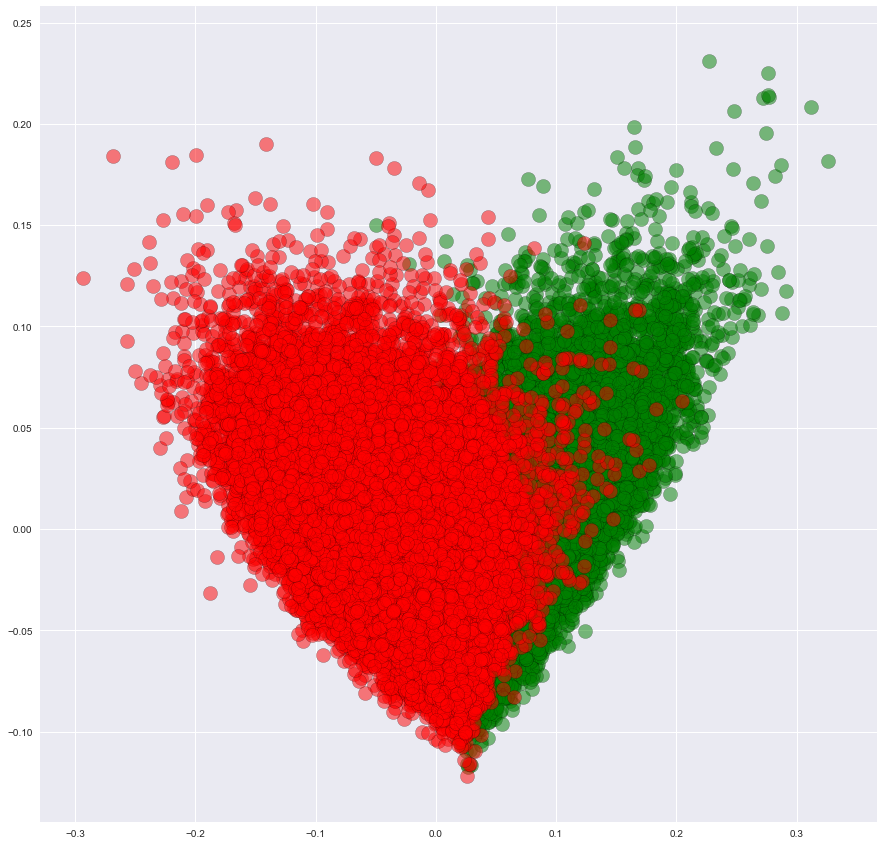

In [1027]:
plt.figure(figsize=(15,15))
alpha = .5
plt.scatter(pca2_result[wine.main_var.isin(noble_whites), 0], 
            pca2_result[wine.main_var.isin(noble_whites), 1],
           alpha=alpha, c='g', s=200, edgecolor='k')
plt.scatter(pca2_result[wine.main_var.isin(noble_reds), 0], 
            pca2_result[wine.main_var.isin(noble_reds), 1],
            alpha=alpha, c='r', s=200, edgecolor='k')

## LSA: 5 topics

** 5 Topics for 5 Weights of Wine-Food Pairings **

1. Lighter whites: 
    * pinot gris, pinot blanc, riesling, sauvignon blanc, chablis, champagne, gruner veltliner, vinho verde
2. Medium to heavy whites:
    * oaked sauvignon blanc, alsatian wines, albarino, white bordeaux(semillon), white burgundy, rhone whites(viognier, roussanne, marsanne), new world chardonnay
3. Lighter reds:
    * beaujolais, dolcetto, some pinot noir
4. Medium reds:
    * chianti, barbera, burgundy, chinon, rioja, cabernet franc, merlot, malbec, zinfandel, some pinot noir
5. Heavier reds:
    * syrah, brunello di montalcino, cabernet sauvignon, port, barbaresco, barolo

In [79]:
# dtm_tfidf tfidf
model5 = TruncatedSVD(5, algorithm = 'randomized')
lsa5 = model5.fit_transform(dtm_tfidf)

In [80]:
# topic - term
(model5.components_).shape

(5, 42177)

In [81]:
# doc - topic
(lsa5).shape

(97817, 5)

In [239]:
display_topics(model5, tfidf.get_feature_names(), 30)


Topic  0
tannins, cherry, ripe, black, dry, rich, spice, soft, sweet, red, oak, blackberry, berry, fresh, good, shows, plum, crisp, texture, dark, blend, chocolate, vanilla, nose, fruity, firm, cabernet, structure, offers, character

Topic  1
crisp, apple, citrus, fresh, peach, white, pear, lemon, clean, green, light, pineapple, chardonnay, lime, melon, bright, grapefruit, creamy, honey, apricot, tropical, orange, fruity, mineral, touch, blanc, refreshing, yellow, stone, lively

Topic  2
ripe, wood, character, tannins, rich, sample, aging, structure, barrel, firm, age, fruity, texture, juicy, dense, attractive, ready, concentrated, structured, great, powerful, rounded, richness, weight, aftertaste, packed, solid, fresh, delicious, perfumed

Topic  3
sweet, dry, oak, rich, cherries, blackberries, vanilla, chardonnay, pineapple, little, like, smoky, good, buttered, toast, currants, raspberries, jam, simple, soft, ripe, blackberry, price, alcohol, tastes, lots, shows, nice, tannic, cola


1. Topic 0: medium reds
2. Topic 1: lighter whites
3. Topic 2: heavier reds
4. Topic 3: medium to heavy whites
5. Topic 4: lighter reds

### PCA with 5 Topics

In [508]:
len(lsa5) #97817

97817

In [1]:
type(lsa5)

NameError: name 'lsa5' is not defined

In [512]:
(pca5_result).shape

(97817, 2)

In [515]:
len(pca5_result[:,1])

97817

In [517]:
df_pca5.shape

(97817, 5)

In [82]:
# PCA
pca5 = PCA(n_components=3)
pca5_result = pca5.fit_transform(lsa5)

df_pca5 = pd.DataFrame()
df_pca5['pca_one'] = pca5_result[:,0]
df_pca5['pca_two'] = pca5_result[:,1] 
df_pca5['pca_three'] = pca5_result[:,2] 

print('Explained variation per principal component: {}'.format(pca5.explained_variance_ratio_))

Explained variation per principal component: [ 0.3182186   0.22999019  0.19880185]


In [83]:
df_pca5.head()

,pca_one,pca_two,pca_three
0,-0.019733,0.021030,-0.007391
1,-0.067105,0.012844,-0.065594
2,0.055698,0.004556,-0.012589
3,-0.111098,-0.016017,-0.016515
4,-0.008874,0.088448,-0.004767


In [84]:
topic_colors5 = ['#CC0000', '#E5FFCC', '#660000', '#B2FF66', '#FF6666']
topic_labels5 = ['med_red', 'lite_white','full_red', 'full_white', 'lite_red']
# Topic 0: medium reds - '#CC0000'
# Topic 1: lighter whites - '#E5FFCC'
# Topic 2: heavier reds - '#660000'
# Topic 3: medium to heavy whites - '#B2FF66'
# Topic 4: lighter reds - '#FF6666'

topic_main5 = []
topic_max_colors = []
for i in range(len(lsa5)):
#     print(np.argmax(lsa8[i]), np.max(lsa8[i]))
    topic_max = np.argmax(lsa5[i])
    topic_max_colors.append(topic_colors5[topic_max])
    topic_main5.append(topic_labels5[topic_max])

In [85]:
df_pca5['topic_color'] = topic_max_colors
df_pca5['topic_label'] = topic_main5

In [86]:
df_pca5.head()

,pca_one,pca_two,pca_three,topic_color,topic_label
0,-0.019733,0.021030,-0.007391,#CC0000,med_red
1,-0.067105,0.012844,-0.065594,#CC0000,med_red
2,0.055698,0.004556,-0.012589,#CC0000,med_red
3,-0.111098,-0.016017,-0.016515,#CC0000,med_red
4,-0.008874,0.088448,-0.004767,#660000,full_red


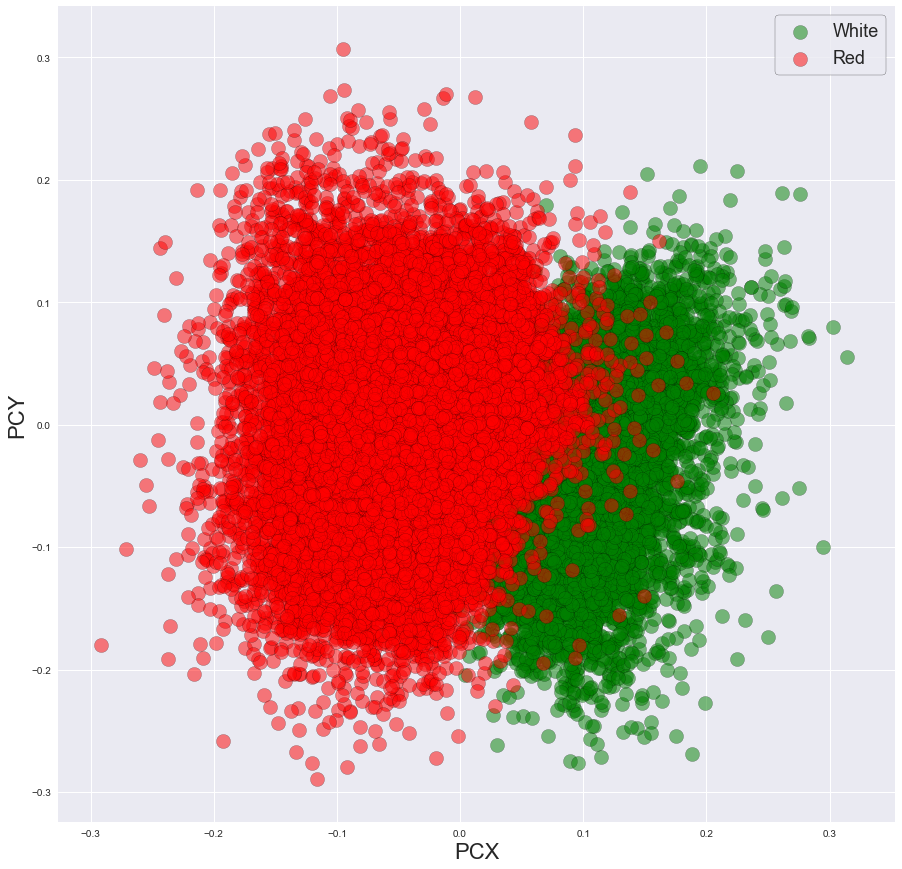

In [88]:
# topic_colors5 = ['#CC0000', '#E5FFCC', '#660000', '#B2FF66', '#FF6666']
# topic_labels5 = ['med_red', 'lite_white','full_red', 'full_white', 'lite_red']

plt.figure(figsize=(15,15))
alpha = .5
pc1 = 0
pc2 = 2
plt.scatter(pca5_result[wine.main_var.isin(noble_whites), pc1], 
            pca5_result[wine.main_var.isin(noble_whites), pc2],
           alpha=alpha, c='g', s=200, edgecolor='k')
plt.scatter(pca5_result[wine.main_var.isin(noble_reds), pc1], 
            pca5_result[wine.main_var.isin(noble_reds), pc2],
           alpha=alpha, c='r', s=200, edgecolor='k')

plt.legend(labels=['White', 'Red'], fontsize=18, frameon=True, edgecolor='k')
plt.xlabel('PCX', fontsize=22)
plt.ylabel('PCY', fontsize=22)

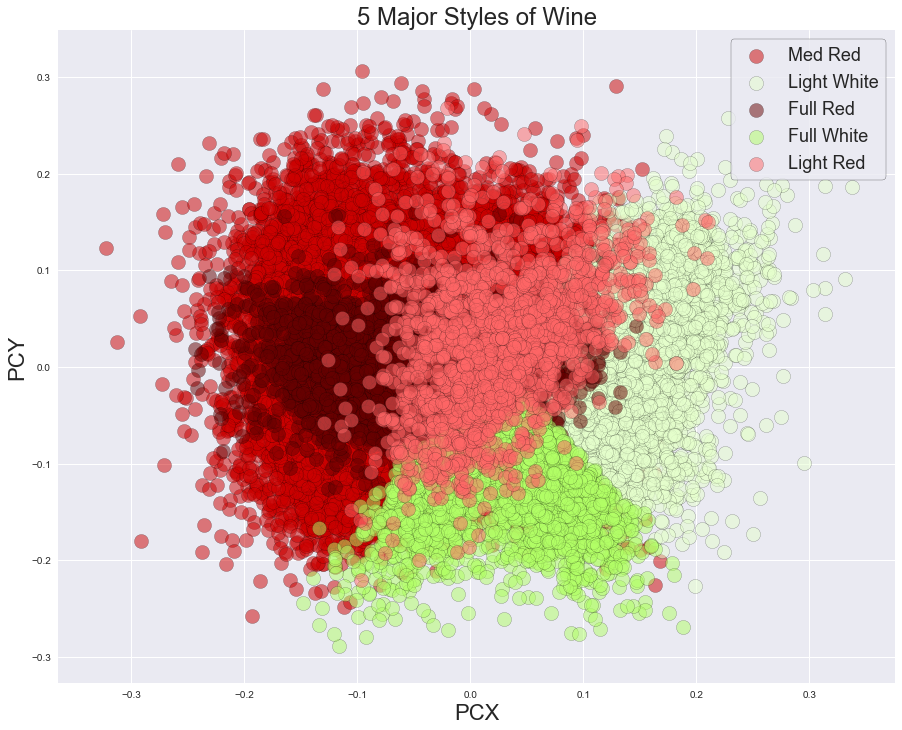

In [95]:
# topic_colors5 = ['#CC0000', '#E5FFCC', '#660000', '#B2FF66', '#FF6666']
# topic_labels5 = ['med_red', 'lite_white','full_red', 'full_white', 'lite_red']
tl5 = ['Med Red', 'Light White','Full Red', 'Full White', 'Light Red']
# 
plt.figure(figsize=(15,12))
alpha = .5
pc1 = 0
pc2 = 2
plt.scatter(pca5_result[df_pca5.topic_color=='#CC0000', pc1], 
            pca5_result[df_pca5.topic_color=='#CC0000', pc2],
           alpha=alpha, c='#CC0000', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.topic_color=='#E5FFCC', pc1], 
            pca5_result[df_pca5.topic_color=='#E5FFCC', pc2],
           alpha=alpha, c='#E5FFCC', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.topic_color=='#660000', pc1], 
            pca5_result[df_pca5.topic_color=='#660000', pc2],
           alpha=alpha, c='#660000', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.topic_color=='#B2FF66', pc1], 
            pca5_result[df_pca5.topic_color=='#B2FF66', pc2],
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.topic_color=='#FF6666', pc1], 
            pca5_result[df_pca5.topic_color=='#FF6666', pc2],
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')

plt.legend(labels=tl5, fontsize=18, frameon=True, edgecolor='k')
plt.xlabel('PCX', fontsize=22)
plt.ylabel('PCY', fontsize=22)
plt.title('5 Major Styles of Wine', fontsize=24)

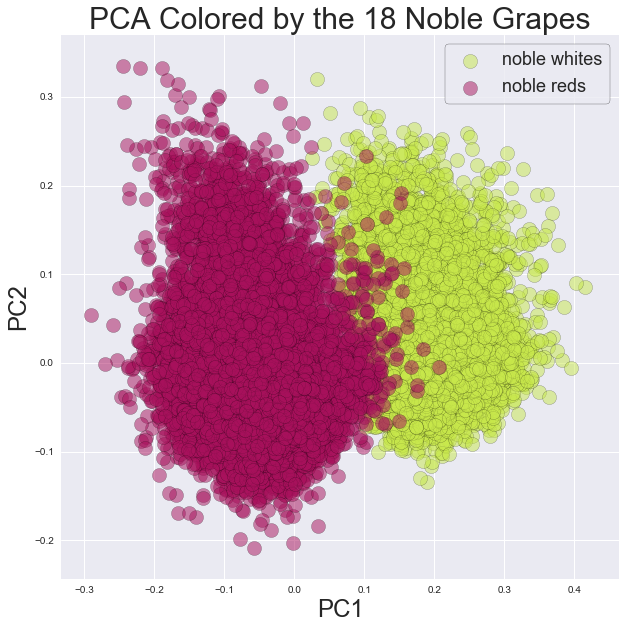

In [246]:
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(pca5_result[wine.main_var.isin(noble_whites), 0]+.1, 
            pca5_result[wine.main_var.isin(noble_whites), 1],
           alpha=alpha, c='#C8E84B', s=200, edgecolor='k')
plt.scatter(pca5_result[wine.main_var.isin(noble_reds), 0], 
            pca5_result[wine.main_var.isin(noble_reds), 1],
           alpha=alpha, c='#A8115C', s=200, edgecolor='k')

plt.legend(['noble whites', 'noble reds'], 
           fontsize=18, frameon=True, edgecolor='k');
plt.xlabel('PC1', fontsize=24);
plt.ylabel('PC2', fontsize=24);
plt.title('PCA Colored by the 18 Noble Grapes', fontsize=30);


## LSA: 7 Topics?

** 7 Topics for 7 Categories of Wine Related to Food Pairings **
2. light dry white
    * sauvignon blanc, pinot grigio, albarino, gruner vetliner
    * green veggies, roasted veggies, carbs, fish
2. sweet white
    * riesling, chenin blanc, moscato
    * soft cheese, carbs, cured/smoked meat, dessert
2. rich white
    * chardonnay, oaked whites, viognier
    * roasted veggies, carbs, rich fish, white meat
4. sparkling wine
    * champagne, franciacorta, prosecco, cava
    * soft cheese, hard cheese, carbs, fish
5. light red
    * pinot noir, grenache, pinotage, gamay
    * roasted veggies, carbs, rich fish, white meat
6. medium red
    * sangiovese, merlot, cab. franc, tempranillo
    * hard cheese, carbs, white meat, red meat, cured/smoked meat
7. big red
    * cabernet sauvignon, shiraz/syrah, zinfandel, mourvedre, aglianico
    * hard cheese, red meat, cured/smoked meat
8. dessert wine
    * port & tawny port, sherry, late harvest, tokaji
    * soft cheese, carbs, cured/smoked meat, dessert

In [195]:
# dtm_tfidf tfidf
model7 = TruncatedSVD(7, algorithm = 'randomized')
lsa7 = model7.fit_transform(dtm_tfidf)

In [196]:
# topic - term
(model7.components_).shape

(7, 42177)

In [197]:
# doc - topic
(lsa7).shape

(97817, 7)

In [198]:
display_topics(model7, tfidf.get_feature_names(), 40)


Topic  0
tannins, cherry, ripe, black, dry, rich, spice, soft, sweet, red, oak, blackberry, berry, fresh, good, shows, plum, crisp, texture, dark, blend, chocolate, vanilla, nose, fruity, firm, cabernet, structure, offers, character, juicy, light, bright, smooth, raspberry, pepper, balanced, touch, mouth, white

Topic  1
crisp, apple, citrus, fresh, peach, white, pear, lemon, clean, green, light, pineapple, chardonnay, lime, melon, bright, grapefruit, creamy, honey, apricot, tropical, orange, fruity, mineral, touch, blanc, refreshing, yellow, stone, lively, simple, vanilla, zesty, zest, riesling, nose, almond, minerality, floral, texture

Topic  2
ripe, wood, character, tannins, sample, rich, aging, barrel, structure, firm, age, fruity, texture, juicy, dense, attractive, ready, concentrated, great, structured, powerful, rounded, richness, weight, aftertaste, packed, solid, fresh, delicious, fine, perfumed, fruitiness, balanced, intense, needs, freshness, potential, edge, giving, showi

* Topic 0: medium red
* Topic 1: light-sweet white
* Topic 2: sparkling
* Topic 3: sweet-rich white
* Topic 4: light red
* Topic 5: dessert wines
* Topic 6: big red

### PCA with 7 Topics

In [221]:
# # PCA
pca7 = PCA(n_components=2)
pca7_result = pca7.fit_transform(lsa7)

df_pca7 = pd.DataFrame()
df_pca7['pca_one'] = pca7_result[:,0]
df_pca7['pca_two'] = pca7_result[:,1] 

print('Explained variation per principal component: {}'.format(pca9.explained_variance_ratio_))

Explained variation per principal component: [ 0.20156162  0.14572859]


In [303]:
df_pca7['topic_color'] = topic_max_colors7

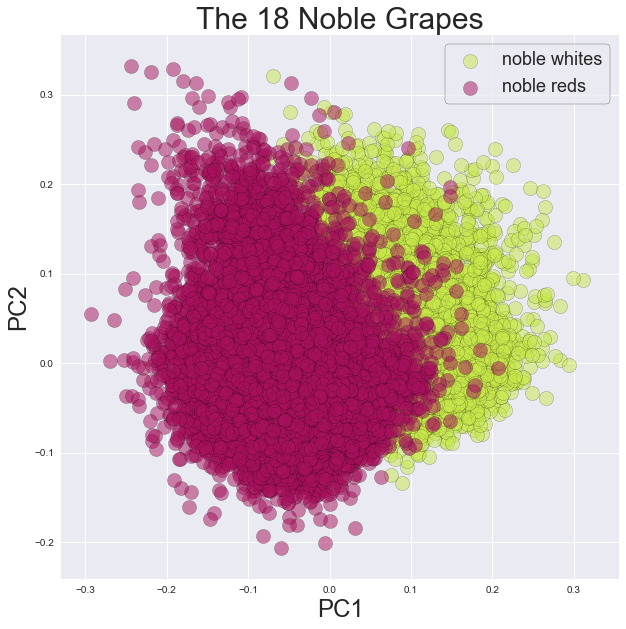

In [201]:
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(pca7_result[wine.main_var.isin(noble_whites), 0], 
            pca7_result[wine.main_var.isin(noble_whites), 1],
           alpha=alpha, c='#C8E84B', s=200, edgecolor='k')
plt.scatter(pca7_result[wine.main_var.isin(noble_reds), 0], 
            pca7_result[wine.main_var.isin(noble_reds), 1],
           alpha=alpha, c='#A8115C', s=200, edgecolor='k')

plt.legend(['noble whites', 'noble reds'], 
           fontsize=18, frameon=True, edgecolor='k');
plt.xlabel('PC1', fontsize=24);
plt.ylabel('PC2', fontsize=24);
plt.title('The 18 Noble Grapes', fontsize=30);

In [207]:
topic_colors7 = ['#CC0000', '#CCFF99', '#FFFFCC', '#B2FF66', '#FF6666', '#CC6600', '#660000']
topic_labels7 = ['med_red', 'lite_white', 'sparkling', 'rich_white', 'lite_red', 'dessert', 'full_red']
# Topic 0: medium red - '#CC0000'
# Topic 1: light-sweet white - '#CCFF99'
# Topic 2: sparkling - '#FFFFCC'
# Topic 3: sweet-rich white - '#B2FF66'
# Topic 4: light red - '#FF6666'
# Topic 5: dessert wines - '#CC6600'
# Topic 6: big red - '#660000'

topic_main7 = []
topic_max_colors7 = []
for i in range(len(lsa7)):
    topic_max = np.argmax(lsa7[i])
    topic_max_colors7.append(topic_colors7[topic_max])
    topic_main7.append(topic_labels7[topic_max])

In [375]:
wine['main_topic7'] = topic_main7

In [305]:
df_pca7['topic_color'] = topic_max_colors7

In [309]:
df_pca7['topic_main'] = topic_main7

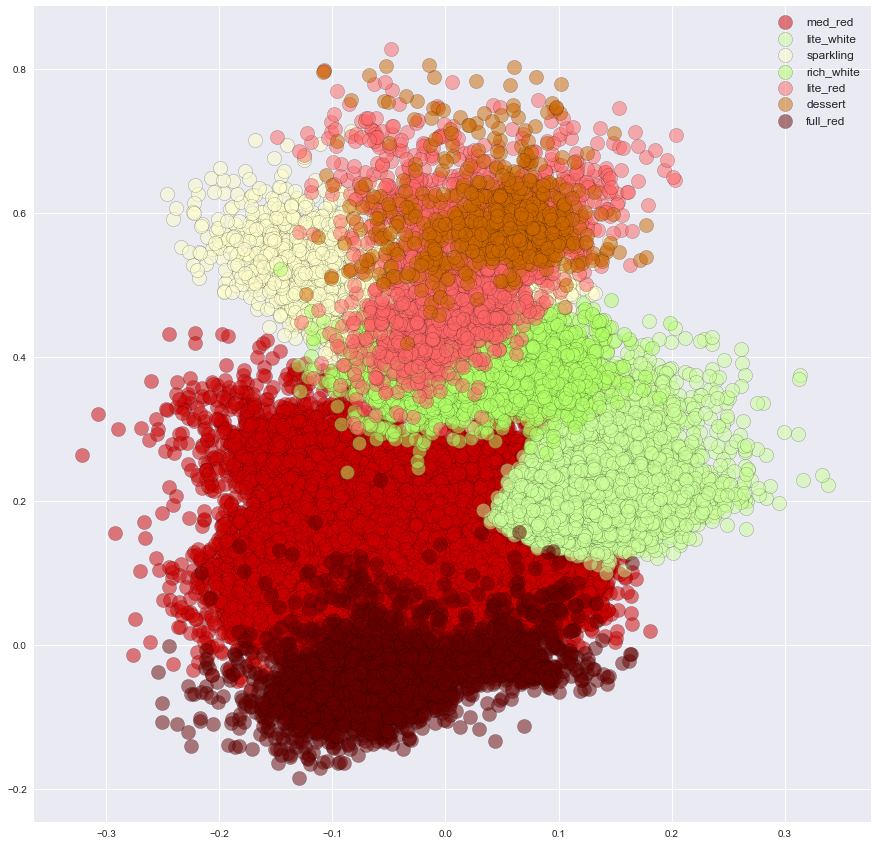

In [306]:
# topic_colors7 = ['#CC0000', '#CCFF99', '#FFFFCC', '#B2FF66', '#FF6666', '#CC6600', '#660000']
# topic_labels7 = ['med_red', 'lite_white', 'sparkling', 'rich_white', 'lite_red', 'dessert', 'full_red']

plt.figure(figsize=(15,15))
alpha = .5
plt.scatter(pca7_result[df_pca7.topic_color=='#CC0000', 0], 
            pca7_result[df_pca7.topic_color=='#CC0000', 1]+.1,
           alpha=alpha, c='#CC0000', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#CCFF99', 0], 
            pca7_result[df_pca7.topic_color=='#CCFF99', 1]+.2,
           alpha=alpha, c='#CCFF99', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#FFFFCC', 0], 
            pca7_result[df_pca7.topic_color=='#FFFFCC', 1]+.3,
           alpha=alpha, c='#FFFFCC', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#B2FF66', 0], 
            pca7_result[df_pca7.topic_color=='#B2FF66', 1]+.4,
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#FF6666', 0], 
            pca7_result[df_pca7.topic_color=='#FF6666', 1]+.5,
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#CC6600', 0], 
            pca7_result[df_pca7.topic_color=='#CC6600', 1]+.6,
           alpha=alpha, c='#CC6600', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.topic_color=='#660000', 0], 
            pca7_result[df_pca7.topic_color=='#660000', 1],
           alpha=alpha, c='#660000', s=200, edgecolor='k')


plt.legend(labels=topic_labels7, fontsize=12)

## LSA: 9 topics

** 9 Topics for 9 Categories of Wine Related to Food Pairings **
1. aromatic white
    * sauvignon blanc, pinot grigio, albarino, gruner vetliner
    * green veggies, roasted veggies, carbs, fish
2. light-bodied white
    * riesling, chenin blanc, moscato
    * soft cheese, carbs, cured/smoked meat, dessert
3. heavy-bodied, rich white
    * chardonnay, oaked whites, viognier
    * roasted veggies, carbs, rich fish, white meat
4. sparkling wine
    * champagne, franciacorta, prosecco, cava
    * soft cheese, hard cheese, carbs, fish
5. rosé
    * 
5. light-bodied red
    * pinot noir, grenache, pinotage, gamay
    * roasted veggies, carbs, rich fish, white meat
6. medium-bodied red
    * sangiovese, merlot, cab. franc, tempranillo
    * hard cheese, carbs, white meat, red meat, cured/smoked meat
7. full-bodied red
    * cabernet sauvignon, shiraz/syrah, zinfandel, mourvedre, aglianico
    * hard cheese, red meat, cured/smoked meat
8. dessert wine
    * port & tawny port, sherry, late harvest, tokaji
    * soft cheese, carbs, cured/smoked meat, dessert

In [41]:
# dtm_tfidf tfidf
model9 = TruncatedSVD(9, algorithm = 'randomized')
lsa9 = model9.fit_transform(dtm_tfidf)

In [42]:
# topic - term
(model9.components_).shape

(9, 42177)

In [43]:
# doc - topic
(lsa9).shape

(97817, 9)

In [53]:
topic_colors9 = ['#FF6666', '#CCFF99',   '#FFFFCC',    '#E5FFCC', '#FF66B2', '#CC6600', '#660000', '#CC0000', '#B2FF66' ]
topic_labels9 = ['lite_red', 'arom_white', 'sparkling', 'lite_white', 'rose', 'dessert', 'full_red', 'med_red', 'full_white']
# Topic 0: light-bodied red wines - '#FF6666'
# Topic 1: aromatic white wines - '#CCFF99'
# Topic 2: sparkling wines - '#FFFFCC'
# Topic 3: light-bodied white wines - '#E5FFCC'
# Topic 4: rosé - '#FF66B2'
# Topic 5: dessert wines and fortified wines - '#CC6600'
# Topic 6: full-bodied red wines - '#660000'
# Topic 7: medium-bodied red wines - '#CC0000'
# Topic 8: full-bodied white wines - '#B2FF66'

In [66]:
topic_main9 = []
topic_max_colors9 = []
for i in range(len(lsa9)):
    topic_max = np.argmax(lsa9[i])
    topic_max_colors9.append(topic_colors9[topic_max])
    topic_main9.append(topic_labels9[topic_max])

In [55]:
wine['main_topic9'] = topic_main9

In [47]:
display_topics(model9, tfidf.get_feature_names(), 40)


Topic  0
tannins, cherry, ripe, black, dry, rich, spice, soft, sweet, red, oak, blackberry, berry, fresh, good, shows, plum, crisp, texture, dark, blend, chocolate, vanilla, nose, fruity, firm, cabernet, structure, offers, character, juicy, light, bright, smooth, raspberry, pepper, balanced, touch, mouth, white

Topic  1
crisp, apple, citrus, fresh, peach, white, pear, lemon, green, clean, light, pineapple, chardonnay, lime, melon, bright, grapefruit, creamy, honey, apricot, tropical, orange, fruity, mineral, touch, blanc, refreshing, yellow, stone, lively, simple, vanilla, zesty, zest, riesling, nose, almond, minerality, floral, texture

Topic  2
ripe, wood, character, tannins, rich, sample, aging, structure, barrel, firm, age, fruity, texture, juicy, dense, attractive, ready, concentrated, structured, great, powerful, rounded, richness, weight, aftertaste, packed, solid, fresh, delicious, fine, perfumed, fruitiness, needs, intense, freshness, balanced, potential, edge, giving, showi

1. Topic 0: light-bodied red wines
2. Topic 1: aromatic white wines
3. Topic 2: sparkling wines
4. Topic 3: medium-bodied white wines
5. Topic 4: rosé
6. Topic 5: dessert wines and fortified wines
7. Topic 6: full-bodied red wines
8. Topic 7: medium-bodied red wines
9. Topic 8: full-bodied white wines

### PCA with 9 Topics

In [67]:
df_pca9['topic_color'] = topic_max_colors9

In [62]:
# # PCA
pca9 = PCA(n_components=3)
pca9_result = pca9.fit_transform(lsa9)

df_pca9 = pd.DataFrame()
df_pca9['pca_one'] = pca9_result[:,0]
df_pca9['pca_two'] = pca9_result[:,1] 
df_pca9['pca_three'] = pca9_result[:,2]

print('Explained variation per principal component: {}'.format(pca9.explained_variance_ratio_))


Explained variation per principal component: [ 0.2014087   0.14559468  0.12602908]


In [64]:
df_pca9['topic_main'] = topic_main9

In [68]:
df_pca9.head()

,pca_one,pca_two,pca_three,topic_main,topic_color
0,-0.019502,0.019403,-0.011787,lite_red,#FF6666
1,-0.068851,0.015045,-0.063359,lite_red,#FF6666
2,0.055065,0.004467,-0.007856,lite_red,#FF6666
3,-0.111435,-0.013760,-0.018884,lite_red,#FF6666
4,-0.008372,0.088052,-0.007239,sparkling,#FFFFCC


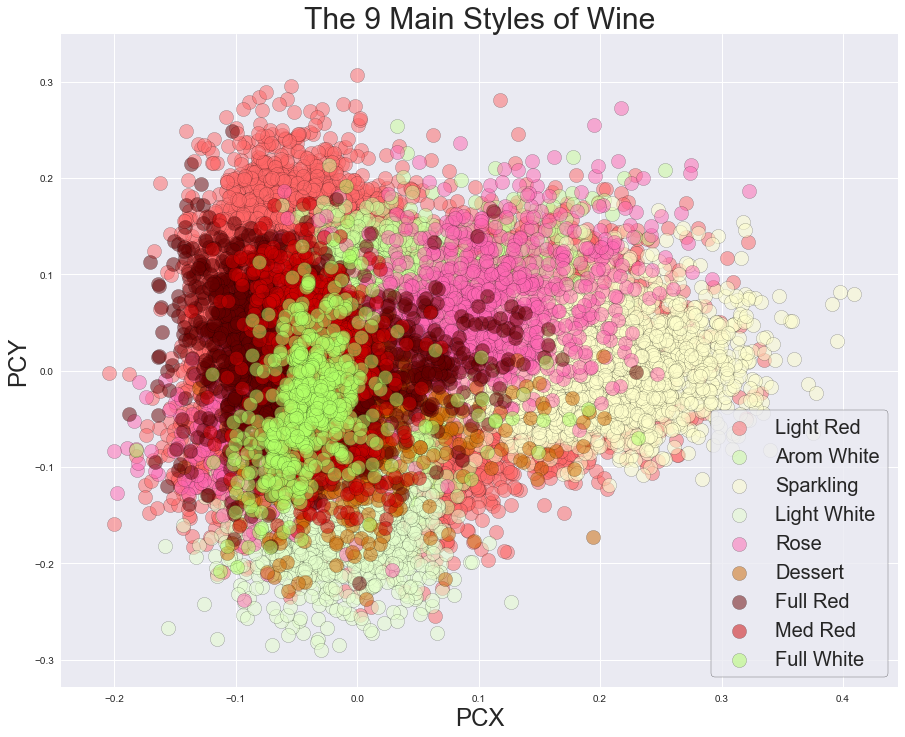

In [78]:
# topic_colors9 = ['#FF6666', '#CCFF99',   '#FFFFCC',    '#E5FFCC', '#FF66B2', '#CC6600', '#660000', '#CC0000', '#B2FF66' ]
# topic_labels9 = ['lite_red', 'arom_white', 'sparkling', 'lite_white', 'rose', 'dessert', 'full_red', 'med_red', 'full_white']
topic_labels9 = ['Light Red', 'Arom White', 'Sparkling', 'Light White', 'Rose', 'Dessert', 'Full Red', 'Med Red', 'Full White']

plt.figure(figsize=(15,12))
alpha = .5
pcx = 1
pcy = 2
plt.scatter(pca9_result[df_pca9.topic_color=='#FF6666', pcx], 
            pca9_result[df_pca9.topic_color=='#FF6666', pcy],
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#CCFF99', pcx], 
            pca9_result[df_pca9.topic_color=='#CCFF99', pcy],
           alpha=alpha, c='#CCFF99', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#FFFFCC', pcx], 
            pca9_result[df_pca9.topic_color=='#FFFFCC', pcy],
           alpha=alpha, c='#FFFFCC', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#E5FFCC', pcx], 
            pca9_result[df_pca9.topic_color=='#E5FFCC', pcy],
           alpha=alpha, c='#E5FFCC', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#FF66B2', pcx], 
            pca9_result[df_pca9.topic_color=='#FF66B2', pcy],
           alpha=alpha, c='#FF66B2', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#CC6600', pcx], 
            pca9_result[df_pca9.topic_color=='#CC6600', pcy],
           alpha=alpha, c='#CC6600', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#660000', pcx], 
            pca9_result[df_pca9.topic_color=='#660000', pcy],
           alpha=alpha, c='#660000', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#CC0000', pcx], 
            pca9_result[df_pca9.topic_color=='#CC0000', pcy],
           alpha=alpha, c='#CC0000', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.topic_color=='#B2FF66', pcx], 
            pca9_result[df_pca9.topic_color=='#B2FF66', pcy],
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')

plt.legend(labels=topic_labels9, fontsize=20, frameon=True, edgecolor='k')
plt.xlabel('PCX', fontsize=24);
plt.ylabel('PCY', fontsize=24);
plt.title('The 9 Main Styles of Wine', fontsize=30);

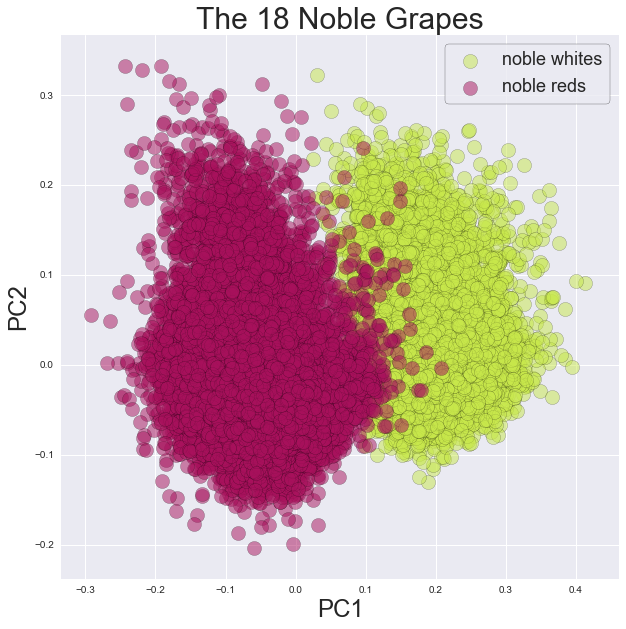

In [193]:
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(pca9_result[wine.main_var.isin(noble_whites), 0]+.1, 
            pca9_result[wine.main_var.isin(noble_whites), 1],
           alpha=alpha, c='#C8E84B', s=200, edgecolor='k')
plt.scatter(pca9_result[wine.main_var.isin(noble_reds), 0], 
            pca9_result[wine.main_var.isin(noble_reds), 1],
           alpha=alpha, c='#A8115C', s=200, edgecolor='k')

plt.legend(['noble whites', 'noble reds'], 
           fontsize=18, frameon=True, edgecolor='k');
plt.xlabel('PC1', fontsize=24);
plt.ylabel('PC2', fontsize=24);
plt.title('The 18 Noble Grapes', fontsize=30);


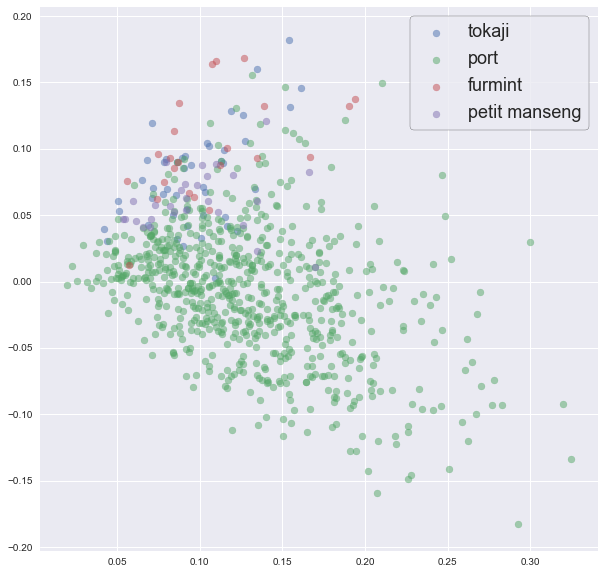

In [194]:
# Dessert Wines
plt.figure(figsize=(10,10))
alpha = .5
plt.scatter(lsa9[wine.variety=='tokaji',0], lsa9[wine.variety=='tokaji',1],alpha=alpha)
plt.scatter(lsa9[wine.variety=='port',0], lsa9[wine.variety=='port',1],alpha=alpha)
plt.scatter(lsa9[wine.variety=='furmint',0], lsa9[wine.variety=='furmint',1],alpha=alpha)
plt.scatter(lsa9[wine.variety=='petit manseng',0], lsa9[wine.variety=='petit manseng',1],alpha=alpha)
plt.legend(['tokaji','port','furmint','petit manseng'], fontsize=18, frameon=True, edgecolor='k')

In [62]:
pd.options.display.max_colwidth=1000
[(wine.variety[wine.reviews==rev], rev) for rev in wine.reviews if 'cola' in rev]

[(1    tinta de toro
  Name: variety, dtype: object,
  'ripe aromas of fig blackberry and cassis are softened and sweetened by a slathering of oaky chocolate and vanilla this is full layered intense and cushioned on the palate with rich flavors of chocolaty black fruits and baking spices a toasty everlasting finish is heady but ideally balanced drink through  '),
 (3    pinot noir
  Name: variety, dtype: object,
  'this spent   months in   new french oak and incorporates fruit from ponzis aurora abetina and madrona vineyards among others aromatic dense and toasty it deftly blends aromas and flavors of toast cigar box blackberry black cherry coffee and graphite tannins are polished to a fine sheen and frame a finish loaded with dark chocolate and espresso drink now through  '),
 (6    tinta de toro
  Name: variety, dtype: object,
  'slightly gritty blackfruit aromas include a sweet note of pastry along with a hint of prune walltowall saturation ensures that all corners of ones mouth are

In [218]:
pd.options.display.max_colwidth=1000
[(wine.variety[wine.reviews==rev], rev) for rev in wine.reviews if 'sparkling' in rev]

[(91    baga
  Name: variety, dtype: object,
  'the local baga grape better known for producing structured red wines also lends itself to fruity sparkling rosé bright acidity gives this crisp wine its tangy red currant character drink now'),
 (261    chenin blanc chardonnay
  Name: variety, dtype: object,
  'this fresh and fruity sparkling wine is crisp with apple skin and apricot flavors ripe and full in the mouth  it has a lightly creamy mousse the blend of chenin blanc and chardonnay gives delicious fruitiness and tight final acidity'),
 (673    pinot noir
  Name: variety, dtype: object,
  'one of the many estate pinot noirs produced by the pioneering arroyo grande valley winery which was founded as a sparkling wine house this offers scents of sandalwood black licorice and red currant the flavors are tart with cranberry then bring some bitter notes of crushed herbs'),
 (842    champagne blend
  Name: variety, dtype: object,
  'fresh whiffs of strawberry and blossom go handinhand wit

# Wine to CSV for Tableau

In [377]:
wine.head()

,description,country,price,variety,main_var,topic1,topic2,country_colors,main_topic7,main_topic9
0,this tremendous varietal wine hails from oak...,us,235.0,cabernet sauvignon,cabernet sauvignon,0.108791,-0.014734,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red
1,ripe aromas of fig blackberry and cassis are s...,spain,110.0,tinta de toro,tempranillo,0.138854,-0.058812,"[0.701960784314, 0.870588235294, 0.41176470588...",med_red,lite_red
2,mac watson honors the memory of a wine once ma...,us,90.0,sauvignon blanc,sauvignon,0.070886,0.050132,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red
3,this spent months in new french oak and in...,us,65.0,pinot noir,pinot noir,0.142124,-0.104443,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red
4,this is the top wine from la bégude named afte...,france,66.0,provence red blend,provence red blend,0.058874,-0.014284,"[0.992156862745, 0.705882352941, 0.38431372549...",sparkling,sparkling


In [378]:
wine['pca9_1'] = df_pca9.pca_one
wine['pca9_2'] = df_pca9.pca_two
wine['pca7_1'] = df_pca7.pca_one
wine['pca7_2'] = df_pca7.pca_two
wine['pca5_1'] = df_pca5.pca_one
wine['pca5_2'] = df_pca5.pca_two
wine['main_topic5'] = df_pca5.topic_label

In [379]:
wine.head()

,description,country,price,variety,main_var,topic1,topic2,country_colors,main_topic7,main_topic9,pca9_1,pca9_2,pca7_1,pca7_2,pca5_1,pca5_2,main_topic5
0,this tremendous varietal wine hails from oak...,us,235.0,cabernet sauvignon,cabernet sauvignon,0.108791,-0.014734,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,-0.019632,0.019540,-0.018969,0.019431,-0.019540,0.019913,med_red
1,ripe aromas of fig blackberry and cassis are s...,spain,110.0,tinta de toro,tempranillo,0.138854,-0.058812,"[0.701960784314, 0.870588235294, 0.41176470588...",med_red,lite_red,-0.068168,0.012341,-0.068346,0.014673,-0.066971,0.012627,med_red
2,mac watson honors the memory of a wine once ma...,us,90.0,sauvignon blanc,sauvignon,0.070886,0.050132,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,0.055076,0.003853,0.055293,0.005433,0.056124,0.004408,med_red
3,this spent months in new french oak and in...,us,65.0,pinot noir,pinot noir,0.142124,-0.104443,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,-0.111292,-0.013655,-0.110848,-0.012929,-0.110594,-0.014514,med_red
4,this is the top wine from la bégude named afte...,france,66.0,provence red blend,provence red blend,0.058874,-0.014284,"[0.992156862745, 0.705882352941, 0.38431372549...",sparkling,sparkling,-0.008581,0.088718,-0.008401,0.088716,-0.009014,0.089782,full_red


In [255]:
wine.to_csv('wine_topic_models.csv')

# Unsupervised Learning Techniques

## Kmeans

In [489]:
def get_cluster_centers(X, labels, k_num):
    CC_list = []
    for k in range(k_num):
        # get the mean coordinates of each cluster
        CC_list.append(np.mean(X[labels == k], axis = 0))
    return CC_list

# for each cluster substract the mean from each data point to get the error
# then get the magnitude of each error, square it, and sum it
def get_SSE(X, labels):
    k_num = len(np.unique(labels))
    CC_list = get_cluster_centers(X, labels, k_num)
    CSEs = []
    for k in range(k_num):
        # for each cluster of k we get the coordinates of how far off each point is to the cluster
        error_cords = X[labels == k] - CC_list[k]
        # square the coordinates and sum to get the magnitude squared
        error_cords_sq = error_cords ** 2
        error_mag_sq = np.sum(error_cords_sq, axis = 1)
        # since we already have the magnitude of the error squared we can just take the sum for the cluster
        CSE = np.sum(error_mag_sq)
        CSEs.append(CSE)
    # sum each cluster's sum of squared errors
    return sum(CSEs)

def inertia(points, centroid):
    value = 0
    for i, p in enumerate(points):
        value+= np.linalg.norm(centroid-np.asarray(p))
    return value, np.sqrt(value), value/len(points)

## Kmeans for 5 Topics

### 5 Topics for 5 Weights of Wine-Food Pairings

1. Lighter whites: 
    * pinot gris, pinot blanc, riesling, sauvignon blanc, chablis, champagne, gruner veltliner, vinho verde
2. Medium to heavy whites:
    * oaked sauvignon blanc, alsatian wines, albarino, white bordeaux(semillon), white burgundy, rhone whites(viognier, roussanne, marsanne), new world chardonnay
3. Lighter reds:
    * beaujolais, dolcetto, some pinot noir
4. Medium reds:
    * chianti, barbera, burgundy, chinon, rioja, cabernet franc, merlot, malbec, zinfandel, some pinot noir
5. Heavier reds:
    * syrah, brunello di montalcino, cabernet sauvignon, port, barbaresco, barolo

### km5

In [258]:
# wine_scaled = scale(wine_tfidf1, with_mean=False)
(lsa5).shape

(97817, 5)

In [294]:
km5 = KMeans(n_clusters=5)
km5_model = km5.fit(lsa5)

In [295]:
km5_labels = km5_model.labels_

In [296]:
km5_labels

array([1, 4, 1, ..., 1, 0, 0], dtype=int32)

In [261]:
mu5 = km5.cluster_centers_

In [262]:
mu5

array([[ 0.1120575 ,  0.11275457, -0.00115147,  0.00662398, -0.02239828],
       [ 0.15321048, -0.04855118, -0.04682382, -0.05415825, -0.0199225 ],
       [ 0.16314435, -0.02848984,  0.13856227, -0.01594105,  0.00924506],
       [ 0.15561031, -0.04476803, -0.02858449,  0.07997876,  0.03971987],
       [ 0.08680258,  0.00457367, -0.01410891,  0.00151965, -0.00098581]])

In [263]:
# are these all equally represented?
unique, counts = np.unique(km5.labels_, return_counts=True)
np.asarray((unique, counts)).T

array([[    0, 23850],
       [    1, 19968],
       [    2, 10173],
       [    3, 14322],
       [    4, 29504]])

### PCA5 labeled by km5

In [1058]:
df_pca5['km_labels'] = km5_labels
df_pca5.head()

,pca_one,pca_two,pca_three,topic_color,topic_label,km_labels
0,-0.019540,0.019913,-0.009075,#CC0000,med_red,1
1,-0.066971,0.012627,-0.064848,#CC0000,med_red,4
2,0.056124,0.004408,-0.009313,#CC0000,med_red,1
3,-0.110594,-0.014514,-0.019387,#CC0000,med_red,3
4,-0.009014,0.089782,-0.007333,#660000,full_red,2


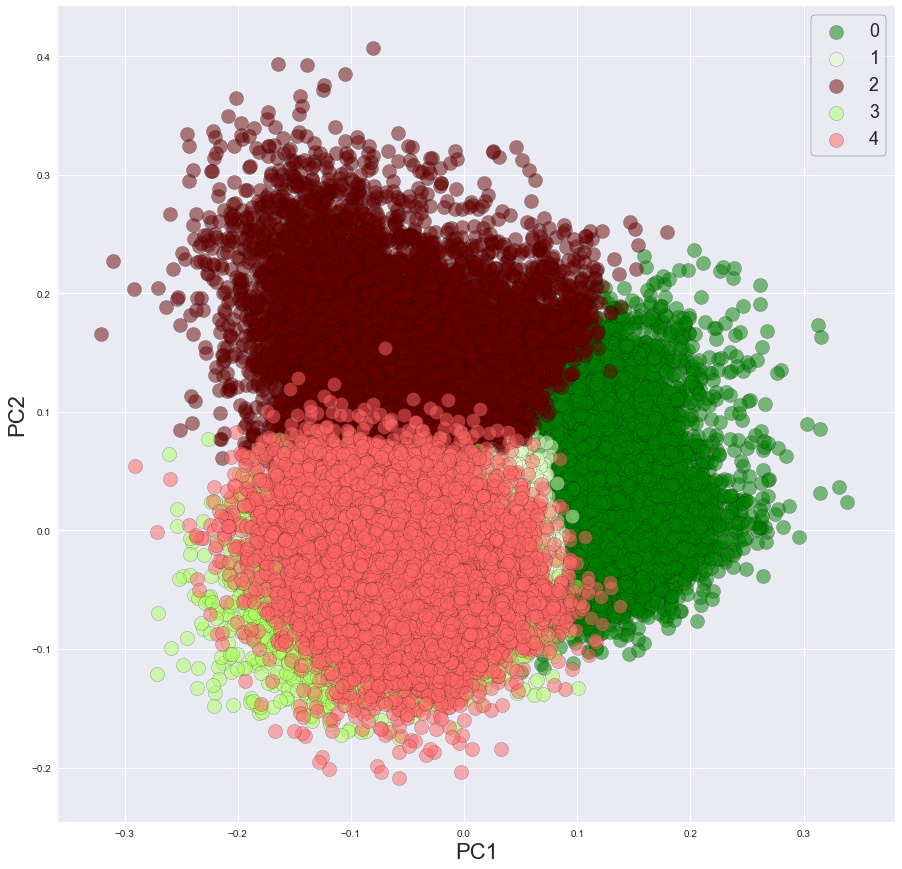

In [1064]:
plt.figure(figsize=(15,15))
alpha = .5
pc1 = 0
pc2 = 1
plt.scatter(pca5_result[df_pca5.km_labels==0, pc1], 
            pca5_result[df_pca5.km_labels==0, pc2],
            alpha=alpha, c='g', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.km_labels==1, pc1], 
            pca5_result[df_pca5.km_labels==1, pc2],
           alpha=alpha, c='#E5FFCC', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.km_labels==2, pc1], 
            pca5_result[df_pca5.km_labels==2, pc2],
           alpha=alpha, c='#660000', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.km_labels==3, pc1], 
            pca5_result[df_pca5.km_labels==3, pc2],
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')
plt.scatter(pca5_result[df_pca5.km_labels==4, pc1], 
            pca5_result[df_pca5.km_labels==4, pc2],
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')

plt.legend(labels=[0,1,2,3,4], fontsize=18, frameon=True, edgecolor='k')
plt.xlabel('PC1', fontsize=22)
plt.ylabel('PC2', fontsize=22)

### km5 centers and variances

In [420]:
subset = df_pca5[df_pca5.km_labels == 0]
points = list(zip(subset.pca_one, subset.pca_two))
centroids = [km_center[0]]*len(points)
inertia(points, centroid)

(1192.0337663966145, 34.525842008510303, 0.049999319088822387)

In [422]:
km_center = []
km_var = []
km_inertia = []
for i in range(5):
    subset_i = df_pca5[df_pca5.km_labels == i]
    points = list(zip(subset_i.pca_one, subset_i.pca_two))
    centroid = [np.mean(subset_i.pca_one), np.mean(subset_i.pca_two)]
    km_center.append(centroid)
    km_inertia.append(inertia(points, centroid))
    km_var.append([np.std(subset_i.pca_one), np.std(subset_i.pca_two)])

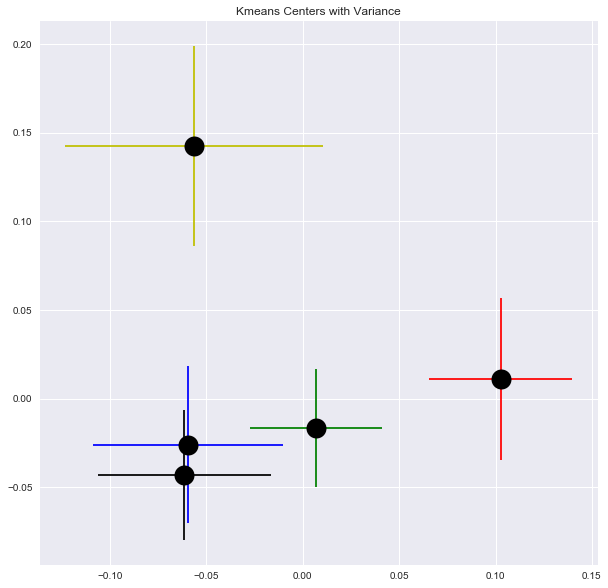

In [503]:
plt.figure(figsize=(10,10))
plt.errorbar([x[0] for x in km_center], [x[1] for x in km_center], 
             xerr=[x[0] for x in km_var], yerr=[x[1] for x in km_var],
            fmt='o', ecolor=['r','g','y','k','b'],color='k', markersize=20)
plt.title("Kmeans Centers with Variance")

In [538]:
wine.main_topic5[df_pca5.km_labels==0].value_counts()

med_red       14862
lite_white     2535
full_red        784
full_white      548
lite_red        379
Name: main_topic5, dtype: int64

In [539]:
wine.main_topic5[df_pca5.km_labels==1].value_counts()

med_red       17480
lite_white     2940
full_red        861
full_white      684
lite_red        434
Name: main_topic5, dtype: int64

In [540]:
wine.main_topic5[df_pca5.km_labels==2].value_counts()

med_red       6850
lite_white    1147
full_red       313
full_white     264
lite_red       182
Name: main_topic5, dtype: int64

In [541]:
wine.main_topic5[df_pca5.km_labels==3].value_counts()

med_red       13088
lite_white     2212
full_red        627
full_white      479
lite_red        342
Name: main_topic5, dtype: int64

In [542]:
wine.main_topic5[df_pca5.km_labels==4].value_counts()

med_red       8450
lite_white    1315
full_red       424
full_white     335
lite_red       190
Name: main_topic5, dtype: int64

## Kmeans for 7 Topics

### 7 Topics for 7 Wine Weights

2. light dry white
    * sauvignon blanc, pinot grigio, albarino, gruner vetliner
    * green veggies, roasted veggies, carbs, fish
2. sweet white
    * riesling, chenin blanc, moscato
    * soft cheese, carbs, cured/smoked meat, dessert
2. rich white
    * chardonnay, oaked whites, viognier
    * roasted veggies, carbs, rich fish, white meat
4. sparkling wine
    * champagne, franciacorta, prosecco, cava
    * soft cheese, hard cheese, carbs, fish
5. light red
    * pinot noir, grenache, pinotage, gamay
    * roasted veggies, carbs, rich fish, white meat
6. medium red
    * sangiovese, merlot, cab. franc, tempranillo
    * hard cheese, carbs, white meat, red meat, cured/smoked meat
7. big red
    * cabernet sauvignon, shiraz/syrah, zinfandel, mourvedre, aglianico
    * hard cheese, red meat, cured/smoked meat
8. dessert wine
    * port & tawny port, sherry, late harvest, tokaji
    * soft cheese, carbs, cured/smoked meat, dessert

### km7

In [265]:
(lsa7).shape

(97817, 7)

In [299]:
km7 = KMeans(n_clusters=7)
km7_model = km7.fit(lsa7)
km7_labels = km7_model.labels_

In [300]:
km7_labels

array([2, 2, 0, ..., 2, 0, 0], dtype=int32)

In [266]:
mu7 = km7.cluster_centers_

In [267]:
mu7

array([[ 0.08543777,  0.00257439, -0.01276372,  0.00363247, -0.00456114,
        -0.0040656 , -0.01165868],
       [ 0.15785315, -0.06870927, -0.04862228, -0.01174119, -0.04102005,
        -0.02269187,  0.14898921],
       [ 0.10824617,  0.10730555, -0.00746158,  0.01415719, -0.03384189,
         0.00078668,  0.00146247],
       [ 0.14922855, -0.03921988, -0.04686146, -0.05595094, -0.00881688,
         0.02145747, -0.03205414],
       [ 0.15235155,  0.07993461,  0.07412139, -0.04492335,  0.11159936,
         0.00301362,  0.02956501],
       [ 0.16202069, -0.04849485,  0.14382976, -0.0078043 , -0.02446907,
         0.00697708, -0.01969017],
       [ 0.15423561, -0.04690072, -0.02641953,  0.07983887,  0.03713657,
        -0.0316582 , -0.00582387]])

In [268]:
# are these all equally represented?
unique, counts = np.unique(km7.labels_, return_counts=True)
np.asarray((unique, counts)).T

array([[    0, 26910],
       [    1,  4825],
       [    2, 22563],
       [    3, 17396],
       [    4,  5454],
       [    5,  7810],
       [    6, 12859]])

### PCA7 labeled by km7

In [310]:
df_pca7['km_labels'] = km7_labels
df_pca7.head()

,pca_one,pca_two,km_labels,topic_color,topic_main
0,-0.018969,0.019431,2,#CC0000,med_red
1,-0.068346,0.014673,2,#CC0000,med_red
2,0.055293,0.005433,0,#CC0000,med_red
3,-0.110848,-0.012929,1,#CC0000,med_red
4,-0.008401,0.088716,5,#FFFFCC,sparkling


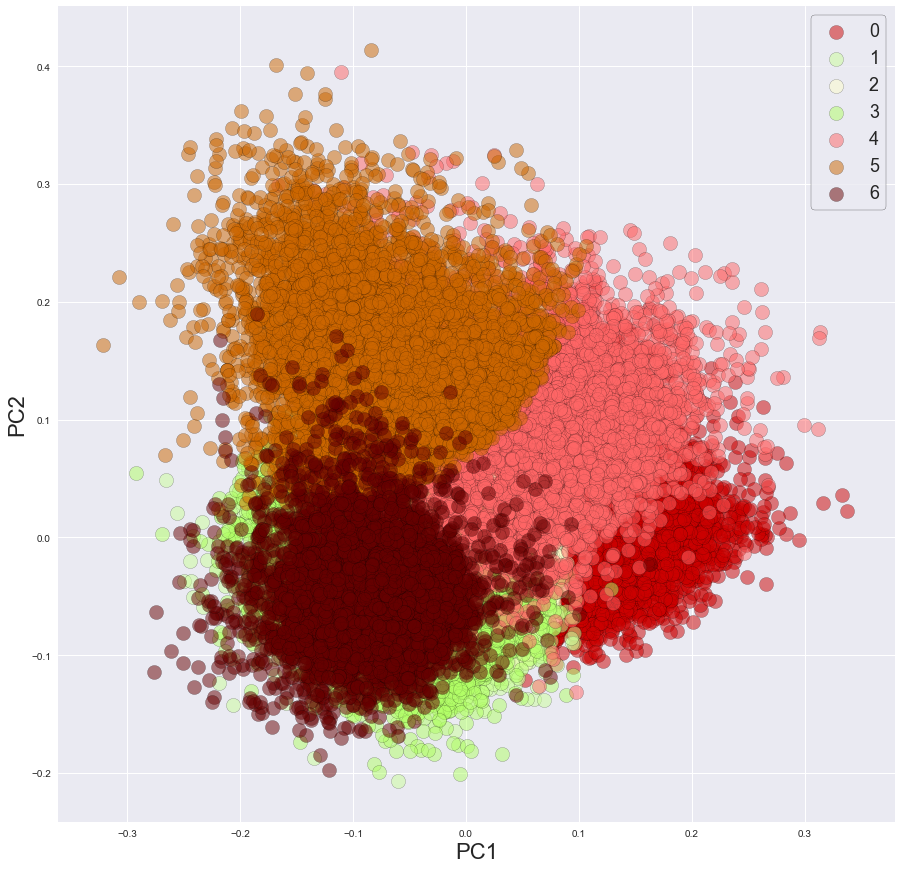

In [323]:
plt.figure(figsize=(15,15))
alpha = .5
plt.scatter(pca7_result[df_pca7.km_labels==0, 0], 
            pca7_result[df_pca7.km_labels==0, 1],
           alpha=alpha, c='#CC0000', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==1, 0], 
            pca7_result[df_pca7.km_labels==1, 1],
           alpha=alpha, c='#CCFF99', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==2, 0], 
            pca7_result[df_pca7.km_labels==2, 1],
           alpha=alpha, c='#FFFFCC', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==3, 0], 
            pca7_result[df_pca7.km_labels==3, 1],
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==4, 0], 
            pca7_result[df_pca7.km_labels==4, 1],
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==5, 0], 
            pca7_result[df_pca7.km_labels==5, 1],
           alpha=alpha, c='#CC6600', s=200, edgecolor='k')
plt.scatter(pca7_result[df_pca7.km_labels==6, 0], 
            pca7_result[df_pca7.km_labels==6, 1],
           alpha=alpha, c='#660000', s=200, edgecolor='k')


plt.legend(labels=[0,1,2,3,4,5,6], fontsize=18, frameon=True, edgecolor='k')
plt.xlabel('PC1', fontsize=22)
plt.ylabel('PC2', fontsize=22)

### km7 centers and variances

In [561]:
km_center7 = []
km_var7 = []
km_inertia7 = []
for i in range(7):
    subset_i = df_pca7[df_pca7.km_labels == i]
    points = list(zip(subset_i.pca_one, subset_i.pca_two))
    centroid = [np.mean(subset_i.pca_one), np.mean(subset_i.pca_two)]
    km_center7.append(centroid)
    km_inertia7.append(inertia(points, centroid))
    km_var7.append([np.std(subset_i.pca_one), np.std(subset_i.pca_two)])

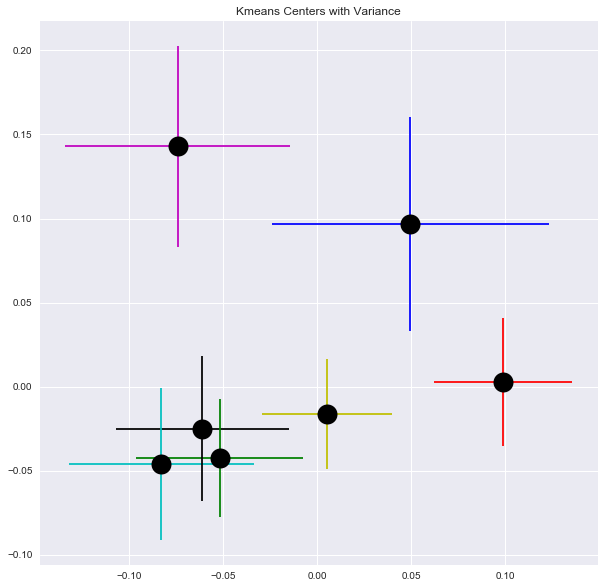

In [562]:
plt.figure(figsize=(10,10))
plt.errorbar([x[0] for x in km_center7], [x[1] for x in km_center7], 
             xerr=[x[0] for x in km_var7], yerr=[x[1] for x in km_var7],
            fmt='o', ecolor=['r','g','y','k','b','m', 'c'],color='k', markersize=20)
plt.title("Kmeans Centers with Variance")

In [563]:
wine.main_topic7[df_pca7.km_labels==0].value_counts()

lite_white    10758
med_red       10104
rich_white     1177
dessert         284
full_red        273
sparkling        74
lite_red          1
Name: main_topic7, dtype: int64

In [564]:
wine.main_topic7[df_pca7.km_labels==1].value_counts()

med_red     17206
dessert        47
lite_red       36
Name: main_topic7, dtype: int64

In [565]:
wine.main_topic7[df_pca7.km_labels==2].value_counts()

med_red       24714
lite_white      640
rich_white      597
lite_red        309
sparkling       250
full_red        229
dessert         194
Name: main_topic7, dtype: int64

In [566]:
wine.main_topic7[df_pca7.km_labels==3].value_counts()

med_red       11318
rich_white      994
lite_red        418
dessert          75
full_red         16
Name: main_topic7, dtype: int64

In [567]:
wine.main_topic7[df_pca7.km_labels==4].value_counts()

med_red       2807
lite_red      1168
lite_white    1034
sparkling      356
dessert         54
full_red        47
Name: main_topic7, dtype: int64

In [568]:
wine.main_topic7[df_pca7.km_labels==5].value_counts()

med_red      4782
sparkling    3017
dessert        21
full_red        1
Name: main_topic7, dtype: int64

In [569]:
wine.main_topic7[df_pca7.km_labels==6].value_counts()

med_red       2673
full_red      2141
rich_white       2
Name: main_topic7, dtype: int64

## Kmeans for 9 Topics

### 9 Topics for 9 Wine Weights

1. aromatic white
    * sauvignon blanc, pinot grigio, albarino, gruner vetliner
    * green veggies, roasted veggies, carbs, fish
2. light-bodied white
    * riesling, chenin blanc, moscato
    * soft cheese, carbs, cured/smoked meat, dessert
3. heavy-bodied, rich white
    * chardonnay, oaked whites, viognier
    * roasted veggies, carbs, rich fish, white meat
4. sparkling wine
    * champagne, franciacorta, prosecco, cava
    * soft cheese, hard cheese, carbs, fish
5. rosé
    * 
5. light-bodied red
    * pinot noir, grenache, pinotage, gamay
    * roasted veggies, carbs, rich fish, white meat
6. medium-bodied red
    * sangiovese, merlot, cab. franc, tempranillo
    * hard cheese, carbs, white meat, red meat, cured/smoked meat
7. full-bodied red
    * cabernet sauvignon, shiraz/syrah, zinfandel, mourvedre, aglianico
    * hard cheese, red meat, cured/smoked meat
8. dessert wine
    * port & tawny port, sherry, late harvest, tokaji
    * soft cheese, carbs, cured/smoked meat, dessert

### km9

In [269]:
(lsa9).shape

(97817, 9)

In [314]:
km9 = KMeans(n_clusters=9)
km9_model = km9.fit(lsa9)
km9_labels = km9_model.labels_

In [315]:
km9_labels

array([3, 3, 3, ..., 3, 2, 2], dtype=int32)

In [271]:
mu9 = km9.cluster_centers_

In [272]:
mu9

array([[  1.54118893e-01,   7.85078767e-02,   8.13385680e-02,
         -4.35754941e-02,   1.15746304e-01,  -3.56299897e-03,
          3.35674868e-02,  -1.51755025e-02,  -7.24534594e-03],
       [  1.28130382e-01,   4.90491261e-02,  -3.06817360e-02,
          9.83887084e-02,   6.72636655e-03,   6.15191403e-02,
         -1.58767790e-02,  -9.44086277e-03,   5.09547540e-02],
       [  1.63110979e-01,  -4.95126473e-02,   1.48123564e-01,
         -9.65689822e-03,  -2.38933043e-02,   9.45843393e-03,
         -2.20852299e-02,  -9.07945449e-03,   1.80231452e-02],
       [  8.37140327e-02,   4.16669422e-03,  -7.19830348e-03,
          4.60053776e-03,  -5.48439217e-03,  -4.36935111e-03,
         -4.54125509e-03,  -8.57406182e-04,   4.47878871e-03],
       [  1.56350828e-01,  -6.80541070e-02,  -4.69763681e-02,
         -6.80897313e-03,  -4.28342139e-02,  -2.82945372e-02,
          1.49146629e-01,  -6.14951202e-02,   2.59032138e-02],
       [  1.06192154e-01,   1.12667372e-01,  -6.04657356e-03,
   

In [273]:
# are these all equally represented?
unique, counts = np.unique(km9.labels_, return_counts=True)
np.asarray((unique, counts)).T

array([[    0,  4926],
       [    1,  7138],
       [    2,  7288],
       [    3, 23640],
       [    4,  4627],
       [    5, 18243],
       [    6, 11754],
       [    7, 10163],
       [    8, 10038]])

### PCA9 labeled by km9

In [319]:
df_pca9['km_labels'] = km9_labels
df_pca9.head()

,pca_one,pca_two,topic_color,km_labels,topic_main
0,-0.019632,0.019540,#CC0000,3,lite_red
1,-0.068168,0.012341,#CC0000,3,lite_red
2,0.055076,0.003853,#CC0000,3,lite_red
3,-0.111292,-0.013655,#CC0000,6,lite_red
4,-0.008581,0.088718,#FFFFCC,3,sparkling


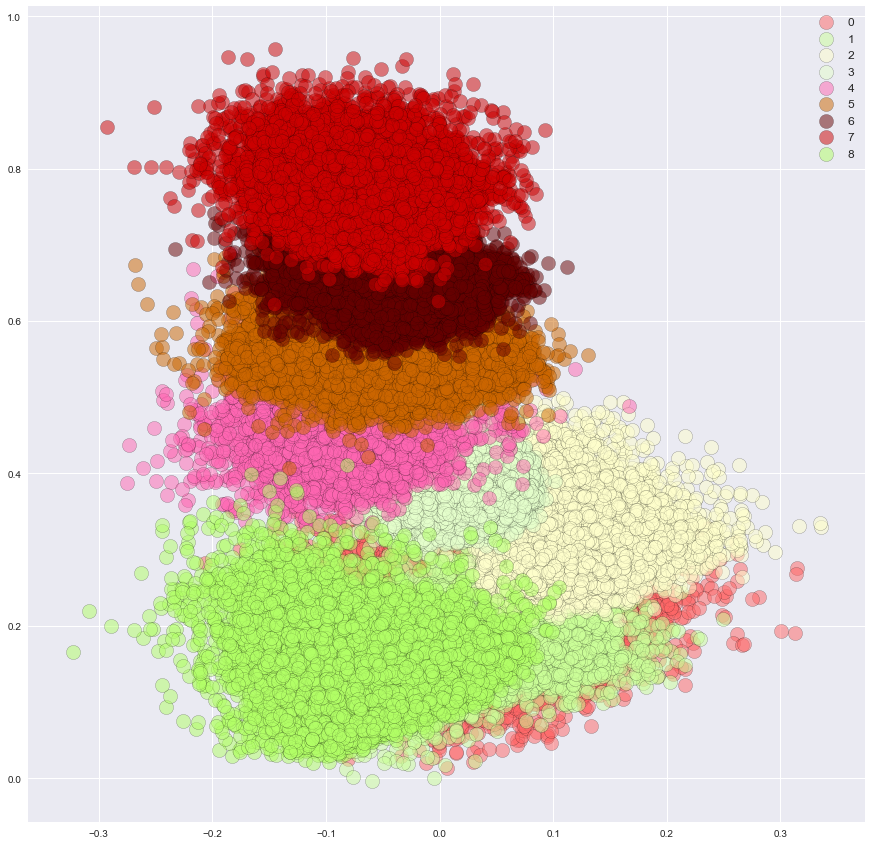

In [322]:
plt.figure(figsize=(15,15))
alpha = .5
plt.scatter(pca9_result[df_pca9.km_labels==0, 0], 
            pca9_result[df_pca9.km_labels==0, 1]+.1,
           alpha=alpha, c='#FF6666', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==1, 0], 
            pca9_result[df_pca9.km_labels==1, 1]+.2,
           alpha=alpha, c='#CCFF99', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==2, 0], 
            pca9_result[df_pca9.km_labels==2, 1]+.3,
           alpha=alpha, c='#FFFFCC', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==3, 0], 
            pca9_result[df_pca9.km_labels==3, 1]+.4,
           alpha=alpha, c='#E5FFCC', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==4, 0], 
            pca9_result[df_pca9.km_labels==4, 1]+.5,
           alpha=alpha, c='#FF66B2', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==5, 0], 
            pca9_result[df_pca9.km_labels==5, 1]+.6,
           alpha=alpha, c='#CC6600', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==6, 0], 
            pca9_result[df_pca9.km_labels==6, 1]+.7,
           alpha=alpha, c='#660000', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==7, 0], 
            pca9_result[df_pca9.km_labels==7, 1]+.8,
           alpha=alpha, c='#CC0000', s=200, edgecolor='k')
plt.scatter(pca9_result[df_pca9.km_labels==8, 0], 
            pca9_result[df_pca9.km_labels==8, 1],
           alpha=alpha, c='#B2FF66', s=200, edgecolor='k')

plt.legend(labels=[0,1,2,3,4,5,6,7,8], fontsize=12)

### km9 centers and variances

In [559]:
km_center9 = []
km_var9 = []
km_inertia9 = []
for i in range(9):
    subset_i = df_pca9[df_pca9.km_labels == i]
    points = list(zip(subset_i.pca_one, subset_i.pca_two))
    centroid = [np.mean(subset_i.pca_one), np.mean(subset_i.pca_two)]
    km_center9.append(centroid)
    km_inertia9.append(inertia(points, centroid))
    km_var9.append([np.std(subset_i.pca_one), np.std(subset_i.pca_two)])

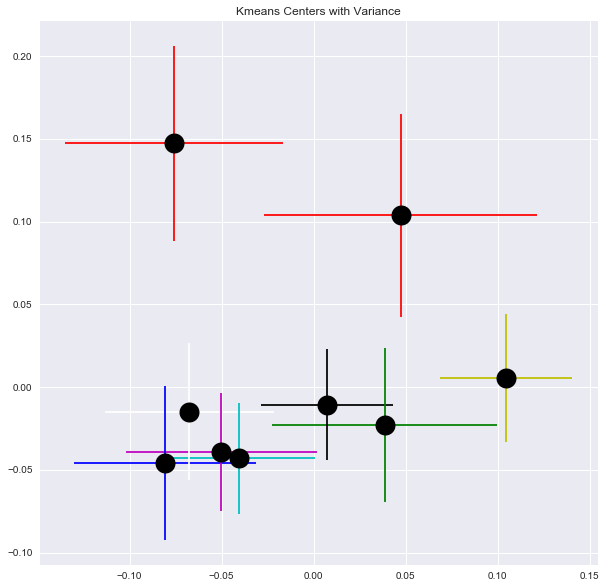

In [560]:
plt.figure(figsize=(10,10))
plt.errorbar([x[0] for x in km_center9], [x[1] for x in km_center9], 
             xerr=[x[0] for x in km_var9], yerr=[x[1] for x in km_var9],
            fmt='o', ecolor=['r','g','y','k','b','m', 'c','w','r'],color='k', markersize=20)
plt.title("Kmeans Centers with Variance")

In [570]:
wine.main_topic9[df_pca9.km_labels==0].value_counts()

lite_red      2516
rose          1103
arom_white     872
sparkling      358
full_red        44
dessert         23
full_white      11
Name: main_topic9, dtype: int64

In [571]:
wine.main_topic9[df_pca9.km_labels==1].value_counts()

lite_red      4051
lite_white    1589
arom_white     517
dessert        346
full_white     340
rose           275
full_red        17
med_red          1
sparkling        1
Name: main_topic9, dtype: int64

In [572]:
wine.main_topic9[df_pca9.km_labels==2].value_counts()

arom_white    10328
lite_red       7505
full_red        195
dessert          84
sparkling        68
med_red          55
lite_white        7
full_white        1
Name: main_topic9, dtype: int64

In [573]:
wine.main_topic9[df_pca9.km_labels==3].value_counts()

lite_red      21384
arom_white      690
lite_white      341
sparkling       311
rose            302
full_red        269
dessert         126
full_white      119
med_red         100
Name: main_topic9, dtype: int64

In [574]:
wine.main_topic9[df_pca9.km_labels==4].value_counts()

lite_red      2493
full_red      2129
full_white       3
rose             1
lite_white       1
Name: main_topic9, dtype: int64

In [575]:
wine.main_topic9[df_pca9.km_labels==5].value_counts()

lite_red      9836
med_red        196
dessert         67
rose            37
full_red        14
full_white      13
arom_white       1
Name: main_topic9, dtype: int64

In [576]:
wine.main_topic9[df_pca9.km_labels==6].value_counts()

lite_red      11702
rose             38
dessert           8
lite_white        1
arom_white        1
Name: main_topic9, dtype: int64

In [577]:
wine.main_topic9[df_pca9.km_labels==7].value_counts()

lite_red      8926
lite_white     675
med_red        257
rose           169
full_red        11
sparkling        1
Name: main_topic9, dtype: int64

In [578]:
wine.main_topic9[df_pca9.km_labels==8].value_counts()

lite_red      4306
sparkling     2965
dessert         13
full_white       4
Name: main_topic9, dtype: int64

# Recommender System

## Simple System in Python

### Create Word Lists for System

In [929]:
def main_topic_words(model, feature_names, no_top_words, topic_names=None):
    topics = {}
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            name = (ix)
        else:
            name = (topic_names[ix])
        
        topics[name] = (", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
    return topics
# modify to save topic words in lists to use in list of options for user
# user can choose (in this case) red or white and then from red or white,
# pick specific words from the red/white list to nail down the top 10 wines they should drink
# make fancier by bringing in country or price or variety names

In [ ]:
# all words in alphabetical order 
(tfidf.get_feature_names())

In [ ]:
# word probabilities in alphabetical order per topic 
model.components_

In [617]:
m = main_topic_words(model, tfidf.get_feature_names(), 100, ['Red', 'White'])

In [619]:
display_topics(model, tfidf.get_feature_names(), 100)


Topic  0
tannins, cherry, ripe, black, dry, rich, spice, soft, sweet, red, oak, blackberry, berry, fresh, good, shows, plum, crisp, texture, dark, blend, chocolate, vanilla, nose, fruity, firm, cabernet, structure, offers, character, juicy, light, bright, smooth, raspberry, pepper, balanced, touch, mouth, white, citrus, green, currant, apple, spicy, wood, tannic, fine, sauvignon, theres, clean, merlot, cherries, cola, bit, just, age, smoky, peach, aging, delicious, toast, licorice, tobacco, dense, mouthfeel, like, simple, little, long, great, balance, concentrated, creamy, elegant, complex, style, solid, leather, syrah, nice, cassis, big, pear, easy, mineral, finishes, fullbodied, tart, slightly, barrel, structured, dried, tight, ready, herbal, opens, richness, coffee, attractive

Topic  1
crisp, apple, citrus, fresh, peach, white, pear, lemon, clean, green, light, pineapple, chardonnay, lime, melon, bright, grapefruit, creamy, honey, apricot, tropical, orange, fruity, mineral, blanc,

### Word Lists: grape color, fruits, other flavors, descriptive terms, countries

In [731]:
grape_color = ['Red', 'White', 'Surprise Me']
fruits = {'apple': ['apple', 'apples'],
          'apricot': ['apricot'],
          'banana': ['banana', 'bananas'],
          'berry': ['berry', 'berries'],
          'blackberry': ['blackberry', 'blackberries'],
          'chard': ['chard'],
          'cherry': ['cherry', 'cherries'],
          'flower': ['flower', 'flowers'],
          'grapefruit': ['grapefruit','grapefruits'],
          'kiwi': ['kiwi', 'kiwis'],
          'lemon': ['lemon', 'lemons', 'lemony'],
          'lime': ['lime', 'limes'],
          'mango': ['mango'],
          'melon': ['melon', 'melons'],
          'nectarine': ['nectarine', 'nectarines'],
          'orange': ['orange', 'oranges'],
          'peach': ['peach', 'peaches'],
          'pear': ['pear', 'pears'],
          'pineapple': ['pineapple', 'pineapples'],
          'plum': ['plum', 'plums'],
          'raspberry': ['raspberry', 'raspberries'],
          'tangerine': ['tangerine', 'tangerines'],
           'None': [None]}
          
other_flavors = {'fruity': ['fruity', 'fruit', 'fruits'],
                 'almond': ['almond', 'almonds'],
                 'spice': ['spice', 'spicy', 'spiced', 'spices'],
                 'grass': ['grass'],
                 'oak': ['oak', 'oaky', 'oaked'],
                 'citrus': ['citrus', 'citrusy'],
                 'vanilla': ['vanilla'],
                 'floral': ['floral', 'flowers', 'flower'], 
                 'mineral': ['mineral', 'minerally', 'minerality'],
                 'buttered': ['butter', 'buttered', 'buttery'],
                 'toast': ['toast', 'toasted', 'toasty'],
                 'chocolate': ['chocolate', 'chocolatey'],
                 'honeysuckle': ['honeysuckle', 'honeysuckles', 'honeysuckled'],
                 'sugar': ['sugar', 'sugary'],
                 'pepper': ['pepper', 'peppery'],
                 'licorice': ['licorice'],
                 'tobacco': ['tobacco'],
                 'herbal': ['herbal', 'herbaceous'],
                 'coffee': ['coffee'],
                 'rose': ['rose', 'pink', 'rosy'],
                 'caramel': ['caramel', 'caramels'],
                 'leather': ['leather'],
                 'cola': ['cola'], 
                'None': [None]}

descriptors = {'juicy': ['juicy','juice','juices'],
               'tannic': ['tannic', 'tannin', 'tannins'],
               'ripe': ['ripe', 'ripened'],
               'rich': ['rich', 'richness'],
               'sweet': ['sweet', 'sweetness'],
               'fresh': ['fresh', 'freshness'],
               'crisp': ['crisp', 'crispy', 'crispness'],
               'dark': ['dark'],
               'dry': ['dry', 'dried', 'dryness'],
               'refreshing': ['refreshing', 'refresh', 'refreshed'],
               'light': ['light', 'lightness'],
               'simple': ['simple', 'simplicity'],
               'zest': ['zest', 'zesty'],
               'tangy': ['tang', 'tangy'],
               'creamy': ['creamy', 'creamed', 'cream'],
               'spicy': ['spicy', 'spice', 'spiced', 'spices'],
               'firm': ['firmness', 'firm'],
               'structure': ['structure', 'structured'],
               'bright': ['bright', 'brightness'], 
               'balanced': ['balanced', 'balance', 'balances'],
               'green': ['green', 'greens'],
               'lively': ['lively', 'live', 'alive'],
               'smooth': ['smooth', 'smoothly', 'smoothed', 'smoothed'],
               'tropical': ['tropical'],
               'smoky': ['smoky', 'smoke', 'smoked'],
               'fullbodied': ['fullbodied', 'full', 'fullbody'],
               'tart': ['tart', 'tartness'],
               'citrusy': ['citrusy', 'citrus'],
               'steely': ['steely'],
               'brisk': ['brisk', 'briskly'],
               'fragrant': ['fragrant', 'fragrance'],
               'delicate': ['delicate'],
               'dense': ['dense'],
               'clean': ['clean'],
              'None': [None]}
country = sorted(list(df.country.unique()))
country.append('None')

In [1066]:
with open('fruits.pk', 'wb') as pickle_file:
    pkl.dump(fruits, pickle_file)
    
with open('other_flavors.pk', 'wb') as pickle_file:
    pkl.dump(other_flavors, pickle_file)
    
with open('descriptors.pk', 'wb') as pickle_file:
    pkl.dump(descriptors, pickle_file)

### Import ipywidgets

In [935]:
from ipywidgets import widgets
from IPython.display import display
from ipywidgets import interactive
from ipywidgets import Layout
import traitlets
from ipywidgets import interact, interactive, fixed, interact_manual

### Functions for Widget Board

In [1022]:
# def submit_click(b):
#     print(wine_type.observe(on_submit, names='value'))
#     fruit_flavors.observe(on_submit, names='value'),
#     more_flavors.observe(on_submit, names='value'),
#     descriptor.observe(on_submit, names='value'),
#     countries.observe(on_submit, names='value'),
#     print(b['new'])
    
def on_submit(Submit):
    print(Submit)
    if Submit:
        w = wine_type.value
        fruit = fruit_flavors.value
        other = more_flavors.value
        descriptions = descriptor.value
        c = countries.value
    return suggest_wines(w, fruit, other, descriptions)
    
def on_value_change(change):
    print(change['new'])
    

def suggest_wines(w, fruit, other, descriptions):
#     w, fruit, other, descriptions = on_submit(Submit)
    print('Finding your perfect wines...')
    
    topic = grape_color.index(w)
    
    new_description = []
    if fruit:
        for f in fruit:
            new_description.extend(fruits[f])
    if other:
        for o in other:
            new_description.extend(other_flavors[o])
    if descriptions: 
        for d in descriptions:
            new_description.extend(descriptors[d])
    
    new_description = [' '.join(new_description)]
    new_desc_dtm = (tfidf.transform(new_description)) # convert new description to the tfidf vector space
    new_lsa = model.transform(new_desc_dtm) # transform tfidf vector into the topic space
    
    similarities = []
    for i in range(len(wine)-1):
        sim = metrics.pairwise.cosine_similarity(new_lsa, Y=lsa[i])
        sim = round(float(sim), 4)
        similarities.append(sim)
    
    sorted_wines = [b[0] for b in sorted(enumerate(similarities),key=lambda i:i[1])]
    suggested_ids = sorted_wines[:11]
    
    pd.set_option('display.max_colwidth', -1)
    for suggestion in suggested_ids:
        print('\n Variety: ' + (wine['variety'].iloc[suggestion]))
        print('\n Designation: ' + (df2['designation'].iloc[suggestion]))
        print('\n Winery: ' + (df2['winery'].iloc[suggestion]))
        print('\n Description: ' + (wine['description'].iloc[suggestion]))
    
    return # wine.iloc[suggested_ids]
    
    

In [1018]:
df2 = df.copy(deep=True)
df2['description'] = apply_regex(df2.description)
df2 = df2.drop_duplicates(subset=['description'])

In [1019]:
df2.reset_index(inplace=True)

In [947]:
import pickle as pkl
with open('vectorizer.pk', 'wb') as fin:
    pkl.dump(tfidf, fin)

In [948]:
with open('model.pk', 'wb') as fin:
    pkl.dump(model, fin)

In [949]:
with open('lsa.pk', 'wb') as fin:
    pkl.dump(lsa, fin)

In [950]:
with open('wine.pk', 'wb') as fin:
    pkl.dump(wine, fin)

In [1023]:
with open('df2.pk', 'wb') as fin:
    pkl.dump(df2, fin)

### Create Buttons

In [941]:
wine_type = widgets.ToggleButtons(
    options=grape_color,
    description='Select Wine Type:',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltips=['Red', 'White', 'Surprise Me'],
)

ff = sorted(list(fruits.keys()))
fruit_flavors = widgets.SelectMultiple(
    options=ff,
    value=['apricot'],
    description='fruit flavors'
)

of = sorted(list(other_flavors.keys()))
more_flavors = widgets.SelectMultiple(
    options=of,
    value=['oak'],
    description='other flavors'
)

d = sorted(list(descriptors.keys()))
descriptor = widgets.SelectMultiple(
    options=d,
    value=['sweet'],
    description='descriptive terms',
    layout=Layout(display="flex") #, flex_flow='column')
)

# countries = widgets.SelectMultiple(
#     options=country,
#     value=['US'],
#     description='Select A Country'
# )

accordion = widgets.Accordion(children=[wine_type, fruit_flavors, more_flavors, descriptor])
accordion.set_title(0, 'Choose a type of wine')
accordion.set_title(1, 'Choose one or more fruit flavors')
accordion.set_title(2, 'Choose one or more other flavors')
accordion.set_title(3, 'Choose one or more descriptive terms')
# accordion.set_title(4, 'Choose a country if you like')

In [943]:
display(accordion)
interact_manual(on_submit, Submit=False); #finished.value

Widget Javascript not detected.  It may not be installed or enabled properly.


Widget Javascript not detected.  It may not be installed or enabled properly.


In [625]:
# df.country.fillna('Unknown', inplace=True)

## 2 Topic Similarity Calculations

In [608]:
df_lsa2 = pd.DataFrame(lsa)
df_lsa2.head()
# df_lsa2.to_csv('lsa2_2.csv')

,0,1
0,0.108791,-0.014734
1,0.138854,-0.058812
2,0.070886,0.050132
3,0.142124,-0.104443
4,0.058874,-0.014284


In [362]:
wine_ids = list(range(len(lsa)))

In [380]:
wine.head()

,description,country,price,variety,main_var,topic1,topic2,country_colors,main_topic7,main_topic9,pca9_1,pca9_2,pca7_1,pca7_2,pca5_1,pca5_2,main_topic5
0,this tremendous varietal wine hails from oak...,us,235.0,cabernet sauvignon,cabernet sauvignon,0.108791,-0.014734,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,-0.019632,0.019540,-0.018969,0.019431,-0.019540,0.019913,med_red
1,ripe aromas of fig blackberry and cassis are s...,spain,110.0,tinta de toro,tempranillo,0.138854,-0.058812,"[0.701960784314, 0.870588235294, 0.41176470588...",med_red,lite_red,-0.068168,0.012341,-0.068346,0.014673,-0.066971,0.012627,med_red
2,mac watson honors the memory of a wine once ma...,us,90.0,sauvignon blanc,sauvignon,0.070886,0.050132,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,0.055076,0.003853,0.055293,0.005433,0.056124,0.004408,med_red
3,this spent months in new french oak and in...,us,65.0,pinot noir,pinot noir,0.142124,-0.104443,"[0.745098039216, 0.729411764706, 0.85490196078...",med_red,lite_red,-0.111292,-0.013655,-0.110848,-0.012929,-0.110594,-0.014514,med_red
4,this is the top wine from la bégude named afte...,france,66.0,provence red blend,provence red blend,0.058874,-0.014284,"[0.992156862745, 0.705882352941, 0.38431372549...",sparkling,sparkling,-0.008581,0.088718,-0.008401,0.088716,-0.009014,0.089782,full_red


In [475]:
with open("similarity_test.csv", "a") as f:
    writer = csv.writer(f, delimiter=',')
    writer.writerow(['wine1', 'wine2', 'similarity'])
    for i in range(0, 10):
        for j in range(i+1, 11):
            similarity = metrics.pairwise.cosine_similarity(lsa[i], Y=lsa[j], dense_output=True)
            writer.writerow([i, j, round(float(similarity),4)])

In [606]:
lsa[0]

array([ 0.10879057, -0.01473437])

In [483]:
df_similarity2 = pd.DataFrame(columns = ['wine1', 'wine2', 'similarity'])
df_similarity2.head()

,wine1,wine2,similarity


In [ ]:
for i in range(0, len(wine_ids)-1):
    if i%100 == 0:
        print('writing line: ' + str(i))
    for j in range(i+1, len(wine_ids)):
        similarity = metrics.pairwise.cosine_similarity(lsa[i], Y=lsa[j])
        sim = round(float(similarity),4)
        df_similarity2[i] = [i, j, sim]

In [486]:
i

13

In [ ]:
with open("similarity_2topic.csv", "w") as f:
    writer = csv.writer(f, delimiter=',')
    writer.writerow(['wine1', 'wine2', 'similarity'])
    for i in range(0, len(wine_ids)-1):
        if i%100 == 0:
            print('writing line: ' + str(i))
        for j in range(i+1, len(wine_ids)):
            similarity = metrics.pairwise.cosine_similarity(lsa[i], Y=lsa[j])
            sim = round(float(similarity),4)
            writer.writerow([i, j, sim])
        

In [482]:
i # stopped at 1,151

960

In [355]:
sim0 = []
for i, x in enumerate(wine.variety):
    sim0.append(float(metrics.pairwise.cosine_similarity(lsa[i], Y=lsa[0], dense_output=True)))
    
# list(sorted(sim0, key=lambda x: x[2], reverse=True))[0:6]

In [ ]:
sim0

In [331]:
sim1 = []
for i, x in enumerate(wine.variety):
    sim1.append([i,x, metrics.pairwise.cosine_similarity(lsa5[i], Y=lsa5[0], dense_output=True)])
    
list(sorted(sim1, key=lambda x: x[2], reverse=True))[0:6]

[[0, 'cabernet sauvignon', array([[ 1.]])],
 [95412, 'pinot noir', array([[ 0.99832555]])],
 [15499, 'dolcetto', array([[ 0.9971878]])],
 [829, 'pinot noir', array([[ 0.9970751]])],
 [1837, 'bordeaux style red blend', array([[ 0.99700635]])],
 [26654, 'pinot noir', array([[ 0.99675757]])]]

In [330]:
sim2 = []
for i, x in enumerate(wine.variety):
    sim2.append([i,x, metrics.pairwise.cosine_similarity(lsa7[i], Y=lsa7[0], dense_output=True)])
    
list(sorted(sim2, key=lambda x: x[2], reverse=True))[0:6]

[[0, 'cabernet sauvignon', array([[ 1.]])],
 [14518, 'dolcetto', array([[ 0.99651104]])],
 [96137, 'bordeaux style red blend', array([[ 0.99030212]])],
 [18538, 'pinot noir', array([[ 0.98912761]])],
 [62354, 'pinot noir', array([[ 0.98880345]])],
 [95412, 'pinot noir', array([[ 0.98865494]])]]

In [332]:
sim3 = []
for i, x in enumerate(wine.variety):
    sim3.append([i,x, metrics.pairwise.cosine_similarity(lsa9[i], Y=lsa9[0], dense_output=True)])
    
list(sorted(sim3, key=lambda x: x[2], reverse=True))[0:6]

[[0, 'cabernet sauvignon', array([[ 1.]])],
 [80873, 'pinot noir', array([[ 0.96757479]])],
 [80286, 'portuguese red', array([[ 0.96702468]])],
 [10503, 'pinot noir', array([[ 0.96593763]])],
 [7458, 'pinot noir', array([[ 0.96474009]])],
 [52994, 'cabernet sauvignon', array([[ 0.9640139]])]]

# Extra Code

In [110]:
## when topic_num=300, i took the top 3 topics for each document
# top3 = []
# for i in range(len(lsa_df_tfidf1b)):
#     sort_index = (np.argsort(lsa_df_tfidf1b.iloc[i])).tolist()
#     top3.append(sort_index[:3])
    
# top3_df = pd.DataFrame(top3)
# top3_df.head()

In [ ]:
# plotting kmeans errors SSE and inertia

# SSEs2 = []
# # rev_coefs = []
# for k in range(2,20):
#     km = KMeans(n_clusters=k, random_state=1)
#     km.fit(tfidf1_lsa)
#     labels = km.labels_
# #     rev_coefs.append(metrics.(wine_count_cv1, labels, metric='euclidean'))
#     SSEs2.append(km.inertia_) # The SSE is just inertia, we
#                                             # could have just said km.inertia_
        
# fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5), sharex=True)
# k_clusters = range(2,20)
# # ax1.plot(k_clusters, rev_coefs)
# # ax1.set_xlabel('number of clusters')
# # ax1.set_ylabel('review coefficient')

# # plot here on ax2
# ax2.plot(k_clusters, SSEs2)
# ax2.set_xlabel('number of clusters')
# ax2.set_ylabel('SSE');